# Generate Publication Figures <a class="tocSkip">

Generate publication figures using loaded data -- see accompanying notebooks for analysis steps and intermediate figures

Author: Kevin Hoffer-Hawlik

In [1]:
# ! zip -r fig.zip fig

## Setup

In [ ]:
# uncomment for interactive 3D plots
# %matplotlib notebook

import warnings
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import scvi
import seaborn as sns
import scipy.stats
import pickle
import seaborn as sns
import decipher as dc

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

/home/kh3205/anaconda3/envs/decipher/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/kh3205/anaconda3/envs/decipher/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/kh3205/anaconda3/envs/decipher/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sns.set_style("ticks")

In [4]:
warnings.simplefilter(action='ignore',)

In [5]:
warnings.simplefilter(action='ignore',)

## Load data and set global settings

In [6]:
clinical_outcomes = pd.read_csv("clin_022625.csv")
clinical_outcomes.set_index(keys = 'sample', inplace=True)

In [7]:
tcells_filepath = 'tcells_scvi_annotated_041023.h5ad'
marker_genes_filepath = 'marker_genes_dict_030823.pickle'

tcells = sc.read_h5ad(tcells_filepath)

with open(marker_genes_filepath, 'rb') as handle:
    tcell_marker_genes = pickle.load(handle)

In [8]:
signatures = ["activation_markers_z_score_scvi_normalized",
              "exhaustion_markers_z_score_scvi_normalized",
              "CD8_T_cell_activation_z_score_scvi_normalized",
              "Type_II_interferon_response_z_score_scvi_normalized",
              "Exhaustion/Terminal_differentiation_z_score_scvi_normalized",
              "CD8_TIL_dysfunction_z_score_scvi_normalized",
              "T_cell_co-inhibitory_receptors_z_score_scvi_normalized",
              "naive_markers_z_score_scvi_normalized",
              "effector_cytokines_z_score_scvi_normalized",
              
              "Terminal_exhaustion_z_score_scvi_normalized", 
              "Precursor_exhaustion_z_score_scvi_normalized", 
              "T_naive_z_score_scvi_normalized", 
              "T_stem_central_memory_z_score_scvi_normalized", 
              "T_central_memory_z_score_scvi_normalized", 
              "T_effector_memory_z_score_scvi_normalized", 
              "T_terminal_effector_z_score_scvi_normalized", 
             ]

full_signatures = [s + '_z_score_scvi_normalized' for s in list(tcell_marker_genes.keys())[1:]]

In [9]:
cohort = sc.read_h5ad('unprocessed/data_melanoma_integrated_RPCA_v4.h5ad')
cohort.shape

(305218, 35675)

In [10]:
cohort.obs['cell_type_main'].value_counts()

cell_type_main
Tumor cells          246215
T/NK cells            23081
Myeloid cells         18294
Stromal cells         10026
B/Plasma cells         4287
Endothelial cells      2365
Epithelial cells        503
pDCs                    447
Name: count, dtype: int64

In [11]:
cohort.obs[['cell_type_main','cell_type_fine']].value_counts(sort=False)

cell_type_main     cell_type_fine               
B/Plasma cells     Class-switched memory B cells       328
                   Cycling cells                       111
                   Memory B cells                     1048
                   Naive B cells                       135
                   Plasma cells                       2665
Endothelial cells  Arterial EC                         187
                   Capillary EC                        969
                   Cycling cells                        59
                   Lymphatic EC                        287
                   Venous EC                           863
Epithelial cells   Epithelial cells                    503
Myeloid cells      DC3                                 436
                   Macrophages (M1-like)              1317
                   Macrophages (M2-like)              1544
                   Macrophages (antigen-pres.)        4424
                   Macrophages (cycling)              1021
       

In [12]:
cd8_dcs = sc.read_h5ad('cd8_downsampled_051723.h5ad')
cd8_dcs.shape

(8188, 8170)

In [13]:
cd4_dcs = sc.read_h5ad('cd4_downsampled_052223.h5ad')
cd4_dcs.shape

(7593, 8170)

In [ ]:
tcells_decipher = sc.read_h5ad('tcells_decipher_041024.h5ad')
tcells_decipher.shape

(20512, 8170)

In [ ]:
myeloid_filepath = 'myeloid_scvi_annotated_032025.h5ad'
myeloid = sc.read_h5ad(myeloid_filepath)
myeloid.shape

(18152, 2041)

In [ ]:
# myeloid_decipher_filepath = 'myeloid_decipher_rotated_dpt_basis_decomp_032125.h5ad' # includes all patients -- load to visualize with F26 patient distortion
myeloid_decipher_filepath = 'myeloid_decipher_rotated_dpt_basis_decomp_040225.h5ad' # does not include outlier mucosal F26 patient
myeloid_decipher = sc.read_h5ad(myeloid_decipher_filepath)
myeloid_decipher.shape

(14583, 2027)

In [17]:
myeloid_signatures = pd.read_csv('myeloid_signatures.csv')
myeloid_signatures_list = list(myeloid_signatures.columns[:-11])
for i, s in enumerate(myeloid_signatures_list): # for compatibility with input ad
    myeloid_signatures_list[i] = s + "1"

In [18]:
LT_myeloid_signatures = pd.read_excel('Cell_Type_Markers_Myeloid.xlsx')
LT_myeloid_signatures = LT_myeloid_signatures.to_dict('list')
LT_myeloid_signatures_list = list(LT_myeloid_signatures.keys())
for sig in LT_myeloid_signatures_list: 
    LT_myeloid_signatures[sig] = [x for x in LT_myeloid_signatures[sig] if str(x) != 'nan']
#set(myeloid_signatures.loc[:,'Monocytes'].dropna()) & set(ad.var_names)

In [19]:
myeloid_marker_genes_list = [item for sublist in LT_myeloid_signatures.values() for item in sublist]
myeloid_marker_genes_list = set(myeloid_marker_genes_list) & set(myeloid_signatures.values.flatten()) & set(myeloid.var_names)
myeloid_marker_genes_list = list(myeloid_marker_genes_list)

In [ ]:
# KUL_CUIMC_cd8_diffmap = sc.read_h5ad('KUL_CUIMC_cd8_diffmap.h5ad') # load to make visualizations with unintegrated KUL cluster
KUL_CUIMC_cd8_diffmap = sc.read_h5ad('KUL_CUIMC_cd8_diffmap_noGZ.h5ad')

In [ ]:
# randomize layout of cells for each plot and harmonize clinical metadata
np.random.seed(0)

for adata in [cohort, tcells, myeloid, cd8_dcs, cd4_dcs, tcells_decipher, myeloid_decipher]:
    adata.obs['time'] = adata.obs['sample'].replace(clinical_outcomes['time'])
    adata.obs['treated'] = adata.obs['sample'].replace(clinical_outcomes['treated'])
    adata.obs['responder'] = adata.obs['sample'].replace(clinical_outcomes['responder'])
    adata.obs['treat_resp'] = adata.obs['sample'].replace(clinical_outcomes['treat_resp'])

f = KUL_CUIMC_cd8_diffmap.obs['batch'] == 'CUIMC' # only change CUIMC cohort
KUL_CUIMC_cd8_diffmap.obs.loc[f,'treated'] = KUL_CUIMC_cd8_diffmap.obs.loc[f,'sample'].replace(clinical_outcomes['treated']).astype('str')
KUL_CUIMC_cd8_diffmap.obs.loc[f,'responder'] = KUL_CUIMC_cd8_diffmap.obs.loc[f,'sample'].replace(clinical_outcomes['responder']).astype('str')
KUL_CUIMC_cd8_diffmap.obs.loc[f,'treat_resp'] = KUL_CUIMC_cd8_diffmap.obs.loc[f,'sample'].replace(clinical_outcomes['treat_resp']).astype('str')

cohort_random_indices=np.random.permutation(list(range(cohort.shape[0])))
cohort = cohort[cohort_random_indices]

tcells_random_indices=np.random.permutation(list(range(tcells.shape[0])))
tcells = tcells[tcells_random_indices]

myeloid_random_indices=np.random.permutation(list(range(myeloid.shape[0])))
myeloid = myeloid[myeloid_random_indices]

cd8_dcs_random_indices=np.random.permutation(list(range(cd8_dcs.shape[0])))
cd8_dcs = cd8_dcs[cd8_dcs_random_indices]

cd4_dcs_random_indices=np.random.permutation(list(range(cd4_dcs.shape[0])))
cd4_dcs = cd4_dcs[cd4_dcs_random_indices]

tcells_decipher_random_indices=np.random.permutation(list(range(tcells_decipher.shape[0])))
tcells_decipher = tcells_decipher[tcells_decipher_random_indices]

myeloid_decipher_random_indices=np.random.permutation(list(range(myeloid_decipher.shape[0])))
myeloid_decipher = myeloid_decipher[myeloid_decipher_random_indices]

KUL_CUIMC_cd8_diffmap_random_indices=np.random.permutation(list(range(KUL_CUIMC_cd8_diffmap.shape[0])))
KUL_CUIMC_cd8_diffmap = KUL_CUIMC_cd8_diffmap[KUL_CUIMC_cd8_diffmap_random_indices]

In [ ]:
# rename and order categories as follows
# set color dictionaries
clinical_variable_palette = {
    'Expanded': 'firebrick',
    'Non-expanded': 'salmon',
    'TCR Not Available': 'lightgray',
    'Pre ICI': '#7f7f7f', # grey
    'On ICI': '#1f77b4', # blue
    'Post ICI': '#2ca02c', # green
    'Responder': 'midnightblue',
    'Non-responder': 'lightsteelblue',
    'LN': 'red',
    'Liver': 'darkorange',
    'Mucosal (oral)': 'green',
    'Mucosal (rectal)': 'darkgreen',
    'Skin':'steelblue',
    'Untreated': '#7f7f7f', # grey
    'Treated': '#1f77b4', # blue
}
clinical_variable_cmaps = {
    'time_to_ICI': 'plasma', # 'rocket'
    'OS': 'plasma', # 'rocket'
}

immune_cell_type_palette = {
    'CD4+ T(cm)': 'navajowhite',
    'CD4+ T': 'darkorange',
    'Treg': 'red', # trajectory color
    'CD8+ T(cm)': 'lightskyblue',
    'CD8+ T': 'blue',
    'NK_1': 'lightgreen',
    'NK_2': 'darkgreen',
    'Cycling Immune Cell': 'indigo',
    'CD4': 'darkorange', # trajectory color
    'CD8': 'blue' # trajectory color
}

myeloid_cell_type_palette = {
    'Monocyte': 'mediumpurple',
    'cDC1': 'lightgreen',
    'cDC2': 'lightseagreen',
    'DC3': 'darkgreen',
    'Antigen-presenting Macrophage': 'navajowhite',
    'Phagocytic Macrophage': 'darkorange',
    'M1-like Macrophage': 'red',
    'M2-like Macrophage': 'blue',
    'Cycling Myeloid': 'indigo',
    'Monocyte-M1':'red', # trajectory color
    'Monocyte-M2':'blue', # trajectory color
}
 
myeloid_cell_type_decipher_palette = {
    'Monocyte': 'tab:blue',
    'Antigen-presenting Macrophage': 'tab:orange',
    'Phagocytic Macrophage': 'tab:green',
    'M1-like Macrophage': 'tab:red',
    'M2-like Macrophage': 'tab:purple',
}

In [26]:
# done

# Cohort visualization 

## Figure 1B- global UMAPs

In [38]:
sc.settings.figdir = 'fig/1- Global'
sc.set_figure_params(figsize = (12,8), dpi_save = 300, format = 'pdf', transparent = True)

In [28]:
cohort_viz = cohort.copy()
cohort_viz.shape

(305218, 35675)

In [29]:
sc.pp.highly_variable_genes(cohort_viz, flavor='seurat', batch_key = 'patient', n_top_genes = 2000, subset=True, inplace=True)

... storing 'orig.ident' as categorical
... storing 'sample' as categorical
... storing 'condition' as categorical
... storing 'barcode_orig' as categorical
... storing 'RNA_snn_res.0.8' as categorical
... storing 'clonotype_id' as categorical
... storing 'chain' as categorical
... storing 'v_gene' as categorical
... storing 'd_gene' as categorical
... storing 'j_gene' as categorical
... storing 'c_gene' as categorical
... storing 'cdr3s_aa' as categorical
... storing 'cdr3s_nt' as categorical
... storing 'inkt_evidence' as categorical
... storing 'mait_evidence' as categorical
... storing 'tcr' as categorical
... storing 'mait' as categorical
... storing 'inkt' as categorical
... storing 'both_chains' as categorical
... storing 'clone_size' as categorical
... storing 'mait_inkt' as categorical
... storing 'celltype_bped_main' as categorical
... storing 'celltype_bped_fine' as categorical
... storing 'celltype_hpca_main' as categorical
... storing 'celltype_hpca_fine' as categorical
..

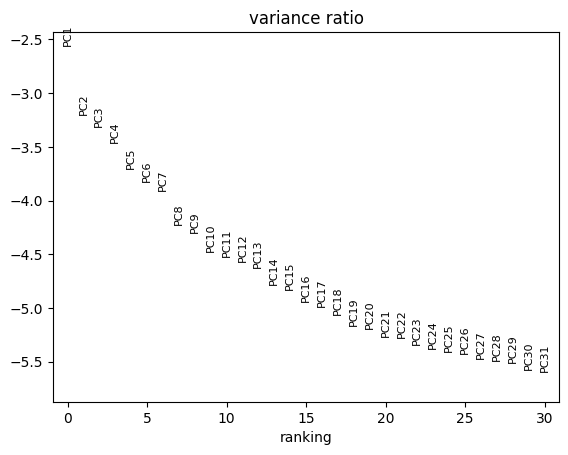

In [30]:
sc.tl.pca(cohort_viz)
sc.pl.pca_variance_ratio(cohort_viz, log=True)

In [31]:
sc.pp.neighbors(cohort_viz, n_neighbors=10, n_pcs=30)
sc.tl.umap(cohort_viz)

In [46]:
sc.pl.umap(cohort_viz, color='patient', s=5, save='_cohort_pt.pdf', show=False);

2025-03-12 15:56:47,327 | INFO : maxp pruned
2025-03-12 15:56:47,337 | INFO : cmap pruned
2025-03-12 15:56:47,337 | INFO : kern dropped
2025-03-12 15:56:47,338 | INFO : post pruned
2025-03-12 15:56:47,338 | INFO : FFTM dropped
2025-03-12 15:56:47,340 | INFO : GPOS pruned
2025-03-12 15:56:47,343 | INFO : GSUB pruned
2025-03-12 15:56:47,350 | INFO : glyf pruned
2025-03-12 15:56:47,351 | INFO : Added gid0 to subset
2025-03-12 15:56:47,351 | INFO : Added first four glyphs to subset
2025-03-12 15:56:47,352 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-03-12 15:56:47,352 | INFO : Glyph names: ['.notdef', '.null', 'A', 'F', 'M', 'P', 'R', 'U', 'a', 'e', 'eight', 'five', 'four', 'i', 'n', 'nine', 'nonmarkingreturn', 'one', 'p', 'seven', 'six', 'space', 't', 'three', 'two', 'zero']
2025-03-12 15:56:47,353 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 41, 48, 51, 53, 56, 68, 72, 76, 81, 83, 87]
2025-03-12 15:56:47,356 | INFO : Closed glyph list o

In [47]:
sc.pl.umap(cohort_viz, color='cell_type_main', s=5, save='_cohort_ct_main.pdf', show=False);

2025-03-12 15:57:22,424 | INFO : maxp pruned
2025-03-12 15:57:22,433 | INFO : cmap pruned
2025-03-12 15:57:22,434 | INFO : kern dropped
2025-03-12 15:57:22,434 | INFO : post pruned
2025-03-12 15:57:22,434 | INFO : FFTM dropped
2025-03-12 15:57:22,436 | INFO : GPOS pruned
2025-03-12 15:57:22,440 | INFO : GSUB pruned
2025-03-12 15:57:22,445 | INFO : glyf pruned
2025-03-12 15:57:22,446 | INFO : Added gid0 to subset
2025-03-12 15:57:22,446 | INFO : Added first four glyphs to subset
2025-03-12 15:57:22,447 | INFO : Closing glyph list over 'GSUB': 36 glyphs before
2025-03-12 15:57:22,447 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'K', 'M', 'N', 'P', 'S', 'T', 'U', 'a', 'c', 'd', 'e', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'slash', 'space', 't', 'two', 'u', 'underscore', 'y']
2025-03-12 15:57:22,448 | INFO : Glyph IDs:   [0, 1, 2, 3, 18, 20, 21, 36, 37, 38, 39, 40, 46, 48, 49, 51, 54, 55, 56, 66, 68, 70, 71, 72, 75, 76, 79, 80, 81, 82,

In [48]:
sc.pl.umap(cohort_viz, color='immune', s=5, save='_cohort_immune.pdf', show=False);
sc.pl.umap(cohort_viz, color='malignant', s=5, save='_cohort_nonmalig.pdf', show=False);

2025-03-12 15:57:26,855 | INFO : maxp pruned
2025-03-12 15:57:26,864 | INFO : cmap pruned
2025-03-12 15:57:26,865 | INFO : kern dropped
2025-03-12 15:57:26,865 | INFO : post pruned
2025-03-12 15:57:26,865 | INFO : FFTM dropped
2025-03-12 15:57:26,867 | INFO : GPOS pruned
2025-03-12 15:57:26,870 | INFO : GSUB pruned
2025-03-12 15:57:26,878 | INFO : glyf pruned
2025-03-12 15:57:26,878 | INFO : Added gid0 to subset
2025-03-12 15:57:26,879 | INFO : Added first four glyphs to subset
2025-03-12 15:57:26,879 | INFO : Closing glyph list over 'GSUB': 17 glyphs before
2025-03-12 15:57:26,879 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'U', 'e', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'space', 'two', 'u']
2025-03-12 15:57:26,880 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 36, 48, 51, 56, 72, 76, 80, 81, 82, 88]
2025-03-12 15:57:26,883 | INFO : Closed glyph list over 'GSUB': 17 glyphs after
2025-03-12 15:57:26,883 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M

2025-03-12 15:57:31,237 | INFO : maxp pruned
2025-03-12 15:57:31,246 | INFO : cmap pruned
2025-03-12 15:57:31,246 | INFO : kern dropped
2025-03-12 15:57:31,247 | INFO : post pruned
2025-03-12 15:57:31,247 | INFO : FFTM dropped
2025-03-12 15:57:31,249 | INFO : GPOS pruned
2025-03-12 15:57:31,252 | INFO : GSUB pruned
2025-03-12 15:57:31,259 | INFO : glyf pruned
2025-03-12 15:57:31,260 | INFO : Added gid0 to subset
2025-03-12 15:57:31,260 | INFO : Added first four glyphs to subset
2025-03-12 15:57:31,261 | INFO : Closing glyph list over 'GSUB': 19 glyphs before
2025-03-12 15:57:31,261 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'U', 'a', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'space', 't', 'two']
2025-03-12 15:57:31,262 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 36, 48, 51, 56, 68, 74, 76, 79, 80, 81, 82, 87]
2025-03-12 15:57:31,265 | INFO : Closed glyph list over 'GSUB': 19 glyphs after
2025-03-12 15:57:31,265 | INFO : Glyph names: ['.notdef'

In [35]:
nonmalignant = cohort[cohort.obs['malignant']=='non-malignant']

sc.pp.highly_variable_genes(nonmalignant, flavor='seurat', batch_key = 'patient', n_top_genes = 2000, subset=True, inplace=True)

... storing 'orig.ident' as categorical
... storing 'sample' as categorical
... storing 'condition' as categorical
... storing 'barcode_orig' as categorical
... storing 'RNA_snn_res.0.8' as categorical
... storing 'clonotype_id' as categorical
... storing 'chain' as categorical
... storing 'v_gene' as categorical
... storing 'd_gene' as categorical
... storing 'j_gene' as categorical
... storing 'c_gene' as categorical
... storing 'cdr3s_aa' as categorical
... storing 'cdr3s_nt' as categorical
... storing 'inkt_evidence' as categorical
... storing 'mait_evidence' as categorical
... storing 'tcr' as categorical
... storing 'mait' as categorical
... storing 'inkt' as categorical
... storing 'both_chains' as categorical
... storing 'clone_size' as categorical
... storing 'mait_inkt' as categorical
... storing 'celltype_bped_main' as categorical
... storing 'celltype_bped_fine' as categorical
... storing 'celltype_hpca_main' as categorical
... storing 'celltype_hpca_fine' as categorical
..

In [36]:
sc.tl.pca(nonmalignant)
sc.pp.neighbors(nonmalignant, n_neighbors=10, n_pcs=30)
sc.tl.umap(nonmalignant)

In [51]:
sc.pl.umap(nonmalignant, color='cell_type_main', s=10, save='_nonmalig_ct_main.pdf', show=False);

2025-03-12 15:58:16,778 | INFO : maxp pruned
2025-03-12 15:58:16,786 | INFO : cmap pruned
2025-03-12 15:58:16,787 | INFO : kern dropped
2025-03-12 15:58:16,787 | INFO : post pruned
2025-03-12 15:58:16,787 | INFO : FFTM dropped
2025-03-12 15:58:16,789 | INFO : GPOS pruned
2025-03-12 15:58:16,793 | INFO : GSUB pruned
2025-03-12 15:58:16,800 | INFO : glyf pruned
2025-03-12 15:58:16,800 | INFO : Added gid0 to subset
2025-03-12 15:58:16,801 | INFO : Added first four glyphs to subset
2025-03-12 15:58:16,801 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-03-12 15:58:16,801 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'K', 'M', 'N', 'P', 'S', 'T', 'U', 'a', 'c', 'd', 'e', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'slash', 'space', 't', 'two', 'underscore', 'y']
2025-03-12 15:58:16,802 | INFO : Glyph IDs:   [0, 1, 2, 3, 18, 20, 21, 36, 37, 38, 39, 40, 46, 48, 49, 51, 54, 55, 56, 66, 68, 70, 71, 72, 75, 76, 79, 80, 81, 82, 83, 

In [52]:
sc.pl.umap(nonmalignant, color='patient', s=10, save='_nonmalig_patient.pdf', show=False);

2025-03-12 15:58:19,629 | INFO : maxp pruned
2025-03-12 15:58:19,638 | INFO : cmap pruned
2025-03-12 15:58:19,639 | INFO : kern dropped
2025-03-12 15:58:19,639 | INFO : post pruned
2025-03-12 15:58:19,639 | INFO : FFTM dropped
2025-03-12 15:58:19,641 | INFO : GPOS pruned
2025-03-12 15:58:19,645 | INFO : GSUB pruned
2025-03-12 15:58:19,652 | INFO : glyf pruned
2025-03-12 15:58:19,653 | INFO : Added gid0 to subset
2025-03-12 15:58:19,653 | INFO : Added first four glyphs to subset
2025-03-12 15:58:19,654 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-03-12 15:58:19,654 | INFO : Glyph names: ['.notdef', '.null', 'A', 'F', 'M', 'P', 'R', 'U', 'a', 'e', 'eight', 'five', 'four', 'i', 'n', 'nine', 'nonmarkingreturn', 'one', 'p', 'seven', 'six', 'space', 't', 'three', 'two', 'zero']
2025-03-12 15:58:19,655 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 41, 48, 51, 53, 56, 68, 72, 76, 81, 83, 87]
2025-03-12 15:58:19,658 | INFO : Closed glyph list o

## Fine cell type proportions boxplots

Superseded by MILO analysis

In [26]:
proportions = pd.read_csv('cell_type_fine_proportions.csv', index_col=0)

In [45]:
proportions['log_proportion'] = np.log10(proportions['proportion'])
proportions['treated'] = pd.Categorical(proportions['treated'],
                                        categories=['Untreated','Treated'], ordered=True)

In [46]:
proportions['cell_type_fine'].unique()

array(['B/Plasma cells', 'Endothelial cells',
       'Myeloid cells - Antigen-presenting Macrophage',
       'Myeloid cells - Cycling Myeloid', 'Myeloid cells - DC3',
       'Myeloid cells - M2-like Macrophage', 'Myeloid cells - Monocyte',
       'Myeloid cells - Phagocytic Macrophage', 'Myeloid cells - cDC1',
       'Myeloid cells - cDC2', 'Stromal cells',
       'T/NK cells - CD4+ T cells', 'T/NK cells - CD8+ T cells',
       'T/NK cells - Cycling cells', 'T/NK cells - NK cells 1',
       'T/NK cells - Naive CD4+ T cells',
       'T/NK cells - Naive CD8+ T cells', 'T/NK cells - Tregs',
       'Tumor cells - Cycling tumor cells', 'Tumor cells - Tumor cells',
       'pDCs - pDCs', 'Myeloid cells - Mast cells',
       'T/NK cells - NK cells 2', 'Myeloid cells - M1-like Macrophage',
       'Epithelial cells - Epithelial cells',
       'Myeloid cells - Osteoclast-like Cell',
       'Myeloid cells - Microglial Cell',
       'Myeloid cells - Langerhans Cell'], dtype=object)

In [47]:
df = proportions[~proportions['cell_type_fine'].isin([
    'Tumor cells - Cycling tumor cells', 'Tumor cells - Tumor cells'
])]

<Axes: xlabel='proportion', ylabel='Count'>

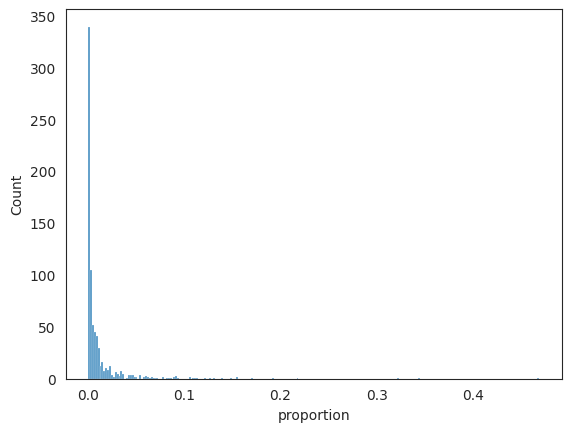

In [48]:
sns.histplot(df['proportion'])

<Axes: xlabel='log_proportion', ylabel='Count'>

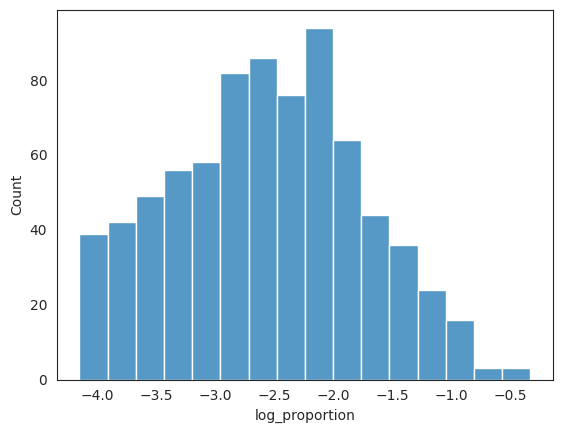

In [49]:
sns.histplot(df['log_proportion'])

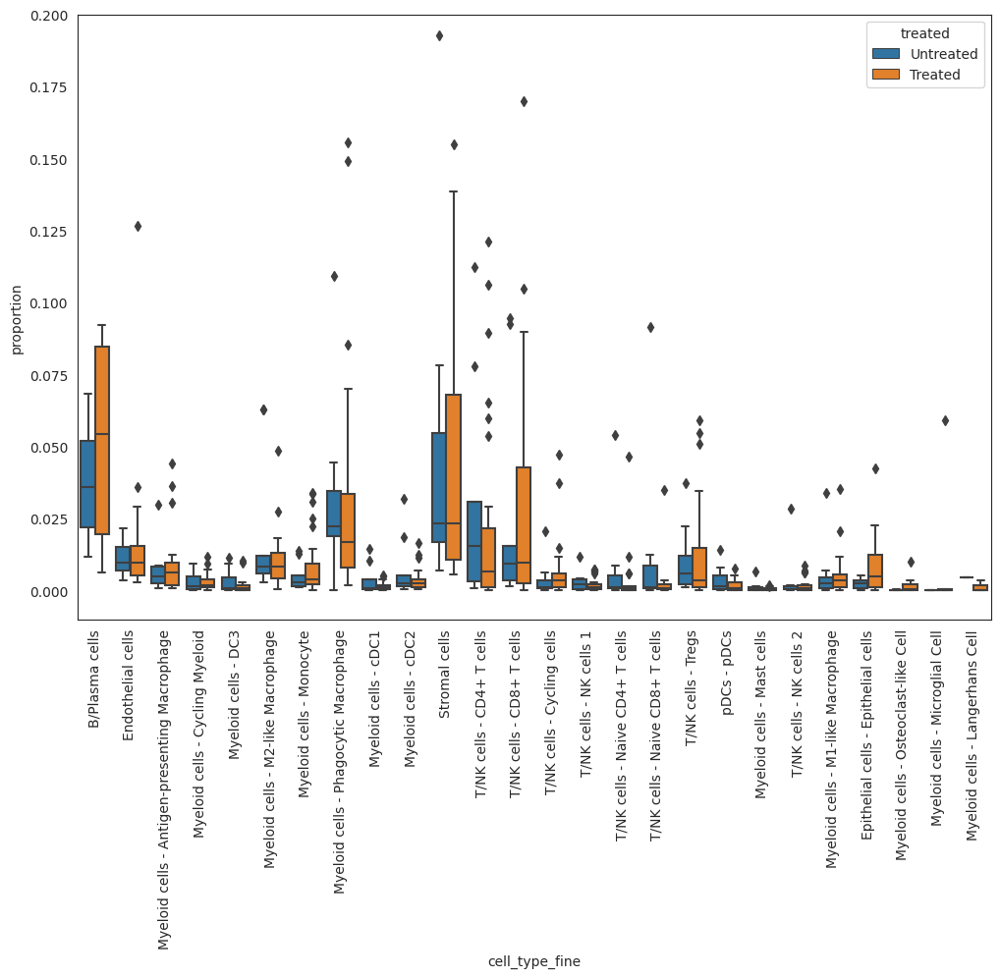

In [53]:
plt.figure(figsize=(12,8))
sns.boxplot(df, x='cell_type_fine', y='proportion', hue='treated')
plt.ylim([-.01,.2])
# sns.boxplot(df, x='cell_type_fine', y='log_proportion', hue='treated')
plt.xticks(rotation=90);

In [73]:
from scipy.stats import mannwhitneyu,ttest_ind
results = []
for cell_type in df['cell_type_fine'].unique():
    sub_df = df[df['cell_type_fine'] == cell_type]
    group_treated = sub_df[sub_df['treated'] == 'Treated']['proportion']
    group_untreated = sub_df[sub_df['treated'] == 'Untreated']['proportion']
    
    stat, pval = ttest_ind(group_treated, group_untreated, alternative='two-sided')    
    results.append({'cell_type_fine': cell_type,'statistic': stat,'p_value': pval})
    
results_df = pd.DataFrame(results)
results_df[results_df['p_value']<0.05]

,cell_type_fine,statistic,p_value


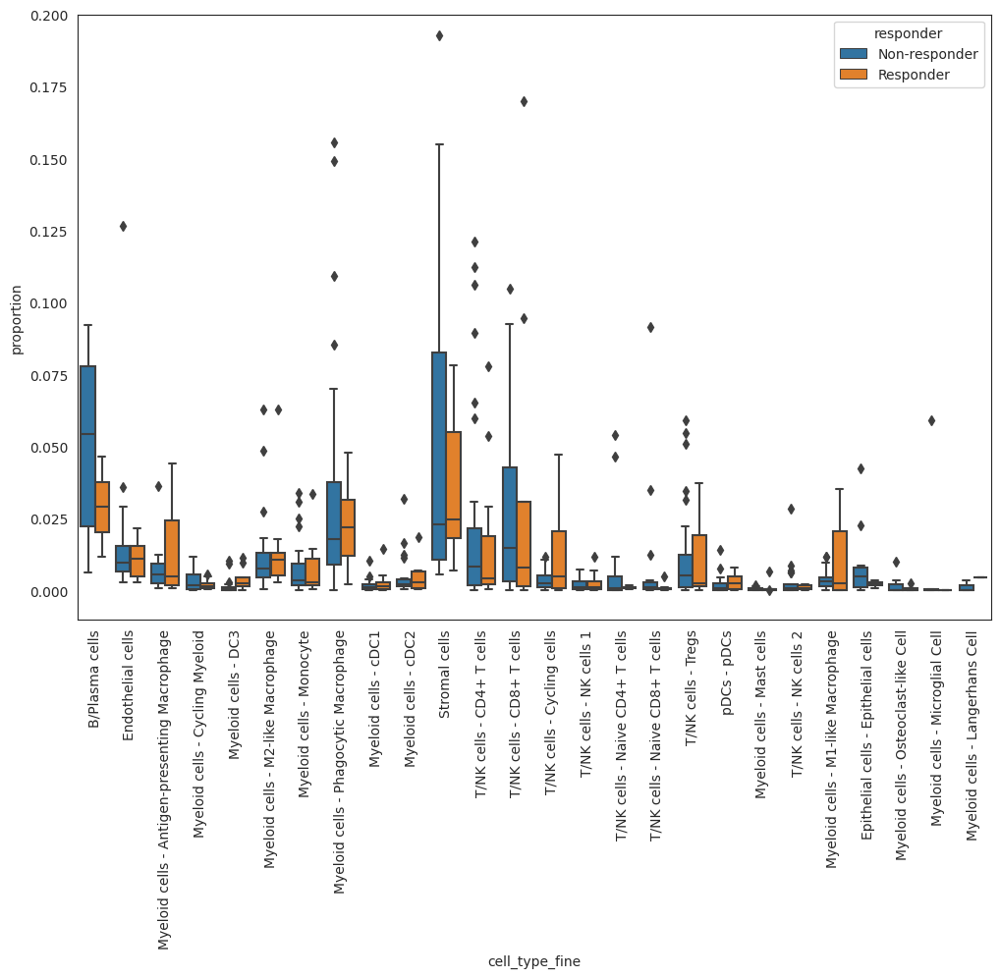

In [60]:
plt.figure(figsize=(12,8))
sns.boxplot(df, x='cell_type_fine', y='proportion', hue='responder')
plt.ylim([-.01,.2])
# sns.boxplot(df, x='cell_type_fine', y='log_proportion', hue='treated')
plt.xticks(rotation=90);

In [78]:
results = []
for cell_type in df['cell_type_fine'].unique():
    sub_df = df[df['cell_type_fine'] == cell_type]
    group_treated = sub_df[sub_df['responder'] == 'Responder']['proportion']
    group_untreated = sub_df[sub_df['responder'] == 'Non-responder']['proportion']
    
    stat, pval = ttest_ind(group_treated, group_untreated, alternative='two-sided')    
    results.append({'cell_type_fine': cell_type,'statistic': stat,'p_value': pval})
    
results_df = pd.DataFrame(results)
results_df[results_df['p_value']<0.05]

,cell_type_fine,statistic,p_value
4,Myeloid cells - DC3,2.096864,0.043750
13,T/NK cells - Cycling cells,3.012733,0.004943
21,Myeloid cells - M1-like Macrophage,2.427637,0.020817


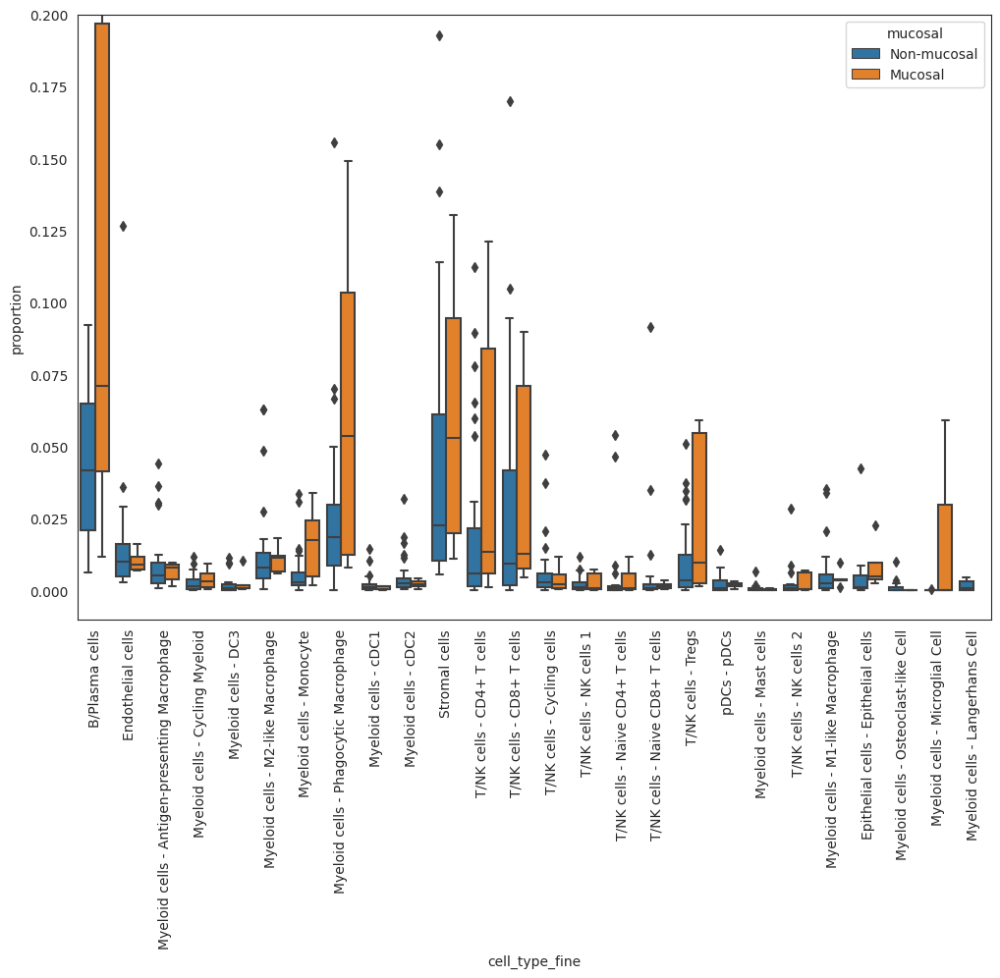

In [63]:
plt.figure(figsize=(12,8))
sns.boxplot(df, x='cell_type_fine', y='proportion', hue='mucosal')
plt.ylim([-.01,.2])
# sns.boxplot(df, x='cell_type_fine', y='log_proportion', hue='treated')
plt.xticks(rotation=90);

In [76]:
from scipy.stats import mannwhitneyu
results = []
for cell_type in df['cell_type_fine'].unique():
    sub_df = df[df['cell_type_fine'] == cell_type]
    group_treated = sub_df[sub_df['mucosal'] == 'Mucosal']['proportion']
    group_untreated = sub_df[sub_df['mucosal'] == 'Non-mucosal']['proportion']

    if (group_treated.shape[0]>0) and (group_untreated.shape[0]>0):
        stat, pval = ttest_ind(group_treated, group_untreated, alternative='two-sided')    
        results.append({'cell_type_fine': cell_type,'statistic': stat,'p_value': pval})
    
results_df = pd.DataFrame(results)
results_df[results_df['p_value']<0.05]

,cell_type_fine,statistic,p_value
6,Myeloid cells - Monocyte,2.661031,0.011564
7,Myeloid cells - Phagocytic Macrophage,2.441149,0.019688
17,T/NK cells - Tregs,2.038484,0.048696


# T/NK cell integrative plots

### modify and reorder labels

In [27]:
sc.settings.figdir = 'fig/4- Immune T Cells'
sc.set_figure_params(figsize = (12,8), dpi_save = 300, format = 'pdf', transparent = True)

In [28]:
tcells = tcells[~tcells.obs['cell_type_khh'].isin(['myeloid contam'])] # remove irrelevant cells

In [29]:
tcells.obs['Cell Type'] = tcells.obs['cell_type_khh'].replace({
    'naive Treg':'Treg',
    'Naive CD4+ T': 'CD4+ T(cm)',
    'Naive CD8+ T': 'CD8+ T(cm)',
    'cycling': 'Cycling Immune Cell'
})

tcells.obs['Cell Type'] = tcells.obs['Cell Type'].cat.reorder_categories([
    'CD4+ T(cm)','CD4+ T', 'Treg', 'CD8+ T(cm)', 'CD8+ T','NK_1','NK_2','Cycling Immune Cell',
])

## Figure 5A- UMAP colored by cell type and other clinical covariates

In [24]:
sc.pl.umap(tcells, color='Cell Type', palette = immune_cell_type_palette, s=20,
           save = '_immune_cell_type.pdf', show=False
          );

In [ ]:
sc.pl.umap(tcells, color='response', palette = clinical_variable_palette, s=20,
           save = '_immune_responder.pdf', show=False
          );

In [56]:
tcells.obs['Clonal Expansion'] = tcells.obs['clone_size'].replace({
    'NA':'TCR Not Available'
})
tcells.obs['Clonal Expansion'] = tcells.obs['Clonal Expansion'].cat.reorder_categories([
    'Expanded','Non-expanded','TCR Not Available'
])

In [58]:
sc.pl.umap(tcells, color='Clonal Expansion', palette = clinical_variable_palette, s=20,
           save = '_immune_clones.pdf', show=False
          );

In [28]:
tcells.obs['ICI Timing'] = tcells.obs['time'].replace({
    'pre' :'Pre ICI',
    'on'  :'On ICI',
    'post':'Post ICI',
})
tcells.obs['ICI Timing'] = tcells.obs['ICI Timing'].cat.reorder_categories(['Pre ICI','On ICI','Post ICI'])

In [29]:
sc.pl.umap(tcells, color='ICI Timing', palette = clinical_variable_palette, s=20,
           save = '_immune_time.pdf', show=False
          );

2025-02-27 19:48:18,168 | INFO : maxp pruned
2025-02-27 19:48:18,178 | INFO : cmap pruned
2025-02-27 19:48:18,181 | INFO : kern dropped
2025-02-27 19:48:18,181 | INFO : post pruned
2025-02-27 19:48:18,182 | INFO : FFTM dropped
2025-02-27 19:48:18,184 | INFO : GPOS pruned
2025-02-27 19:48:18,188 | INFO : GSUB pruned
2025-02-27 19:48:18,248 | INFO : glyf pruned
2025-02-27 19:48:18,249 | INFO : Added gid0 to subset
2025-02-27 19:48:18,250 | INFO : Added first four glyphs to subset
2025-02-27 19:48:18,250 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2025-02-27 19:48:18,251 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'I', 'M', 'O', 'P', 'T', 'U', 'e', 'g', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'space', 't', 'two']
2025-02-27 19:48:18,252 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 36, 38, 44, 48, 50, 51, 55, 56, 72, 74, 76, 80, 81, 82, 85, 86, 87]
2025-02-27 19:48:18,255 | INFO : Closed glyph list over 'GSUB': 23 glyphs after
2025-02-27 19:48:18,255 |

In [79]:
tcells.obs.loc[:,'CD8A/B'] = tcells[:,['CD8A','CD8B']].to_df()['CD8A'] + tcells[:,['CD8A','CD8B']].to_df()['CD8B']

In [81]:
sc.pl.umap(tcells, color='CD8A/B', cmap = 'plasma', vmin='p10',vmax='p90',s=20,
           save = '_immune_cd8.pdf', show=False
          );

In [83]:
sc.pl.umap(tcells, color='CD4', cmap = 'plasma', vmin='p10',vmax='p90',s=20,
           save = '_immune_cd4.pdf', show=False
          );

In [102]:
sc.pl.umap(tcells, color='NCAM1', cmap = 'plasma', vmin=0,vmax='p99',s=20,
           save = '_immune_ncam1.pdf', show=False
          );

In [114]:
# naive_markers_z_score # T_naive_z_score
sc.pl.umap(tcells, color='T_naive_z_score', cmap = 'coolwarm', vmin=-2,vmax=2,s=20,
           save = '_immune_naivety.pdf', show=False
          );

In [39]:
g2m = [
    "AURKA", "BIRC5", "BUB1", "BUB1B", "CCNA2", "CCNB1", "CCNB2", 
    "CCNF", "CDC20", "CDC25B", "CDC25C", "CDK1", "CDKN2D", "CENPA", 
    "CENPF", "CKS2", "KIF20A", "PLK1", "RACGAP1", "TOP2A"
]
# sc.pl.dotplot(tcells, var_names = g2m, groupby='Cell Type', use_raw=True)

In [57]:
g1s = set([
    "BRCA1", "BRCA2", "CCNE1", "CCNE2", "CCNG2", "CDC25A", "CDC45", 
    "CDC6", "CDKN1A", "CDKN2C", "CDKN3", "DHFR", "E2F1", "E2F5", 
    "H1F0", "H1FNT", "H1FOO", "H1FX", "H2AFB1", "H2AFB2", "H2AFB3", 
    "H2AFJ", "H2AFV", "H2AFVP1", "H2AFX", "H2AFY", "H2AFY2", "H2AFZ", 
    "H2AFZP1", "H2AFZP2", "H2AFZP3", "H2AFZP4", "H2AFZP5", "H2AFZP6", 
    "H2BFM", "H2BFS", "H2BFWT", "H2BFXP", "H3F3A", "H3F3AP1", "H3F3AP2", 
    "H3F3B", "H3F3C", "HIST1H1A", "HIST1H1B", "HIST1H1C", "HIST1H1D", 
    "HIST1H1E", "HIST1H1PS1", "HIST1H1PS2", "HIST1H1T", "HIST1H2AA", 
    "HIST1H2AB", "HIST1H2AC", "HIST1H2AD", "HIST1H2AE", "HIST1H2AG", 
    "HIST1H2AH", "HIST1H2AI", "HIST1H2AJ", "HIST1H2AK", "HIST1H2AL", 
    "HIST1H2AM", "HIST1H2APS1", "HIST1H2APS2", "HIST1H2APS3", 
    "HIST1H2APS4", "HIST1H2APS5", "HIST1H2BA", "HIST1H2BB", "HIST1H2BC", 
    "HIST1H2BD", "HIST1H2BE", "HIST1H2BF", "HIST1H2BG", "HIST1H2BH", 
    "HIST1H2BI", "HIST1H2BJ", "HIST1H2BK", "HIST1H2BL", "HIST1H2BM", 
    "HIST1H2BN", "HIST1H2BO", "HIST1H2BPS1", "HIST1H2BPS2", "HIST1H3A", 
    "HIST1H3B", "HIST1H3C", "HIST1H3D", "HIST1H3E", "HIST1H3F", 
    "HIST1H3G", "HIST1H3H", "HIST1H3I", "HIST1H3J", "HIST1H3PS1", 
    "HIST1H4A", "HIST1H4B", "HIST1H4C", "HIST1H4D", "HIST1H4E", 
    "HIST1H4F", "HIST1H4G", "HIST1H4H", "HIST1H4I", "HIST1H4J", 
    "HIST1H4K", "HIST1H4L", "HIST1H4PS1", "HIST2H2AA3", "HIST2H2AA4", 
    "HIST2H2AB", "HIST2H2AC", "HIST2H2BA", "HIST2H2BB", "HIST2H2BC", 
    "HIST2H2BD", "HIST2H2BE", "HIST2H2BF", "HIST2H3A", "HIST2H3C", 
    "HIST2H3D", "HIST2H3PS2", "HIST2H4A", "HIST2H4B", "HIST3H2A", 
    "HIST3H2BA", "HIST3H2BB", "HIST3H3", "HIST4H4", "MCM2", "MCM6", 
    "MSH2", "NASP", "NPAT", "PCNA", "RRM1", "RRM2", "SLBP", "TYMS"
]) & set(tcells.raw.var_names)

# sc.pl.dotplot(tcells, var_names = ['HIST1H1B','BRCA1','BRCA2','H2AFZ','RRM2'], groupby='Cell Type', use_raw=True)

## Figure S6A- Dotplot for T cell lineage and marker genes for subtype annotation

In [60]:
markers = {
    'Lineage Markers': ['CD3E', 'CD4','CD8B'],
    'Stem-ness Markers': ['SELL','IL7R','CCR7','CD27','CD28','PTPRC'], # 'TCF7'?
    'Memory Markers': ['FAS','HNRNPLL','CCL5','ITGAL','CD69','ITGAE','CXCR4'],
    'Exhaustion Markers': ['PDCD1','CTLA4','KLRG1','LAG3','TIGIT','HAVCR2'],
    'Activation Markers': ['ENTPD1','IL2RA','ICOS','TNFRSF4','TNFRSF8','CD40LG'],
    'Effector Cytokines': ['GZMA','GZMB','GZMH','GZMK','PRF1','GNLY','IFNG','TNF'],
    'Transcription Factors': ['FOXP3','LEF1','TCF7','EOMES','TBX21','TOX','ID2','ID3','ZNF683','MKI67'],
    'NK Genes': ['NCAM1','TRGV9','KLRB1','KLRC3','B3GAT1'],
    'Cell Cycle': ['HIST1H1B','BRCA1','BRCA2','H2AFZ','RRM2'] + ['BUB1','BUB1B','CDK1','CENPF','TOP2A'],
}

# sns.set_style('ticks')
plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['text.color'] = 'black'
plt.rcParams['axes.labelcolor'] = 'black'
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'

sc.pl.matrixplot(tcells, var_names = markers, groupby='Cell Type', use_raw=True, 
                    standard_scale='var', colorbar_title='Relative\nmean expression\nin group',
                    save = 'markers_matrix.pdf', show=False,
                    cmap='RdBu_r', # Red-Blue diverging colormap
                    var_group_rotation=45,
                    # var_group_positions='left', # Add brackets around gene groups
                    # var_group_labels=True # Add labels to gene group
                )

2025-06-03 20:44:04,253 | INFO : maxp pruned
2025-06-03 20:44:04,261 | INFO : cmap pruned
2025-06-03 20:44:04,262 | INFO : kern dropped
2025-06-03 20:44:04,262 | INFO : post pruned
2025-06-03 20:44:04,263 | INFO : FFTM dropped
2025-06-03 20:44:04,264 | INFO : GPOS pruned
2025-06-03 20:44:04,268 | INFO : GSUB pruned
2025-06-03 20:44:04,273 | INFO : glyf pruned
2025-06-03 20:44:04,274 | INFO : Added gid0 to subset
2025-06-03 20:44:04,275 | INFO : Added first four glyphs to subset
2025-06-03 20:44:04,275 | INFO : Closing glyph list over 'GSUB': 63 glyphs before
2025-06-03 20:44:04,275 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'Z', 'a', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore'

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'color_legend_ax': <Axes: title={'center': 'Relative\nmean expression\nin group'}>}

## CD8+ and CD4+ Diffusion Components

Superseded by Decipher analysis

In [18]:
cd8_dcs.obs['Cell Type'] = cd8_dcs.obs['cell_type_khh'].replace({
    'Naive CD8+ T': 'CD8+ T(cm)',
})

cd8_dcs.obs['Cell Type'] = cd8_dcs.obs['Cell Type'].cat.reorder_categories([
    'CD8+ T(cm)', 'CD8+ T',
])

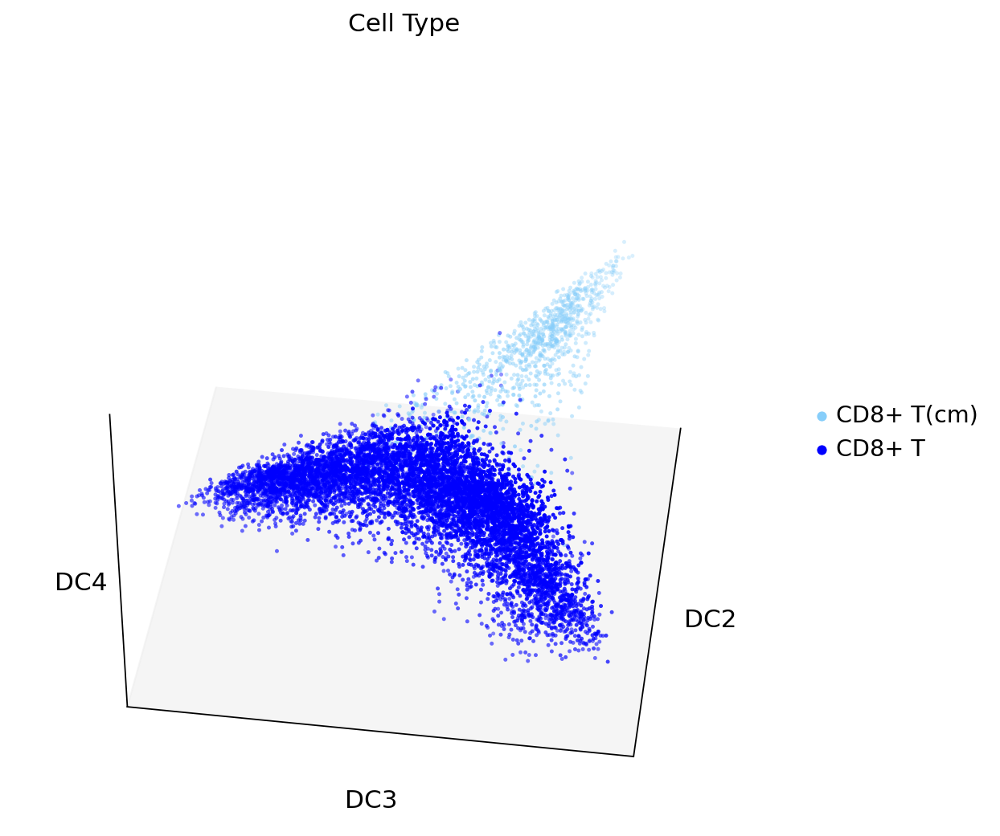

In [ ]:
# example DC map
elev=40; azim=8
axs=sc.pl.diffmap(cd8_dcs, color = 'Cell Type', palette = immune_cell_type_palette,
                  dimensions = [1,2,3], projection='3d', show=False, 
                  # frameon=False,
                 )
axs.view_init(elev=elev, azim=azim, roll=0)

# to manually remove axis
axs.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# axs.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# axs.zaxis.pane.fill=False
# axs.grid(True)
# axs.zaxis._axinfo['grid'].update({'color': (0, 0, 0, 1)})

# import matplotlib as mpl
# with mpl.rc_context({'lines.linewidth':2, 'lines.linestyle':':'}):
#     axs.plot()
# mpl.rcParams.update({"axes.grid" : True, 'lines.linewidth':2, 'lines.linestyle':':'})

# plt.savefig('fig/4- Immune T Cells/', transparent=True, dpi=300, format='pdf')

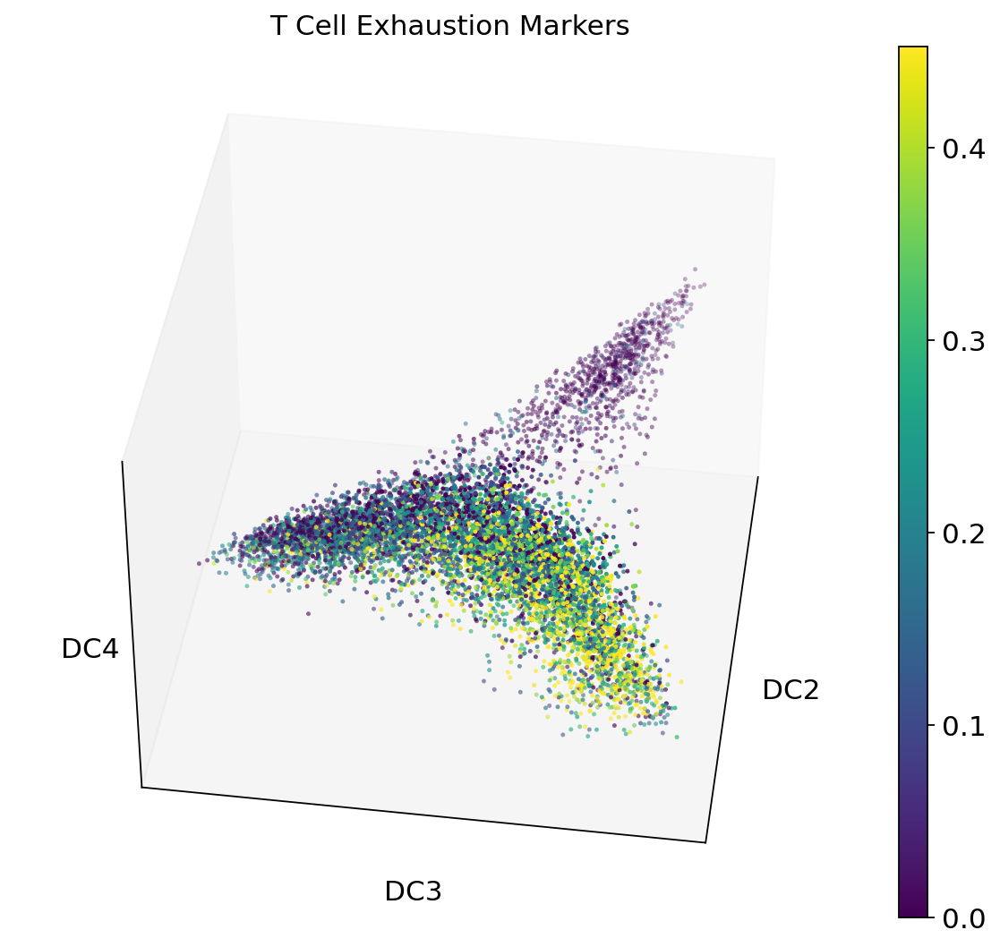

In [31]:
axs=sc.pl.diffmap(cd8_dcs, color = 'exhaustion_markers_mean_expression', title='T Cell Exhaustion Markers',
                  dimensions = [1,2,3], projection='3d', show=False, vmax='p90'
                  # frameon=False,
                 )
axs.view_init(elev=elev, azim=azim, roll=0)
plt.savefig('fig/4- Immune T Cells/dc_cd8_exhaustion.pdf', transparent=True, dpi=300, format='pdf', bbox_inches='tight')

In [35]:
cd4_dcs.obs['Cell Type'] = cd4_dcs.obs['cell_type_khh'].replace({
    'Naive CD4+ T': 'CD4+ T(cm)',
    'naive Treg': 'Treg'
})

cd4_dcs.obs['Cell Type'] = cd4_dcs.obs['Cell Type'].cat.reorder_categories([
    'CD4+ T(cm)', 'CD4+ T', 'Treg',
])

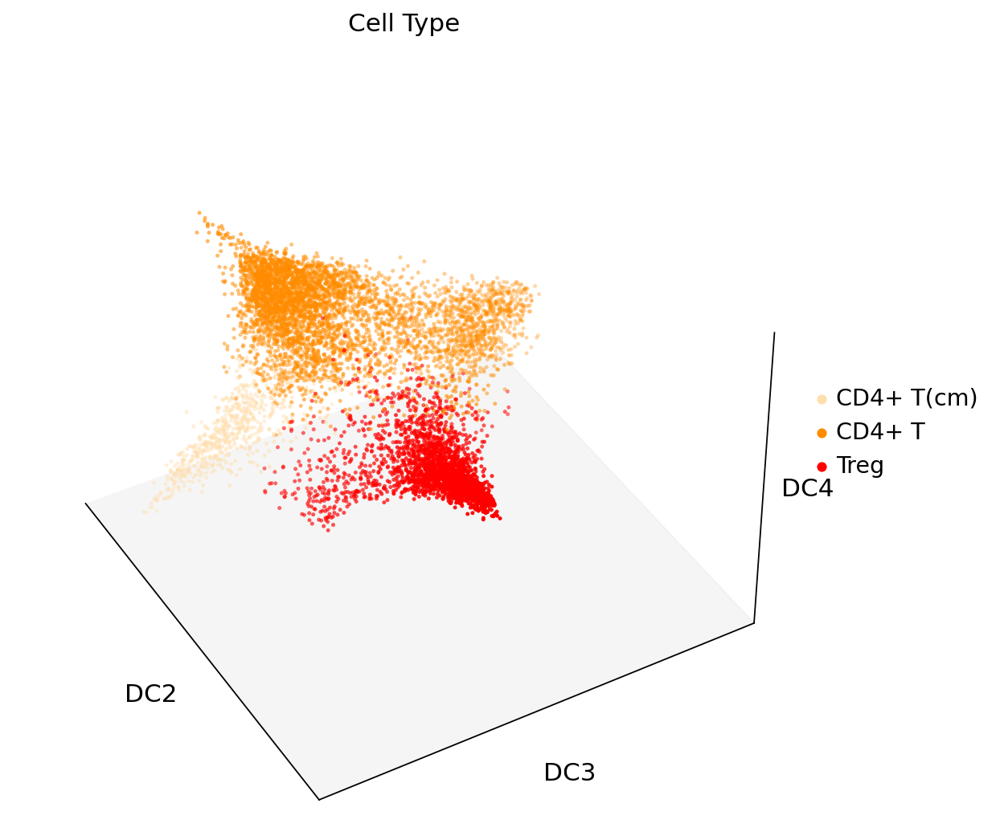

In [38]:
# example DC map
elev=40; azim=-30; roll=0
axs=sc.pl.diffmap(cd4_dcs, color = 'Cell Type', palette = immune_cell_type_palette,
                  dimensions = [1,2,3], projection='3d', show=False, 
                  # frameon=False,
                 )
axs.view_init(elev=elev, azim=azim, roll=0)

axs.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

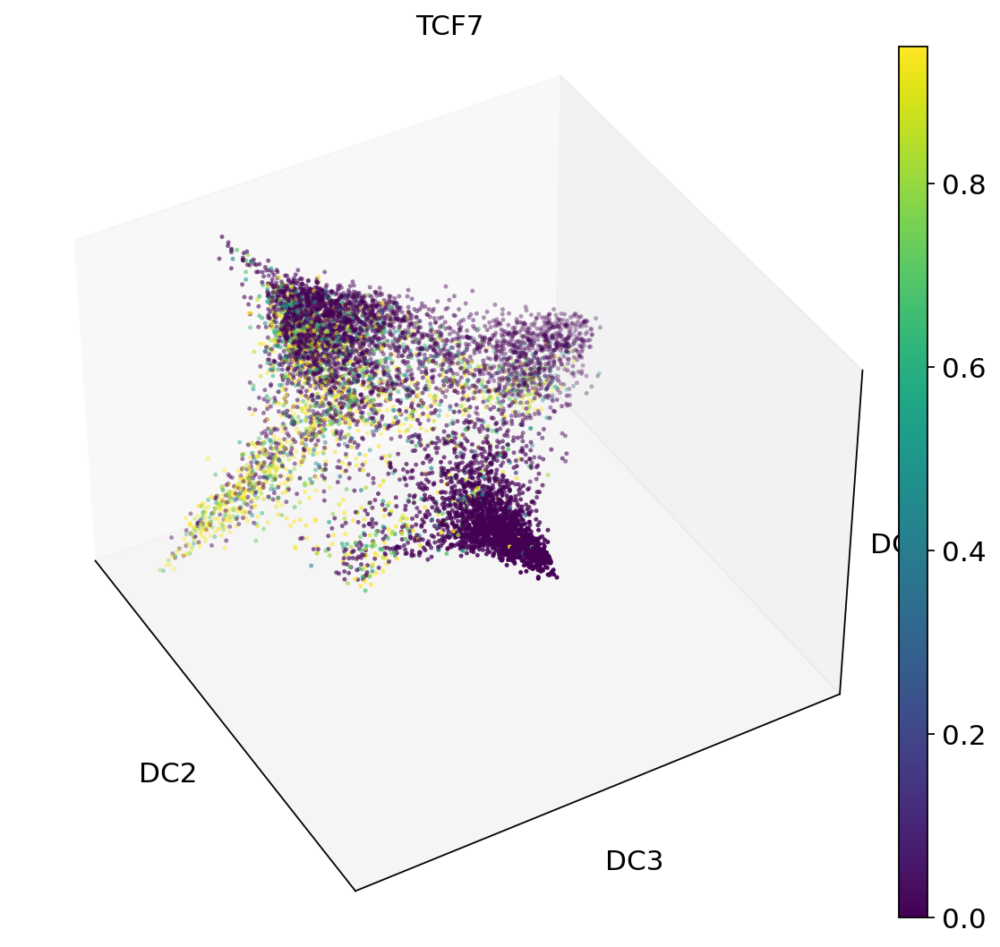

In [40]:
axs=sc.pl.diffmap(cd4_dcs, color = 'TCF7', layer='log_counts',
                  dimensions = [1,2,3], projection='3d', show=False, vmax='p90'
                  # frameon=False,
                 )
axs.view_init(elev=elev, azim=azim, roll=0)
plt.savefig('fig/4- Immune T Cells/dc_cd4_tcf7.pdf', transparent=True, dpi=300, format='pdf', bbox_inches='tight')

# T cell Decipher plots

## Figures 5C- Decipher plot colored by cell type, patient, decipher_time

In [25]:
tcells_decipher.obs['Cell Type'] = tcells_decipher.obs['cell_type_khh'].replace({
    'Naive CD4+ T': 'CD4+ T(cm)',
    'Naive CD8+ T': 'CD8+ T(cm)',
})

tcells_decipher.obs['Cell Type'] = tcells_decipher.obs['Cell Type'].cat.reorder_categories([
    'CD4+ T(cm)','CD4+ T', 'Treg', 'CD8+ T(cm)', 'CD8+ T',
])

In [27]:
fig = dc.pl.decipher(tcells_decipher, color='Cell Type', figsize=(12,8), s=40, palette = {
    'CD4+ T(cm)': 'navajowhite',
    'CD4+ T': 'tab:orange',
    'Treg': 'red',
    'CD8+ T(cm)': 'lightskyblue',
    'CD8+ T': 'dodgerblue',
}, title = 'Cell Type')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_labels.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-03-20 16:35:25,180 | INFO : maxp pruned
2025-03-20 16:35:25,188 | INFO : cmap pruned
2025-03-20 16:35:25,189 | INFO : kern dropped
2025-03-20 16:35:25,189 | INFO : post pruned
2025-03-20 16:35:25,189 | INFO : FFTM dropped
2025-03-20 16:35:25,191 | INFO : GPOS pruned
2025-03-20 16:35:25,194 | INFO : GSUB pruned
2025-03-20 16:35:25,199 | INFO : glyf pruned
2025-03-20 16:35:25,200 | INFO : Added gid0 to subset
2025-03-20 16:35:25,200 | INFO : Added first four glyphs to subset
2025-03-20 16:35:25,201 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-03-20 16:35:25,201 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'R', 'c', 'e', 'eight', 'five', 'four', 'h', 'i', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'zero']
2025-03-20 16:35:25,202 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 39, 41, 53, 66, 70, 72, 75, 76, 81, 82, 83, 85, 86, 87]
2025-03-20 16:35:25,204 |

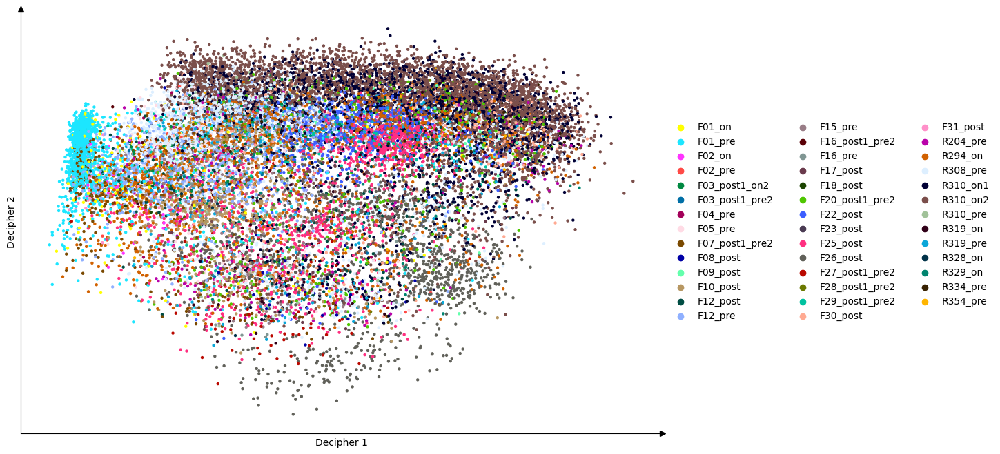

In [ ]:
fig = dc.pl.decipher(tcells_decipher, color='sample', figsize=(12,8), s=40)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_samples.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [20]:
tcells_decipher.obs['decipher_time'] = (tcells_decipher.obs['decipher_time'] - np.min(tcells_decipher.obs['decipher_time'])) / np.max(tcells_decipher.obs['decipher_time'])
fig = dc.pl.decipher(tcells_decipher, color='decipher_time', figsize=(4.5,3), vmin=0, vmax=1, title='Decipher Pseudotime')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_pseudotime.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [30]:
tcells_decipher.obs['ICI Timing'] = tcells_decipher.obs['time'].replace({
    'pre' :'Pre ICI',
    'on'  :'On ICI',
    'post':'Post ICI',
})
tcells_decipher.obs['ICI Timing'] = tcells_decipher.obs['ICI Timing'].cat.reorder_categories(['Pre ICI','On ICI','Post ICI'])

In [ ]:
fig = dc.pl.decipher(tcells_decipher, color='ICI Timing', palette = clinical_variable_palette, figsize=(12,8), s=40, title = 'ICI Treatment Timing')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_time.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figures 5F, S6G- Projection of cells on Decipher1 colored by clinical covariates (S6G- just CD8+ T cells over Decipher 1)

In [31]:
def plot_distributions(adata, axis, hue, title=None, palette=None):
    df = adata.obs.copy()
    if axis in adata.obsm.keys():
        df[axis] = adata.obsm[axis][:,0]
    fig,ax = plt.subplots(1,1,figsize=(12,3))
    sns.kdeplot(df, x=axis, hue=hue, multiple='fill', ax=ax, legend=False, palette=palette)
    # sns.histplot(df, x=axis, hue=hue, multiple='fill', ax=ax, legend=False, palette=palette)
    ax.grid(False)
    plt.tick_params(left=False, bottom=False)
    ax.set(xticklabels=[], yticklabels=[], xlabel=title, ylabel=None)
    plt.tight_layout()
    return fig

2025-02-27 19:51:14,128 | INFO : maxp pruned
2025-02-27 19:51:14,136 | INFO : cmap pruned
2025-02-27 19:51:14,137 | INFO : kern dropped
2025-02-27 19:51:14,137 | INFO : post pruned
2025-02-27 19:51:14,137 | INFO : FFTM dropped
2025-02-27 19:51:14,139 | INFO : GPOS pruned
2025-02-27 19:51:14,143 | INFO : GSUB pruned
2025-02-27 19:51:14,147 | INFO : glyf pruned
2025-02-27 19:51:14,148 | INFO : Added gid0 to subset
2025-02-27 19:51:14,148 | INFO : Added first four glyphs to subset
2025-02-27 19:51:14,149 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2025-02-27 19:51:14,149 | INFO : Glyph names: ['.notdef', '.null', 'D', 'V', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space']
2025-02-27 19:51:14,150 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 39, 57, 70, 72, 75, 76, 83, 85]
2025-02-27 19:51:14,153 | INFO : Closed glyph list over 'GSUB': 13 glyphs after
2025-02-27 19:51:14,153 | INFO : Glyph names: ['.notdef', '.null', 'D', 'V', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 

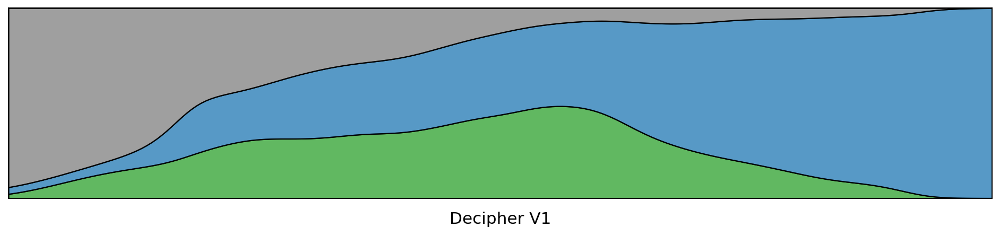

In [32]:
fig = plot_distributions(tcells_decipher, 'decipher_v', hue='ICI Timing', title='Decipher V1', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_time_v.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = plot_distributions(tcells_decipher, 'decipher_time', hue='ICI Timing', title='Decipher Pseudotime', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_time_dpt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [99]:
print(np.quantile(df[df['days_to/from_ICI_start']>0]['days_to/from_ICI_start'],.25))
print(np.quantile(df[df['days_to/from_ICI_start']>0]['days_to/from_ICI_start'],.50))
print(np.quantile(df[df['days_to/from_ICI_start']>0]['days_to/from_ICI_start'],.75))

32.0
103.0
187.0


In [30]:
# days_to/from_ICI_start buckets: [<0] [0,32] [33,103] [104,187] [188+]
tcells_decipher.obs['bucketed_days_to/from_ICI_start'] = '<0'
tcells_decipher.obs.loc[(tcells_decipher.obs['days_to/from_ICI_start']>=0),'bucketed_days_to/from_ICI_start'] = '0-32'
tcells_decipher.obs.loc[(tcells_decipher.obs['days_to/from_ICI_start']>=33), 'bucketed_days_to/from_ICI_start'] = '33-103'
tcells_decipher.obs.loc[(tcells_decipher.obs['days_to/from_ICI_start']>=104), 'bucketed_days_to/from_ICI_start'] = '104-187'
tcells_decipher.obs.loc[tcells_decipher.obs['days_to/from_ICI_start']>=188, 'bucketed_days_to/from_ICI_start'] = '188+'
tcells_decipher.obs['bucketed_days_to/from_ICI_start'] = tcells_decipher.obs['bucketed_days_to/from_ICI_start'].astype("category")
tcells_decipher.obs['bucketed_days_to/from_ICI_start'] = tcells_decipher.obs['bucketed_days_to/from_ICI_start'].cat.reorder_categories(['<0','0-32','33-103','104-187','188+'])

In [ ]:
fig = dc.pl.decipher(tcells_decipher, color='bucketed_days_to/from_ICI_start', palette = 'plasma', figsize=(12,8), s=40, title = 'Days To/From ICI Start')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_ICI_time.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

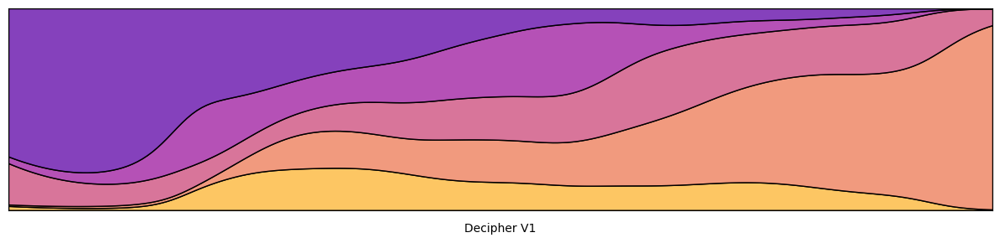

In [102]:
fig = plot_distributions(tcells_decipher, 'decipher_v', hue='bucketed_days_to/from_ICI_start', title= 'Decipher V1', palette = 'plasma')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_ICI_time_v.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

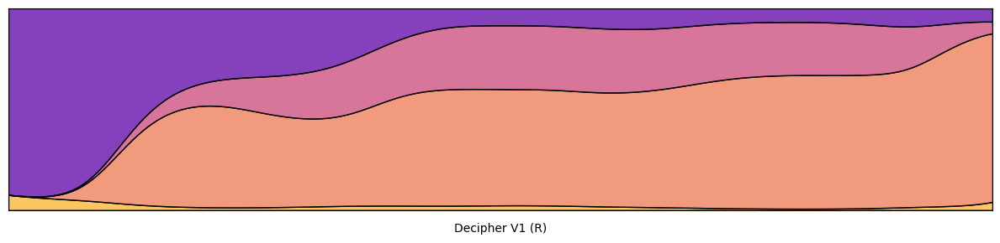

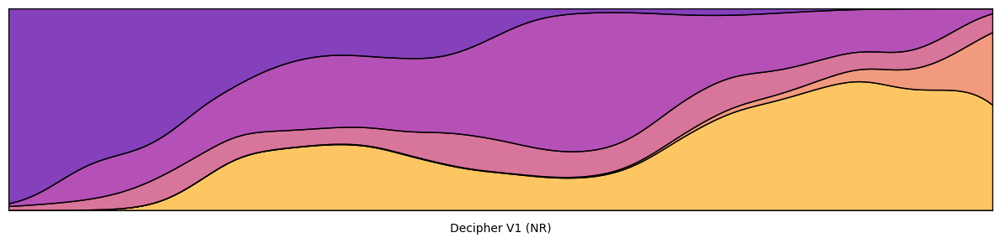

In [ ]:
# Figure S6G- projection of CD8+ T cells over Decipher 1 colored by clinical covariates
tcells_decipher_cd8 = tcells_decipher[tcells_decipher.obs['cell_type_khh'].isin(['CD8+ T(cm)', 'CD8+ T'])].copy()
tcells_decipher_R = tcells_decipher_cd8[tcells_decipher_cd8.obs['response']=='Responder'].copy()
tcells_decipher_NR = tcells_decipher_cd8[tcells_decipher_cd8.obs['response']=='Non-responder'].copy()
fig = plot_distributions(tcells_decipher_R, 'decipher_v', hue='bucketed_days_to/from_ICI_start', title= 'Decipher V1 (R)', palette = 'plasma')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_ICI_time_v_R.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')
fig = plot_distributions(tcells_decipher_NR, 'decipher_v', hue='bucketed_days_to/from_ICI_start', title= 'Decipher V1 (NR)', palette = 'plasma')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_ICI_time_v_NR.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = plot_distributions(tcells_decipher, 'decipher_time', hue='bucketed_days_to/from_ICI_start', title= 'Decipher Pseudotime', palette = 'plasma')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_ICI_time_dpt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [50]:
tcells_decipher.obs['Clonal Expansion'] = tcells_decipher.obs['clone_size'].replace({
    'NA':'TCR Not Available'
})
tcells_decipher.obs['Clonal Expansion'] = tcells_decipher.obs['Clonal Expansion'].cat.reorder_categories([
    'Expanded','Non-expanded','TCR Not Available'
])

In [ ]:
fig = dc.pl.decipher(tcells_decipher, color='Clonal Expansion', palette = clinical_variable_palette, figsize=(12,8), s=40, title = 'Clonal Expansion')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_clones.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

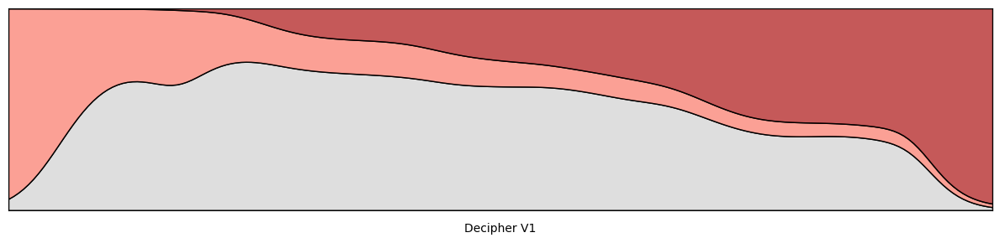

In [51]:
fig = plot_distributions(tcells_decipher, 'decipher_v', hue='Clonal Expansion', title= 'Decipher V1', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_clones_v.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = plot_distributions(tcells_decipher, 'decipher_time', hue='Clonal Expansion', title= 'Decipher Pseudotime', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_clones_dpt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.decipher(tcells_decipher, color='response', palette = clinical_variable_palette, figsize=(12,8), s=40, title = 'Response')
fig.savefig('fig/4- Immune T Cells/decipher_tcell_response.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

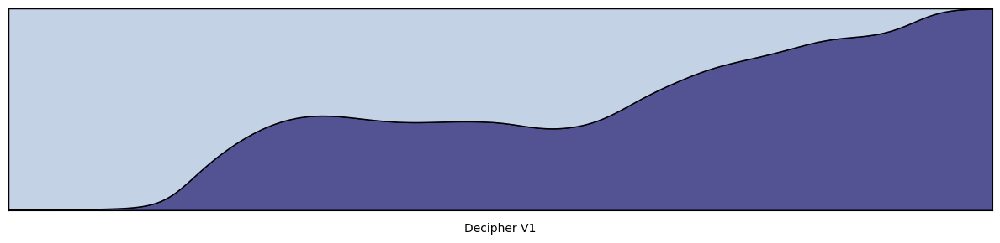

In [52]:
fig = plot_distributions(tcells_decipher, 'decipher_v', hue='response', title= 'Decipher V1', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_response_v.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = plot_distributions(tcells_decipher, 'decipher_time', hue='response', title= 'Decipher Pseudotime', palette = clinical_variable_palette)
fig.savefig('fig/4- Immune T Cells/decipher_tcell_response_dpt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

### significance tests

In [35]:
df = tcells_decipher.obs.copy()
df['decipher_v'] = tcells_decipher.obsm['decipher_v'][:,0]

In [51]:
# wasserstein test for p-val for R/NR and TCR plots
from scipy.stats import wasserstein_distance

def permutation_test_wasserstein(data1, data2, n_permutations=1000, random_seed=0):
    """
    Perform a permutation test using the Wasserstein distance.

    Parameters:
        data1 (array-like): First dataset.
        data2 (array-like): Second dataset.
        n_permutations (int): Number of permutations.
        random_seed (int or None): Random seed for reproducibility.

    Returns:
        dict: Wasserstein distance, p-value, and distribution of permuted distances.
    """
    if random_seed is not None:
        np.random.seed(random_seed)
    
    original_distance = wasserstein_distance(data1, data2)
    
    combined = np.concatenate([data1, data2])
    n1 = len(data1)
    
    permuted_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        permuted_data1 = combined[:n1]
        permuted_data2 = combined[n1:]
        distance = wasserstein_distance(permuted_data1, permuted_data2)
        permuted_distances.append(distance)
    
    p_value = np.mean(np.array(permuted_distances) >= original_distance)
    
    return {
        'original_distance': original_distance,
        'p_value': p_value,
        'permuted_distances': permuted_distances
    }

In [63]:
result = permutation_test_wasserstein(
    df.loc[df['response']=='Responder','decipher_v'], 
    df.loc[df['response']=='Non-responder','decipher_v'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for R vs. NR:', result['p_value'])

wasserstein permutation test results for R vs. NR: 0.0


In [64]:
result = permutation_test_wasserstein(
    df.loc[df['clone_size']=='Expanded','decipher_v'], 
    df.loc[df['clone_size']=='Non-expanded','decipher_v'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for Expanded vs. vs. Non-expanded (no NA):', result['p_value'])

wasserstein permutation test results for Expanded vs. vs. Non-expanded (no NA): 0.0


In [33]:
# ANOVA for p-val for time and days to/from ICB start
from scipy.stats import f_oneway

In [36]:
result = f_oneway(
    df.loc[df['time']=='pre','decipher_v'], 
    df.loc[df['time']=='on','decipher_v'], 
    df.loc[df['time']=='post','decipher_v']
)
print('ANOVA test results for Pre vs. On vs. Post:', result.pvalue)

ANOVA test results for Pre vs. On vs. Post: 0.0


In [105]:
result = f_oneway(
    df.loc[df['bucketed_days_to/from_ICI_start']=='<0','decipher_v'], 
    df.loc[df['bucketed_days_to/from_ICI_start']=='0-32','decipher_v'], 
    df.loc[df['bucketed_days_to/from_ICI_start']=='33-103','decipher_v'], 
    df.loc[df['bucketed_days_to/from_ICI_start']=='104-187','decipher_v'], 
    df.loc[df['bucketed_days_to/from_ICI_start']=='188+','decipher_v']
)
print('ANOVA test results for bucketed days to/from ICB start:', result.pvalue)

ANOVA test results for bucketed days to/from ICB start: 0.0


## Figure S6D- lineage/differentiation marker gene expression patterns over decipher_time for CD8 and CD4 trajectories

2025-06-03 19:42:35,821 | INFO : maxp pruned
2025-06-03 19:42:35,830 | INFO : cmap pruned
2025-06-03 19:42:35,830 | INFO : kern dropped
2025-06-03 19:42:35,831 | INFO : post pruned
2025-06-03 19:42:35,831 | INFO : FFTM dropped
2025-06-03 19:42:35,833 | INFO : GPOS pruned
2025-06-03 19:42:35,838 | INFO : GSUB pruned
2025-06-03 19:42:35,843 | INFO : glyf pruned
2025-06-03 19:42:35,844 | INFO : Added gid0 to subset
2025-06-03 19:42:35,844 | INFO : Added first four glyphs to subset
2025-06-03 19:42:35,844 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-06-03 19:42:35,845 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'S', 'T', 'eight', 'five', 'four', 'nonmarkingreturn', 'one', 'plus', 'seven', 'six', 'space', 'three', 'two', 'zero']
2025-06-03 19:42:35,846 | INFO : Glyph IDs:   [0, 1, 2, 3, 14, 19, 20, 21, 22, 23, 24, 25, 26, 27, 36, 37, 38, 39, 40, 42, 44, 47, 54, 55]
2025-06-03 19:42:35,848 | INFO : Closed glyph list over 'GSUB': 24 gly

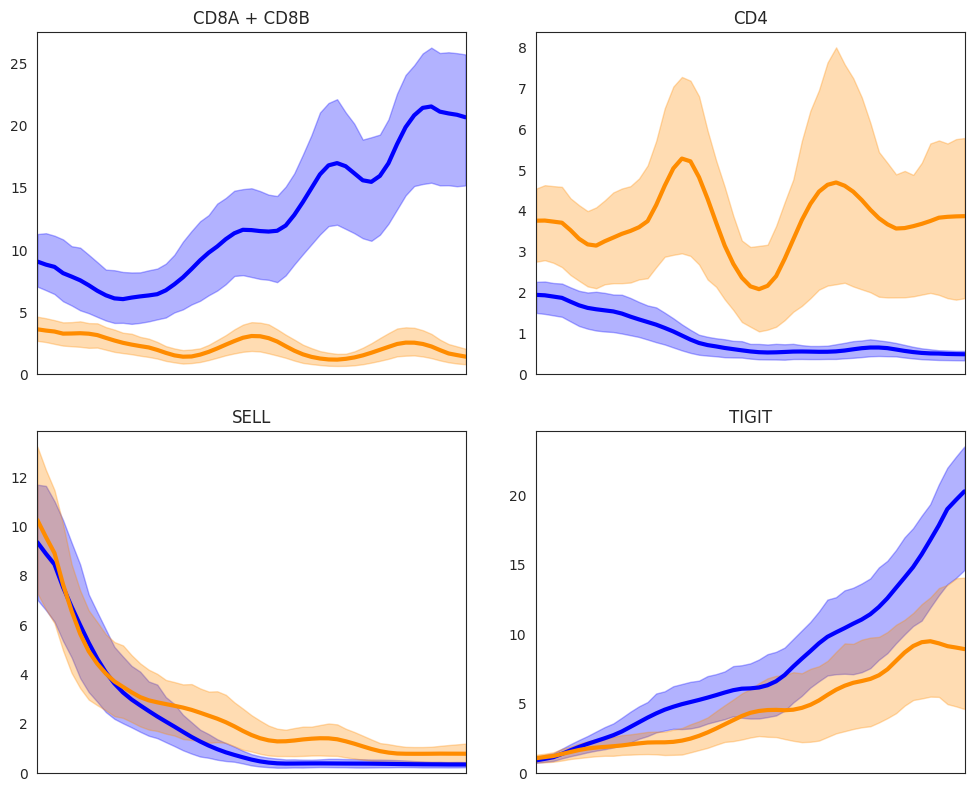

In [71]:
# Create 2x2 subplot figure
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
fig.tight_layout(h_pad=2, w_pad=2)

# Plot each gene pattern in its subplot
genes = [
    (['CD8A','CD8B'], 'CD8A + CD8B', axes[0,0]),
    (['CD4'], 'CD4', axes[0,1]), 
    (['SELL'], 'SELL', axes[1,0]),
    (['TIGIT'], 'TIGIT', axes[1,1])
]

# Plot all subplots
for gene_list, title, ax in genes:
    dc.pl.gene_patterns(tcells_decipher, gene_list, pattern_names=['CD8','CD4'],
                       palette=immune_cell_type_palette, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.get_legend().remove()

# Save figure
fig.savefig('fig/4- Immune T Cells/decipher_tcell_combined.pdf', 
            format='pdf', dpi=300, transparent=True, bbox_inches='tight')


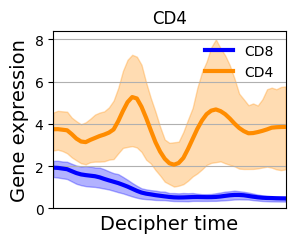

In [44]:
# fig = dc.pl.gene_patterns(tcells_decipher, ['CD4'], pattern_names=['CD8','CD4'],
#                           palette = immune_cell_type_palette);
# plt.grid(None);
# plt.title('CD4');
# fig.savefig('fig/4- Immune T Cells/decipher_tcell_cd4.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

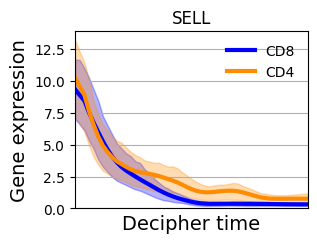

In [45]:
# fig = dc.pl.gene_patterns(tcells_decipher, ['SELL'], pattern_names=['CD8','CD4'],
#                           palette = immune_cell_type_palette);
# plt.grid(None);
# plt.title('SELL');
# fig.savefig('fig/4- Immune T Cells/decipher_tcell_sell.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

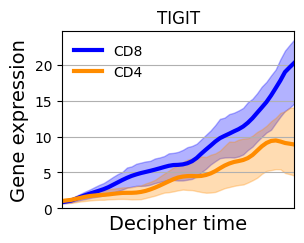

In [46]:
# fig = dc.pl.gene_patterns(tcells_decipher, ['TIGIT'], pattern_names=['CD8','CD4'],
#                           palette = immune_cell_type_palette);
# plt.grid(None);
# plt.title('TIGIT');
# fig.savefig('fig/4- Immune T Cells/decipher_tcell_tigit.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S8D- gene expression patterns over decipher_time to pseudotime groups for ContactTracing experiment

In [24]:
sc.settings.figdir = 'fig/6- Cell Interactions'
sc.set_figure_params(figsize = (12,8), dpi_save = 300, format = 'pdf', transparent = True)

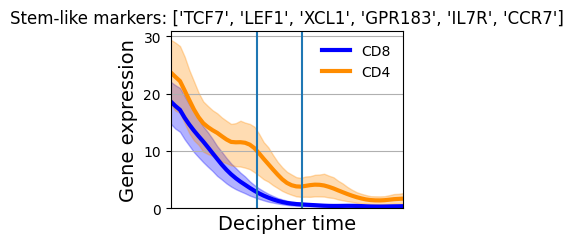

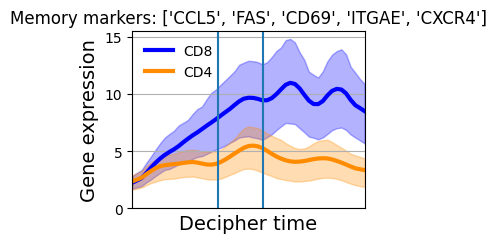

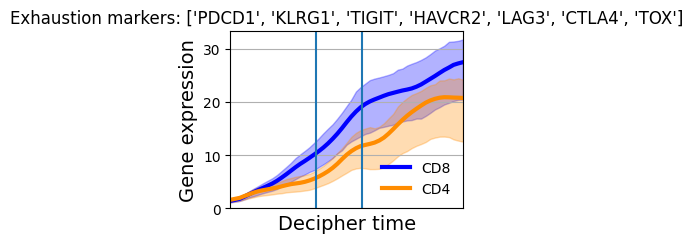

In [ ]:
quantiles = [1.9,2.9] # for separating dpt buckets, from contact_tracing_prep notebook

labels = {
    'Stem-like markers':['TCF7','LEF1','XCL1','GPR183','IL7R','CCR7'],
    'Memory markers':['CCL5', 'FAS', 'CD69', 'ITGAE', 'CXCR4'],
    'Exhaustion markers':['PDCD1', 'KLRG1', 'TIGIT', 'HAVCR2', 'LAG3', 'CTLA4','TOX']
}
for i,label in enumerate(labels.keys()):
    fig = dc.pl.gene_patterns(tcells_decipher, labels[label], pattern_names=['CD8','CD4'], palette = immune_cell_type_palette);
    plt.grid(None);
    plt.title(label + ": " + str(labels[label]));
    plt.axvline(quantiles[0])
    plt.axvline(quantiles[1])
    fig.savefig('fig/6- Cell Interactions/decipher_t_dpt_bucket'+str(i)+'.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(tcells_decipher, labels[label], pattern_names=['CD8']);
    plt.grid(None);
    plt.title(label + ": " + str(labels[label]));
    plt.axvline(quantiles[0])
    plt.axvline(quantiles[1])
    fig.savefig('fig/6- Cell Interactions/decipher_t_dpt_bucket'+str(i)+'.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

# T cell precursor signatures

See accompanying notebook defining T cell precursor signatures

## Figure 5E- T cell predictive signature violins

In [24]:
subsampled_sigs = pd.read_csv('sigs_scores_subsampled_tcells_032025.csv', index_col=0)
pvals = pd.read_csv('tcell_sig_permutation_test_results_032025.csv', index_col=0)

In [26]:
subsampled_sigs['R_Tx'] = subsampled_sigs['responder'].astype('str') + '_' + subsampled_sigs['treated'].astype('str')
order = ['Non-responder_Untreated','Non-responder_Treated',
         'Responder_Untreated','Responder_Treated']

sig = 'z3_dn'
sns.violinplot(subsampled_sigs, x='R_Tx', y=sig, order=order)
plt.savefig('fig/4- Immune T Cells/'+sig+'_subsampled_violin.pdf', dpi=300)
plt.clf()

sig = 'z9_up'
sns.violinplot(subsampled_sigs, x='R_Tx', y=sig, order=order)
plt.savefig('fig/4- Immune T Cells/'+sig+'_subsampled_violin.pdf', dpi=300)
plt.clf()

2025-03-20 15:29:51,807 | INFO : maxp pruned
2025-03-20 15:29:51,815 | INFO : cmap pruned
2025-03-20 15:29:51,815 | INFO : kern dropped
2025-03-20 15:29:51,816 | INFO : post pruned
2025-03-20 15:29:51,816 | INFO : FFTM dropped
2025-03-20 15:29:51,818 | INFO : GPOS pruned
2025-03-20 15:29:51,821 | INFO : GSUB pruned
2025-03-20 15:29:51,825 | INFO : glyf pruned
2025-03-20 15:29:51,826 | INFO : Added gid0 to subset
2025-03-20 15:29:51,827 | INFO : Added first four glyphs to subset
2025-03-20 15:29:51,827 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-03-20 15:29:51,827 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'T', 'U', 'a', 'd', 'e', 'five', 'four', 'hyphen', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'z', 'zero']
2025-03-20 15:29:51,828 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 24, 25, 26, 49, 53, 55, 56, 66, 68, 71, 72, 81, 82, 83, 85, 86, 87, 91, 93]
2025-03-20 15:29:5

<Figure size 640x480 with 0 Axes>

In [27]:
# first test R pre vs NR pre
# second test R post vs R pre
# third test NR post vs NR pre
pvals

,R_pre_v_NR_pre_test_statistic,R_pre_v_NR_pre_p_value,R_post_v_R_pre_test_statistic,R_post_v_R_pre_p_value,NR_post_v_NR_pre_test_statistic,NR_post_v_NR_pre_p_value
z1_up,-3.523130,0.0001,1.536926,0.0443,2.096380,0.0024
z1_dn,4.703524,0.0000,-1.222252,0.0427,0.691534,0.1642
z2_up,0.919605,0.1739,1.285341,0.0760,5.955261,0.0000
z2_dn,2.289591,0.0005,3.770157,0.0000,2.749977,0.0000
z3_up,5.510645,0.0000,12.883051,0.0000,13.447910,0.0000
z3_dn,-9.072069,0.0000,-6.619914,0.0000,-11.889038,0.0000
z4_up,7.401697,0.0000,-6.174814,0.0000,3.309471,0.0000
z4_dn,-6.585951,0.0000,2.567483,0.0000,-3.983812,0.0000
z5_up,-3.176720,0.0021,8.681883,0.0000,0.195318,0.8367
z5_dn,2.434582,0.0085,-7.968067,0.0000,0.744999,0.4071


## Figures 5D, S6E,F- predictive signature heatmap and reconstructed expression over decipher_time

In [28]:
df = pvals.copy()

In [29]:
threshold = 0.01
df_heatmap = pd.DataFrame(index=df.index, columns = ['R_pre_v_NR_pre', 'R_post_v_R_pre', 'NR_post_v_NR_pre'])
df_heatmap['R_pre_v_NR_pre'] = (df['R_pre_v_NR_pre_p_value'] < threshold ).astype('float64')
df_heatmap['R_pre_v_NR_pre'] = df_heatmap['R_pre_v_NR_pre'] * df['R_pre_v_NR_pre_test_statistic']
df_heatmap['R_post_v_R_pre'] = (df['R_post_v_R_pre_p_value'] < threshold ).astype('float64')
df_heatmap['R_post_v_R_pre'] = df_heatmap['R_post_v_R_pre'] * df['R_post_v_R_pre_test_statistic']
df_heatmap['NR_post_v_NR_pre'] = (df['NR_post_v_NR_pre_p_value'] < threshold ).astype('float64')
df_heatmap['NR_post_v_NR_pre'] = df_heatmap['NR_post_v_NR_pre'] * df['NR_post_v_NR_pre_test_statistic']
df_heatmap = df_heatmap.astype('float64').T

2025-03-20 15:30:47,159 | INFO : maxp pruned
2025-03-20 15:30:47,167 | INFO : cmap pruned
2025-03-20 15:30:47,167 | INFO : kern dropped
2025-03-20 15:30:47,167 | INFO : post pruned
2025-03-20 15:30:47,168 | INFO : FFTM dropped
2025-03-20 15:30:47,170 | INFO : GPOS pruned
2025-03-20 15:30:47,173 | INFO : GSUB pruned
2025-03-20 15:30:47,177 | INFO : glyf pruned
2025-03-20 15:30:47,178 | INFO : Added gid0 to subset
2025-03-20 15:30:47,179 | INFO : Added first four glyphs to subset
2025-03-20 15:30:47,179 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-03-20 15:30:47,179 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'd', 'e', 'eight', 'five', 'four', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'z', 'zero']
2025-03-20 15:30:47,180 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 49, 53, 66, 71, 72, 81, 82, 83, 85, 86, 87, 88, 89, 93, 3228]
2025-03-20

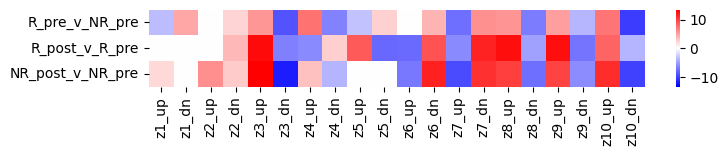

In [30]:
plt.figure(figsize=(8,1))
limit = max(np.max(df_heatmap), -np.min(df_heatmap))
sns.heatmap(df_heatmap, cmap='bwr', vmin=-limit, vmax=limit)
plt.savefig('fig/4- Immune T Cells/decipher_tcell_z_sig_heatmap.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [29]:
sigs_df = pd.read_csv('cd8_predictive_signatures_011525.csv', index_col=0)

2025-06-03 19:26:36,005 | INFO : maxp pruned
2025-06-03 19:26:36,016 | INFO : cmap pruned
2025-06-03 19:26:36,016 | INFO : kern dropped
2025-06-03 19:26:36,017 | INFO : post pruned
2025-06-03 19:26:36,017 | INFO : FFTM dropped
2025-06-03 19:26:36,020 | INFO : GPOS pruned
2025-06-03 19:26:36,023 | INFO : GSUB pruned
2025-06-03 19:26:36,792 | INFO : glyf pruned
2025-06-03 19:26:36,793 | INFO : Added gid0 to subset
2025-06-03 19:26:36,794 | INFO : Added first four glyphs to subset
2025-06-03 19:26:36,794 | INFO : Closing glyph list over 'GSUB': 21 glyphs before
2025-06-03 19:26:36,794 | INFO : Glyph names: ['.notdef', '.null', 'd', 'eight', 'five', 'four', 'n', 'nine', 'nonmarkingreturn', 'one', 'p', 'period', 'seven', 'six', 'space', 'three', 'two', 'u', 'underscore', 'z', 'zero']
2025-06-03 19:26:36,796 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 66, 71, 81, 83, 88, 93]
2025-06-03 19:26:36,798 | INFO : Closed glyph list over 'GSUB': 21 glyphs after
202

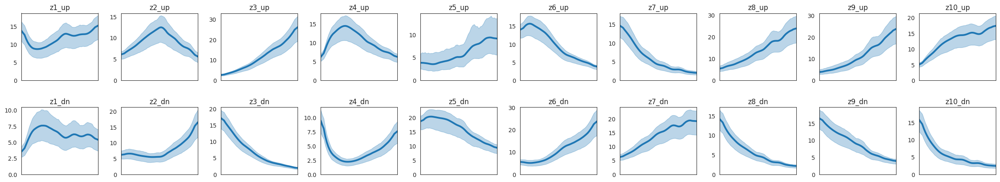

In [64]:
fig, axes = plt.subplots(2, 10, figsize=(30, 5), gridspec_kw={'wspace': 0.3, 'hspace': 0.4})
axes = axes.flatten()

for i, sig in enumerate(sigs_df.columns):
    # Calculate row and column indices to alternate between top and bottom rows
    row = 0 if (i % 2 == 0) else 1
    col = i // 2
    ax_idx = row * 10 + col
    
    dc.pl.gene_patterns(tcells_decipher, list(sigs_df[sig]), pattern_names=['CD8'], ax=axes[ax_idx])
    plt.grid(None)
    axes[ax_idx].set_xlabel('')
    axes[ax_idx].set_ylabel('')
    axes[ax_idx].set_title(sig)
    axes[ax_idx].get_legend().remove()
    axes[ax_idx].tick_params(axis='both', which='both', length=4, width=1, direction='out')

plt.tight_layout()
fig.savefig('fig/4- Immune T Cells/decipher_tcell_all_sigs_dpt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

# Myeloid cell integrative plots

### modify and reorder labels

In [27]:
sc.settings.figdir = 'fig/5- Immune Myeloid B Cells'
sc.set_figure_params(figsize = (12,8), dpi_save = 300, format = 'pdf', transparent = True, vector_friendly=False)

In [29]:
myeloid.obs['cell_type_fine'].value_counts()

cell_type_fine
Phagocytic Macrophage            6888
M2-like Macrophage               3149
Antigen-presenting Macrophage    2382
M1-like Macrophage               1540
Monocyte                         1421
cDC2                             1070
Cycling Myeloid                   646
cDC1                              484
DC3                               387
Osteoclast-like Cell               75
Langerhans Cell                    72
Microglial Cell                    38
Name: count, dtype: int64

In [31]:
myeloid.obs.loc[myeloid.obs['cell_type_fine'].isin(['Osteoclast-like Cell','Langerhans Cell','Microglial Cell']),['patient','cell_type_fine']].value_counts()

patient  cell_type_fine      
R308     Langerhans Cell         39
F10      Osteoclast-like Cell    37
F23      Microglial Cell         32
F20      Langerhans Cell         16
F10      Langerhans Cell         13
R334     Osteoclast-like Cell    10
F17      Osteoclast-like Cell     8
R329     Osteoclast-like Cell     7
F27      Osteoclast-like Cell     4
R310     Osteoclast-like Cell     2
F05      Osteoclast-like Cell     2
F28      Langerhans Cell          2
F15      Microglial Cell          1
F03      Osteoclast-like Cell     1
F15      Osteoclast-like Cell     1
F07      Microglial Cell          1
F09      Microglial Cell          1
R308     Osteoclast-like Cell     1
R294     Microglial Cell          1
         Osteoclast-like Cell     1
F22      Microglial Cell          1
R319     Langerhans Cell          1
R310     Microglial Cell          1
R328     Langerhans Cell          1
         Osteoclast-like Cell     1
Name: count, dtype: int64

In [32]:
# remove rare / patient-specific cell types
print(myeloid.shape)
myeloid = myeloid[~myeloid.obs['cell_type_fine'].isin(
    ['Osteoclast-like Cell','Langerhans Cell','Microglial Cell']
)]
print(myeloid.shape)

(18152, 2041)
(17967, 2041)


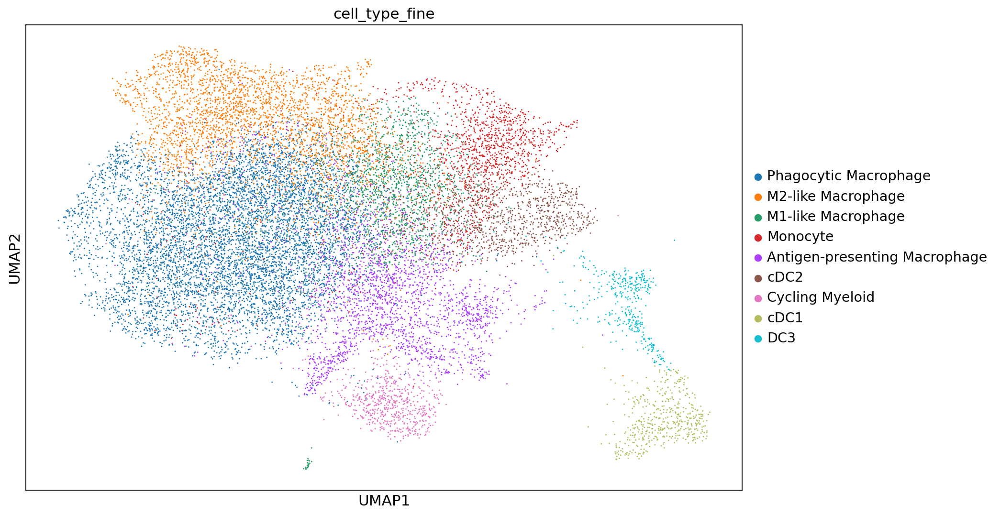

In [33]:
sc.pl.umap(myeloid, color='cell_type_fine')

In [34]:
list(myeloid.obs['cell_type_fine'].unique())

['M2-like Macrophage',
 'Monocyte',
 'Phagocytic Macrophage',
 'cDC2',
 'Antigen-presenting Macrophage',
 'DC3',
 'M1-like Macrophage',
 'cDC1',
 'Cycling Myeloid']

In [36]:
myeloid.obs['Cell Type'] = myeloid.obs['cell_type_fine'].copy()
myeloid.obs['Cell Type'] = myeloid.obs['Cell Type'].cat.reorder_categories([
    'Monocyte','cDC1','cDC2','DC3','Antigen-presenting Macrophage','Phagocytic Macrophage','M1-like Macrophage','M2-like Macrophage','Cycling Myeloid'
])

## Figure 6A,B, S7B- UMAP colored by cell type, macrophage subtype signatures, and other clinical covariates

In [39]:
sc.pl.umap(myeloid, color='Cell Type', palette = myeloid_cell_type_palette, s=20,
           save = '_myeloid_cell_type.pdf', show=False
          )

2025-03-24 18:50:35,908 | INFO : maxp pruned
2025-03-24 18:50:35,917 | INFO : cmap pruned
2025-03-24 18:50:35,920 | INFO : kern dropped
2025-03-24 18:50:35,920 | INFO : post pruned
2025-03-24 18:50:35,922 | INFO : FFTM dropped
2025-03-24 18:50:35,926 | INFO : GPOS pruned
2025-03-24 18:50:35,929 | INFO : GSUB pruned
2025-03-24 18:50:36,008 | INFO : glyf pruned
2025-03-24 18:50:36,010 | INFO : Added gid0 to subset
2025-03-24 18:50:36,010 | INFO : Added first four glyphs to subset
2025-03-24 18:50:36,010 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-03-24 18:50:36,011 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'M', 'P', 'T', 'U', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'y']
2025-03-24 18:50:36,012 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 22, 36, 38, 39, 48, 51, 55, 56, 68, 70, 71, 72, 74, 75, 76, 78, 79, 81, 82, 83, 85, 86, 87, 92]
2025-03-24 18:50:36,015 

<Axes: title={'center': 'Cell Type'}, xlabel='UMAP1', ylabel='UMAP2'>

In [40]:
myeloid.obs['ICI Timing'] = myeloid.obs['time'].replace({
    'pre' :'Pre ICI',
    'on'  :'On ICI',
    'post':'Post ICI',
})
myeloid.obs['ICI Timing'] = myeloid.obs['ICI Timing'].cat.reorder_categories(['Pre ICI','On ICI','Post ICI'])

In [41]:
sc.pl.umap(myeloid, color='ICI Timing', palette = clinical_variable_palette, s=20,
           save = '_myeloid_time.pdf', show=False
          )

2025-03-24 18:50:45,253 | INFO : maxp pruned
2025-03-24 18:50:45,261 | INFO : cmap pruned
2025-03-24 18:50:45,261 | INFO : kern dropped
2025-03-24 18:50:45,261 | INFO : post pruned
2025-03-24 18:50:45,262 | INFO : FFTM dropped
2025-03-24 18:50:45,263 | INFO : GPOS pruned
2025-03-24 18:50:45,267 | INFO : GSUB pruned
2025-03-24 18:50:45,271 | INFO : glyf pruned
2025-03-24 18:50:45,272 | INFO : Added gid0 to subset
2025-03-24 18:50:45,272 | INFO : Added first four glyphs to subset
2025-03-24 18:50:45,273 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2025-03-24 18:50:45,273 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'I', 'M', 'O', 'P', 'T', 'U', 'e', 'g', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'space', 't', 'two']
2025-03-24 18:50:45,274 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 36, 38, 44, 48, 50, 51, 55, 56, 72, 74, 76, 80, 81, 82, 85, 86, 87]
2025-03-24 18:50:45,276 | INFO : Closed glyph list over 'GSUB': 23 glyphs after
2025-03-24 18:50:45,277 |

<Axes: title={'center': 'ICI Timing'}, xlabel='UMAP1', ylabel='UMAP2'>

In [42]:
sc.pl.umap(myeloid, color='M1_ada1', s=20, vmin='p05', vmax='p95', vcenter=0, cmap = 'coolwarm', title= 'M1 Macrophage Signature',
           save = '_myeloid_m1.pdf', show=False
          )

2025-03-24 18:50:54,844 | INFO : maxp pruned
2025-03-24 18:50:54,851 | INFO : cmap pruned
2025-03-24 18:50:54,852 | INFO : kern dropped
2025-03-24 18:50:54,852 | INFO : post pruned
2025-03-24 18:50:54,852 | INFO : FFTM dropped
2025-03-24 18:50:54,854 | INFO : GPOS pruned
2025-03-24 18:50:54,857 | INFO : GSUB pruned
2025-03-24 18:50:54,862 | INFO : glyf pruned
2025-03-24 18:50:54,863 | INFO : Added gid0 to subset
2025-03-24 18:50:54,864 | INFO : Added first four glyphs to subset
2025-03-24 18:50:54,864 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2025-03-24 18:50:54,864 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'S', 'U', 'a', 'c', 'e', 'g', 'h', 'i', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 'space', 't', 'three', 'two', 'u', 'zero']
2025-03-24 18:50:54,865 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 36, 48, 51, 54, 56, 68, 70, 72, 74, 75, 76, 81, 82, 83, 85, 87, 88, 3228]
2025-03-24 18:50:54,867 | INFO : Closed glyph list 

<Axes: title={'center': 'M1 Macrophage Signature'}, xlabel='UMAP1', ylabel='UMAP2'>

In [43]:
sc.pl.umap(myeloid, color='M2_ada1', s=20, vmin='p05', vmax='p95', vcenter=0, cmap = 'coolwarm', title= 'M2 Macrophage Signature',
           save = '_myeloid_m2.pdf', show=False
          )

2025-03-24 18:50:59,306 | INFO : maxp pruned
2025-03-24 18:50:59,313 | INFO : cmap pruned
2025-03-24 18:50:59,314 | INFO : kern dropped
2025-03-24 18:50:59,314 | INFO : post pruned
2025-03-24 18:50:59,314 | INFO : FFTM dropped
2025-03-24 18:50:59,316 | INFO : GPOS pruned
2025-03-24 18:50:59,319 | INFO : GSUB pruned
2025-03-24 18:50:59,323 | INFO : glyf pruned
2025-03-24 18:50:59,324 | INFO : Added gid0 to subset
2025-03-24 18:50:59,324 | INFO : Added first four glyphs to subset
2025-03-24 18:50:59,324 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-03-24 18:50:59,325 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'S', 'U', 'a', 'c', 'e', 'eight', 'four', 'g', 'h', 'i', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 'six', 'space', 't', 'two', 'u', 'zero']
2025-03-24 18:50:59,325 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 36, 48, 51, 54, 56, 68, 70, 72, 74, 75, 76, 81, 82, 83, 85, 87, 88, 3228]
2025-03-24 18:50:59,329 | IN

<Axes: title={'center': 'M2 Macrophage Signature'}, xlabel='UMAP1', ylabel='UMAP2'>

In [44]:
sc.pl.umap(myeloid, color='jerby_mac_in_cold_tumors_down1', s=20, vmin='p05', vmax='p95', vcenter=0, cmap = 'coolwarm', title= 'Cold Tumor (Down) Signature',
           save = '_myeloid_jerbymac.pdf', show=False
          )

2025-03-24 18:51:09,472 | INFO : maxp pruned
2025-03-24 18:51:09,480 | INFO : cmap pruned
2025-03-24 18:51:09,481 | INFO : kern dropped
2025-03-24 18:51:09,481 | INFO : post pruned
2025-03-24 18:51:09,481 | INFO : FFTM dropped
2025-03-24 18:51:09,483 | INFO : GPOS pruned
2025-03-24 18:51:09,486 | INFO : GSUB pruned
2025-03-24 18:51:09,491 | INFO : glyf pruned
2025-03-24 18:51:09,492 | INFO : Added gid0 to subset
2025-03-24 18:51:09,492 | INFO : Added first four glyphs to subset
2025-03-24 18:51:09,493 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-03-24 18:51:09,493 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'M', 'P', 'S', 'T', 'U', 'a', 'd', 'e', 'eight', 'four', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 'six', 'space', 't', 'two', 'u', 'w', 'zero']
2025-03-24 18:51:09,494 | INFO : Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 19, 20, 21, 23, 25, 27, 36, 38, 39, 48, 51, 54, 55, 56, 68, 71, 72, 74,

<Axes: title={'center': 'Cold Tumor (Down) Signature'}, xlabel='UMAP1', ylabel='UMAP2'>

In [46]:
sc.pl.umap(myeloid, color='responder', palette = clinical_variable_palette, s=20,
           save = '_myeloid_responder.pdf', show=False
          )

2025-03-24 18:51:31,601 | INFO : maxp pruned
2025-03-24 18:51:31,609 | INFO : cmap pruned
2025-03-24 18:51:31,609 | INFO : kern dropped
2025-03-24 18:51:31,610 | INFO : post pruned
2025-03-24 18:51:31,610 | INFO : FFTM dropped
2025-03-24 18:51:31,611 | INFO : GPOS pruned
2025-03-24 18:51:31,614 | INFO : GSUB pruned
2025-03-24 18:51:31,914 | INFO : glyf pruned
2025-03-24 18:51:31,915 | INFO : Added gid0 to subset
2025-03-24 18:51:31,915 | INFO : Added first four glyphs to subset
2025-03-24 18:51:31,916 | INFO : Closing glyph list over 'GSUB': 20 glyphs before
2025-03-24 18:51:31,916 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'N', 'P', 'R', 'U', 'd', 'e', 'hyphen', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 'two']
2025-03-24 18:51:31,917 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 36, 48, 49, 51, 53, 56, 71, 72, 81, 82, 83, 85, 86]
2025-03-24 18:51:31,918 | INFO : Closed glyph list over 'GSUB': 20 glyphs after
2025-03-24 18:51:31,919 | INFO : Glyph names: [

<Axes: title={'center': 'responder'}, xlabel='UMAP1', ylabel='UMAP2'>

## Figure S7A- Dotplot for myeloid cell lineage and marker genes for subtype annotation

In [ ]:
# markers = ['CD11A','CD68','MPO','CD11B','CD11C']
# markers = list( set(markers) & set(myeloid.var_names) )

markers = {
    'Lineage Markers': ['APOE', 'CD14', 'CD163', 'CD33', 'CD68', 'CD81', 'CD9'],
    'Monocyte': ['CSF3R', 'FCN1', 'LYZ', 'MPO', 'VCAN'],
    'Dendritic Cells': ['CLEC9A', 'FLT3', 'IDO1', 'HLA-DQA1', 'LAMP3', 'XCR1','CD1C','CLEC10A','LY75','ITGAX'], # includes specific markers for cDC1, cDC2, DC3. DC3 could include ['KIF2A','IL15','TRAF1','RFTN1','MGLL','BIRC3','STK4','NFKB1','CD83','UVRAG','CERS6','LY75'] but LY75 seems to be the most relevant
    'Macrophage': ['CD68', 'FCGR1A', 'MERTK'],
    'Antigen-Presentation': ['B2M', 'HLA-A','HLA-B','HLA-C','HLA-DRA', 'HLA-DRB1'],
    'Phagocytosis': ['MARCO', 'MSR1', 'CD36', 'MERTK', 'MRC1'], # +['C1QB', 'CD163',]
    'M1 Polarization': ['CD80', 'CD86', 'NOS2', 'FCGR1A', 'FPR2', 'IFIT2'],
    'M2 Polarization': ['CD163', 'CD163L1', 'IL10', 'MRC1', 'PPARG', 'SELENOP', 'F13A1'],
    'Osteoclast-like': ['TNFRSF11A', 'MYO1D', 'MMP9', 'NFATC1'],
    'Langerhans': ['CD207'],
    'Microglial': ['LRP1B', 'CNTNAP2', 'MACROD2', 'NRXN3'],
    'Cell Cycle': ['HIST1H1B','BRCA1','BRCA2','H2AFZ','RRM2'] + ['BUB1','BUB1B','CDK1','CENPF','TOP2A'],
}

plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['text.color'] = 'black'
plt.rcParams['axes.labelcolor'] = 'black'
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'

myeloid.obs['cell_type_fine'] = myeloid.obs['cell_type_fine'].cat.reorder_categories([
    'Monocyte','cDC1','cDC2','DC3','Antigen-presenting Macrophage','Phagocytic Macrophage','M1-like Macrophage','M2-like Macrophage','Osteoclast-like Cell','Langerhans Cell','Microglial Cell','Cycling Myeloid',
])

sc.pl.matrixplot(myeloid, var_names = markers, groupby='cell_type_fine', use_raw=True, 
                 standard_scale='var', colorbar_title='Relative\nmean expression\nin group',
                 save = 'markers_matrix.pdf', show=False,
                 cmap='RdBu_r', # Red-Blue diverging colormap
                 var_group_rotation=45,
                )

2025-06-05 20:01:52,994 | INFO : maxp pruned
2025-06-05 20:01:53,003 | INFO : cmap pruned
2025-06-05 20:01:53,003 | INFO : kern dropped
2025-06-05 20:01:53,004 | INFO : post pruned
2025-06-05 20:01:53,004 | INFO : FFTM dropped
2025-06-05 20:01:53,006 | INFO : GPOS pruned
2025-06-05 20:01:53,009 | INFO : GSUB pruned
2025-06-05 20:01:53,015 | INFO : glyf pruned
2025-06-05 20:01:53,016 | INFO : Added gid0 to subset
2025-06-05 20:01:53,016 | INFO : Added first four glyphs to subset
2025-06-05 20:01:53,016 | INFO : Closing glyph list over 'GSUB': 61 glyphs before
2025-06-05 20:01:53,016 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'Z', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'x', 'y', 'z', 'zero']
2025-06-05 20:

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'color_legend_ax': <Axes: title={'center': 'Relative\nmean expression\nin group'}>}

## Figure 6B- {treated/untreated} vs. {R/NR} violins for immunogenic macrophage signature (Jerby-Arnon et al)

In [ ]:
macrophage = myeloid[myeloid.obs['cell_type_fine'].isin(
    ['Antigen-presenting Macrophages','Phagocytic Macrophage',
     'M1-like Macrophage','M2-like Macrophage',]
)]

In [ ]:
df = macrophage.obs.copy()

2025-03-24 19:29:44,694 | INFO : maxp pruned
2025-03-24 19:29:44,701 | INFO : cmap pruned
2025-03-24 19:29:44,701 | INFO : kern dropped
2025-03-24 19:29:44,702 | INFO : post pruned
2025-03-24 19:29:44,702 | INFO : FFTM dropped
2025-03-24 19:29:44,704 | INFO : GPOS pruned
2025-03-24 19:29:44,707 | INFO : GSUB pruned
2025-03-24 19:29:44,712 | INFO : glyf pruned
2025-03-24 19:29:44,713 | INFO : Added gid0 to subset
2025-03-24 19:29:44,713 | INFO : Added first four glyphs to subset
2025-03-24 19:29:44,713 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-03-24 19:29:44,713 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'T', 'U', 'a', 'b', 'c', 'd', 'e', 'five', 'hyphen', 'i', 'j', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'w', 'y', 'zero']
2025-03-24 19:29:44,714 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 24, 49, 53, 55, 56, 66, 68, 69, 70, 71, 72, 76, 77, 79, 80, 81, 82, 83, 85, 86, 87, 88, 

0.0 p-val for Treated R vs. NR
55.341897108947194 statistic for Treated R vs. NR
medians: 0.5213302644719173 vs. 0.08456540506965152
1.416204231602847e-58 p-val for Untreated R vs. NR
16.435886277635746 statistic for Untreated R vs. NR
medians: 0.19919447879487645 vs. 0.036721266469372016


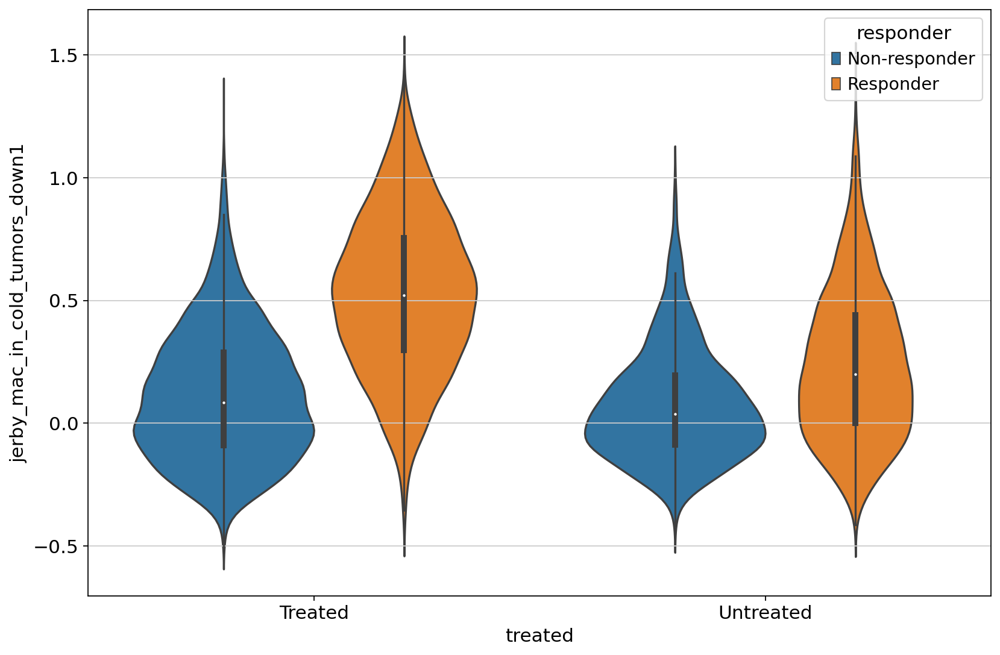

In [ ]:
ax = sns.violinplot(df, x='treated', y='jerby_mac_in_cold_tumors_down1', hue='responder')

res = scipy.stats.ttest_ind(
    df[(df['treated']=='Treated')&(df['responder']=='Responder')]['jerby_mac_in_cold_tumors_down1'].values,
    df[(df['treated']=='Treated')&(df['responder']=='Non-responder')]['jerby_mac_in_cold_tumors_down1'].values
)
print(res.pvalue, 'p-val for Treated R vs. NR')
print(res.statistic, 'statistic for Treated R vs. NR')
print('medians:', df[(df['treated']=='Treated')&(df['responder']=='Responder')]['jerby_mac_in_cold_tumors_down1'].median(), 'vs.', df[(df['treated']=='Treated')&(df['responder']=='Non-responder')]['jerby_mac_in_cold_tumors_down1'].median())
res = scipy.stats.ttest_ind(
    df[(df['treated']=='Untreated')&(df['responder']=='Responder')]['jerby_mac_in_cold_tumors_down1'].values,
    df[(df['treated']=='Untreated')&(df['responder']=='Non-responder')]['jerby_mac_in_cold_tumors_down1'].values
)
print(res.pvalue, 'p-val for Untreated R vs. NR')
print(res.statistic, 'statistic for Untreated R vs. NR')
print('medians:', df[(df['treated']=='Untreated')&(df['responder']=='Responder')]['jerby_mac_in_cold_tumors_down1'].median(), 'vs.', df[(df['treated']=='Untreated')&(df['responder']=='Non-responder')]['jerby_mac_in_cold_tumors_down1'].median())

ax.get_figure().savefig('fig/5- Immune Myeloid B Cells/hot_mac_sig_violins.pdf', dpi=300)

# Myeloid Decipher plots 

In [26]:
sc.settings.figdir = 'fig/5- Immune Myeloid B Cells'
sc.set_figure_params(figsize = (16,8), dpi_save = 300, format = 'pdf', transparent = True, vector_friendly=False)

## Figure 6C,D, S7E- Decipher plot colored by decipher_time, macrophage signatures, cell_type + minimum spanning tree trajectories

In [27]:
myeloid_decipher.obs['Cell Type'] = myeloid_decipher.obs['cell_type_fine'].copy()
myeloid_decipher.obs['Cell Type'] = myeloid_decipher.obs['Cell Type'].cat.reorder_categories([
    'Monocyte','Antigen-presenting Macrophage','Phagocytic Macrophage','M1-like Macrophage','M2-like Macrophage'
])

2025-04-03 14:10:12,911 | INFO : maxp pruned
2025-04-03 14:10:12,919 | INFO : cmap pruned
2025-04-03 14:10:12,922 | INFO : kern dropped
2025-04-03 14:10:12,922 | INFO : post pruned
2025-04-03 14:10:12,923 | INFO : FFTM dropped
2025-04-03 14:10:12,926 | INFO : GPOS pruned
2025-04-03 14:10:12,929 | INFO : GSUB pruned
2025-04-03 14:10:12,977 | INFO : glyf pruned
2025-04-03 14:10:12,978 | INFO : Added gid0 to subset
2025-04-03 14:10:12,979 | INFO : Added first four glyphs to subset
2025-04-03 14:10:12,979 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 14:10:12,979 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'M', 'P', 'T', 'a', 'c', 'e', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'y']
2025-04-03 14:10:12,981 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 36, 38, 39, 48, 51, 55, 68, 70, 72, 74, 75, 76, 78, 79, 81, 82, 83, 85, 86, 87, 92]
2025-04-03 14:10:12,984 | INFO : Closed glyph list over

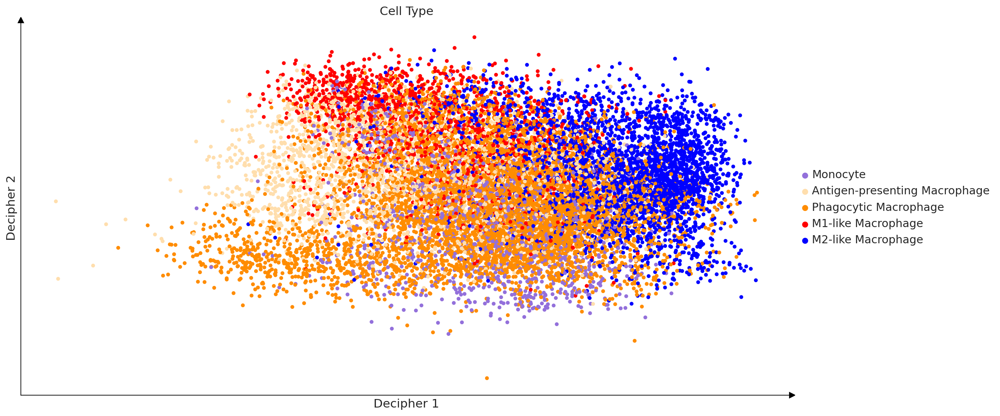

In [ ]:
fig = dc.pl.decipher(myeloid_decipher, color='Cell Type', figsize=(16,8), s=80, palette = myeloid_cell_type_palette, title = 'Cell Type')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_cell_type.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 14:10:14,826 | INFO : maxp pruned
2025-04-03 14:10:14,834 | INFO : cmap pruned
2025-04-03 14:10:14,835 | INFO : kern dropped
2025-04-03 14:10:14,835 | INFO : post pruned
2025-04-03 14:10:14,835 | INFO : FFTM dropped
2025-04-03 14:10:14,837 | INFO : GPOS pruned
2025-04-03 14:10:14,840 | INFO : GSUB pruned
2025-04-03 14:10:14,844 | INFO : glyf pruned
2025-04-03 14:10:14,845 | INFO : Added gid0 to subset
2025-04-03 14:10:14,845 | INFO : Added first four glyphs to subset
2025-04-03 14:10:14,845 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 14:10:14,846 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'M', 'P', 'S', 'T', 'a', 'c', 'e', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'y']
2025-04-03 14:10:14,847 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 36, 39, 48, 51, 54, 55, 68, 70, 72, 74, 75, 76, 78, 79, 81, 82, 83, 85, 86, 87, 92]
2025-04-03 14:10:14,849 | INFO : Closed glyph list over

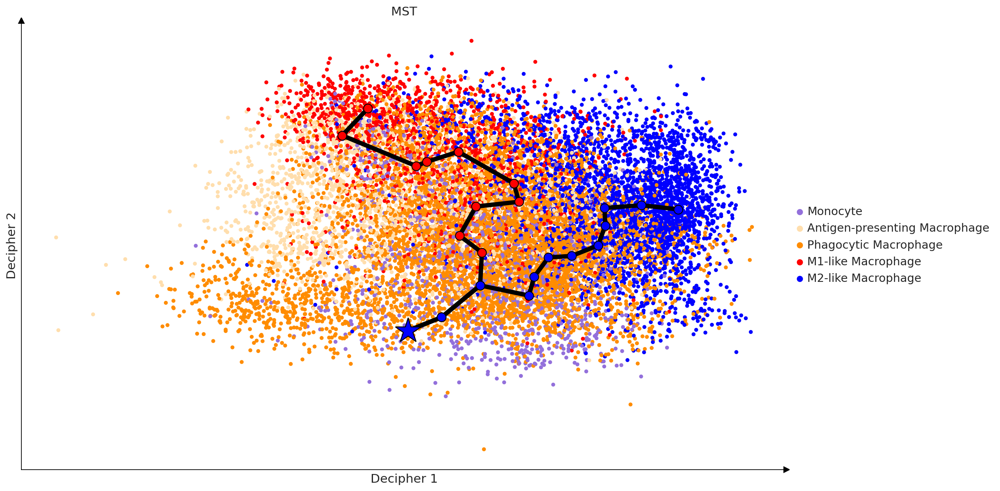

In [30]:
def plot_trajectories(adata, decipher_fig, palette = immune_cell_type_palette, o_size=10, star_size=30, linewidth=5):
    ax = decipher_fig.axes[0]
    for trajectory in adata.uns['decipher']['trajectories'].keys():
        color = palette[trajectory]
        coords = adata.uns['decipher']['trajectories'][trajectory]['cluster_locations']
        ax.plot(coords[:, 0],coords[:, 1],marker="o",c='black',
                markerfacecolor=color,markersize=o_size,linewidth=linewidth)
        ax.plot(coords[:1, 0],coords[:1, 1],marker="*",
                markersize=star_size,c="black",markerfacecolor=color)
    return decipher_fig

fig = dc.pl.decipher(myeloid_decipher, color='Cell Type', figsize=(16,8), s=80, title = 'MST', palette = myeloid_cell_type_palette)
plot_trajectories(myeloid_decipher, fig, palette = myeloid_cell_type_palette)
plt.tight_layout()
fig.set_rasterized(False)
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_cell_type_trajectories.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 14:10:16,402 | INFO : maxp pruned
2025-04-03 14:10:16,410 | INFO : cmap pruned
2025-04-03 14:10:16,411 | INFO : kern dropped
2025-04-03 14:10:16,411 | INFO : post pruned
2025-04-03 14:10:16,411 | INFO : FFTM dropped
2025-04-03 14:10:16,413 | INFO : GPOS pruned
2025-04-03 14:10:16,416 | INFO : GSUB pruned
2025-04-03 14:10:16,421 | INFO : glyf pruned
2025-04-03 14:10:16,422 | INFO : Added gid0 to subset
2025-04-03 14:10:16,423 | INFO : Added first four glyphs to subset
2025-04-03 14:10:16,423 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2025-04-03 14:10:16,423 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'N', 'V', 'c', 'e', 'eight', 'four', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'period', 'r', 'six', 'space', 'two', 'zero']
2025-04-03 14:10:16,424 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 36, 38, 39, 49, 57, 70, 72, 75, 76, 83, 85]
2025-04-03 14:10:16,427 | INFO : Closed glyph list over 'GSUB': 22 glyphs after
2025-04-03 14:10:

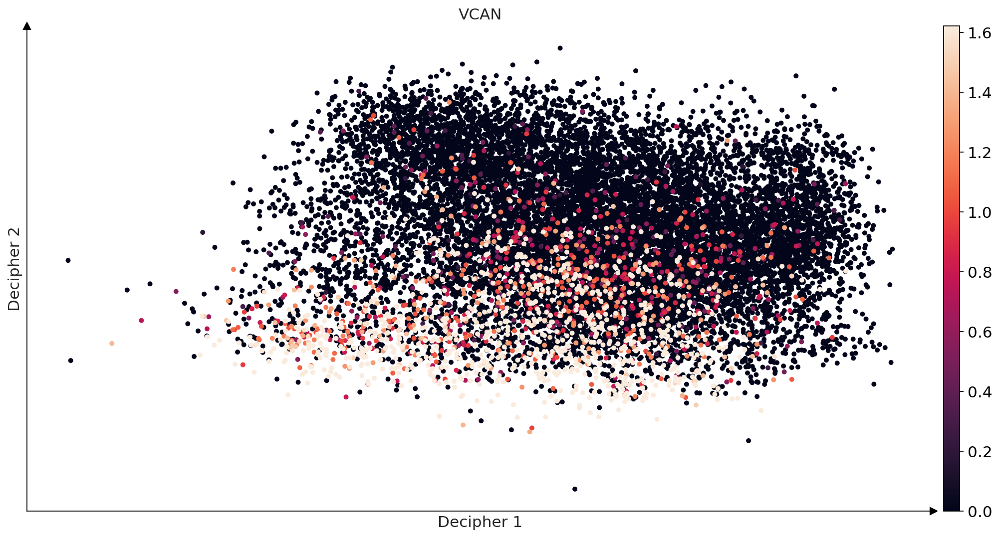

In [31]:
fig = dc.pl.decipher(myeloid_decipher, color='VCAN', figsize=(16,8), s=80, title = 'VCAN', layer='normalized_counts', vmin=0,vmax='p95')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_VCAN.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 14:10:17,942 | INFO : maxp pruned
2025-04-03 14:10:17,950 | INFO : cmap pruned
2025-04-03 14:10:17,950 | INFO : kern dropped
2025-04-03 14:10:17,950 | INFO : post pruned
2025-04-03 14:10:17,951 | INFO : FFTM dropped
2025-04-03 14:10:17,952 | INFO : GPOS pruned
2025-04-03 14:10:17,956 | INFO : GSUB pruned
2025-04-03 14:10:17,960 | INFO : glyf pruned
2025-04-03 14:10:17,961 | INFO : Added gid0 to subset
2025-04-03 14:10:17,961 | INFO : Added first four glyphs to subset
2025-04-03 14:10:17,962 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2025-04-03 14:10:17,962 | INFO : Glyph names: ['.notdef', '.null', 'D', 'M', 'S', 'a', 'c', 'e', 'g', 'h', 'i', 'minus', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 'space', 'three', 'two', 'zero']
2025-04-03 14:10:17,963 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 39, 48, 54, 68, 70, 72, 74, 75, 76, 82, 83, 85, 3228]
2025-04-03 14:10:17,965 | INFO : Closed glyph list over 'GSUB': 22 glyphs after
2025-04-03 14:10

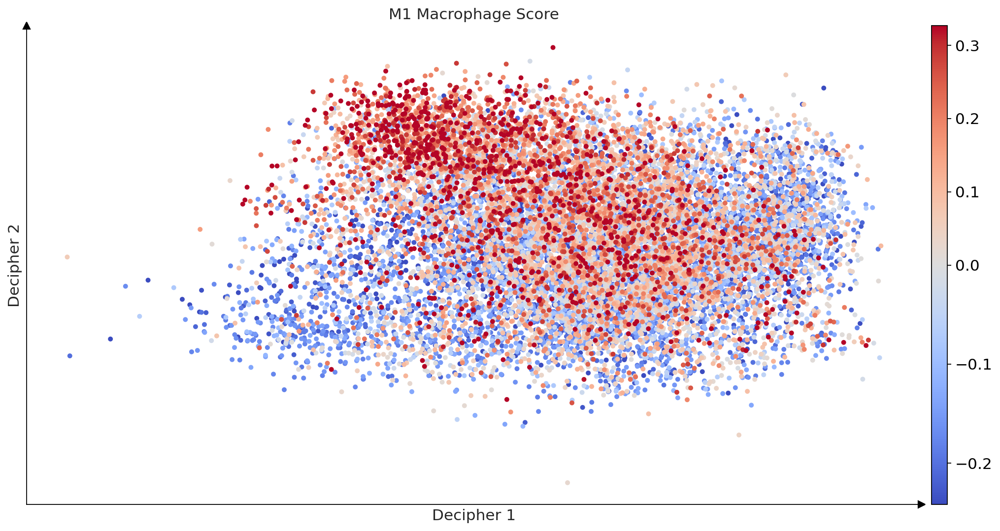

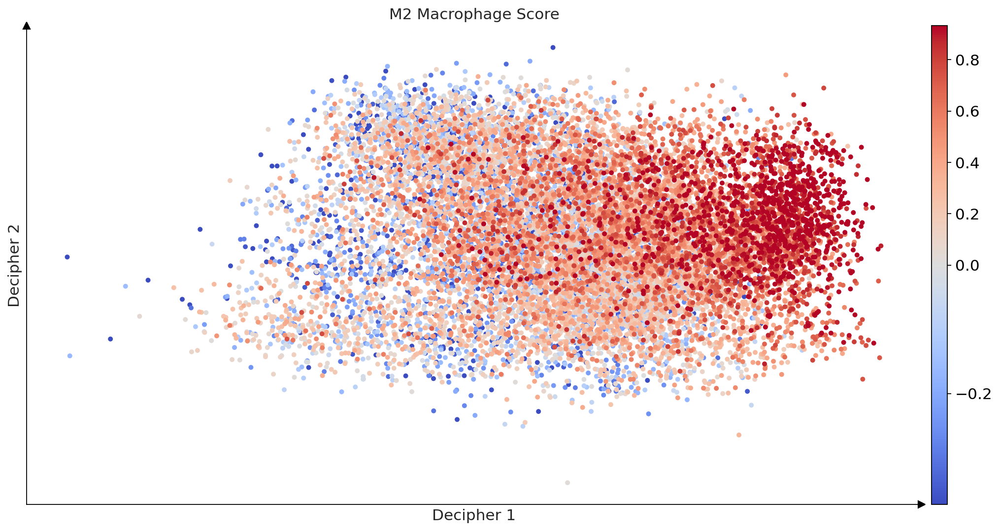

In [32]:
fig = dc.pl.decipher(myeloid_decipher, color='M1_ada1', figsize=(16,8), s=80, title = 'M1 Macrophage Score', vmin='p05', vcenter=0, vmax='p95', cmap='coolwarm')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_M1_score.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

fig = dc.pl.decipher(myeloid_decipher, color='M2_ada1', figsize=(16,8), s=80, title = 'M2 Macrophage Score', vmin='p05', vcenter=0, vmax='p95', cmap='coolwarm')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_M2_score.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:09,131 | INFO : maxp pruned
2025-04-03 19:09:09,140 | INFO : cmap pruned
2025-04-03 19:09:09,141 | INFO : kern dropped
2025-04-03 19:09:09,142 | INFO : post pruned
2025-04-03 19:09:09,143 | INFO : FFTM dropped
2025-04-03 19:09:09,145 | INFO : GPOS pruned
2025-04-03 19:09:09,149 | INFO : GSUB pruned
2025-04-03 19:09:09,155 | INFO : glyf pruned
2025-04-03 19:09:09,156 | INFO : Added gid0 to subset
2025-04-03 19:09:09,156 | INFO : Added first four glyphs to subset
2025-04-03 19:09:09,157 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-04-03 19:09:09,157 | INFO : Glyph names: ['.notdef', '.null', 'D', 'P', 'c', 'd', 'e', 'five', 'h', 'i', 'm', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'u', 'zero']
2025-04-03 19:09:09,159 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 24, 39, 51, 70, 71, 72, 75, 76, 80, 82, 83, 85, 86, 87, 88]
2025-04-03 19:09:09,162 | INFO : Closed glyph list over 'GSUB': 24 glyphs after
2

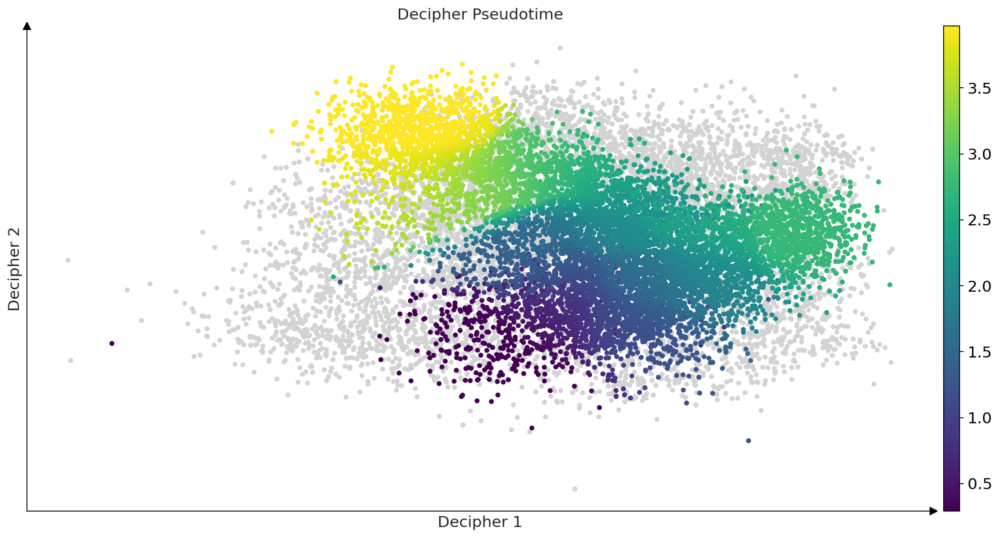

In [ ]:
fig = dc.pl.decipher(myeloid_decipher, color='decipher_time', figsize=(16,8), s=80, title = 'Decipher Pseudotime', cmap='viridis')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_pseudotime.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [29]:
myeloid_decipher.obs['ICI Timing'] = myeloid_decipher.obs['time'].replace({
    'pre' :'Pre ICI',
    'on'  :'On ICI',
    'post':'Post ICI',
})
myeloid_decipher.obs['ICI Timing'] = myeloid_decipher.obs['ICI Timing'].cat.reorder_categories(['Pre ICI','On ICI','Post ICI'])

2025-04-03 14:10:22,591 | INFO : maxp pruned
2025-04-03 14:10:22,599 | INFO : cmap pruned
2025-04-03 14:10:22,600 | INFO : kern dropped
2025-04-03 14:10:22,600 | INFO : post pruned
2025-04-03 14:10:22,600 | INFO : FFTM dropped
2025-04-03 14:10:22,602 | INFO : GPOS pruned
2025-04-03 14:10:22,605 | INFO : GSUB pruned
2025-04-03 14:10:22,609 | INFO : glyf pruned
2025-04-03 14:10:22,610 | INFO : Added gid0 to subset
2025-04-03 14:10:22,610 | INFO : Added first four glyphs to subset
2025-04-03 14:10:22,610 | INFO : Closing glyph list over 'GSUB': 25 glyphs before
2025-04-03 14:10:22,611 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'O', 'P', 'T', 'a', 'c', 'e', 'g', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two']
2025-04-03 14:10:22,612 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 38, 39, 44, 50, 51, 55, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87]
2025-04-03 14:10:22,615 | INFO : Closed glyph list over 'GSUB': 25 glyphs after
2025-04

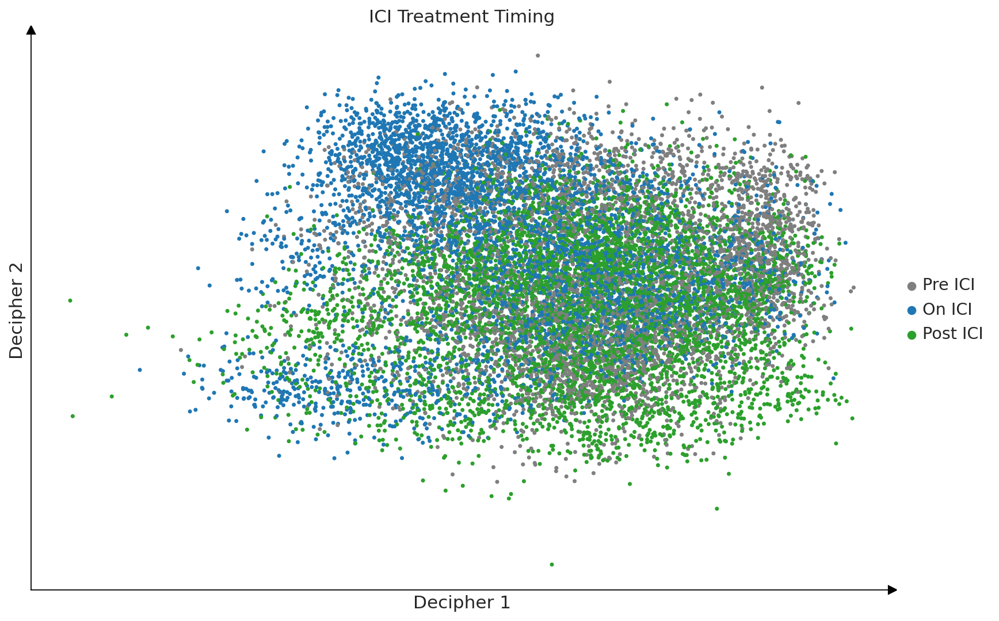

In [35]:
fig = dc.pl.decipher(myeloid_decipher, color='ICI Timing', palette = clinical_variable_palette, figsize=(12,8), s=40, title = 'ICI Treatment Timing')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_time.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S7D- Decipher plot colored by patient (run using dataset including F26 patient)

In [ ]:
fig = dc.pl.decipher(myeloid_decipher, color='patient', figsize=(12,8), s=40, title = 'Patient')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_pt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure 6F- Projection of cells on Decipher pseudotime colored by clinical covariates

In [30]:
def plot_distributions_trajectories(adata, hue, trajectory=None, title=None, palette=None, cutoff=False):
    df = adata.obs.copy()
    if trajectory != None:
        clusters = adata.uns['decipher']['trajectories'][trajectory]['cluster_ids']
        df = df[df['decipher_clusters'].isin(set(clusters))]
    if cutoff:
        cutoff = np.max(adata.uns['decipher']['trajectories'][trajectory]['times'])
        df = df[df['decipher_time']<=cutoff]
    fig,ax = plt.subplots(1,1,figsize=(12,3))
    sns.kdeplot(df, x='decipher_time', hue=hue, multiple='fill', ax=ax, legend=False, palette=palette)
    # sns.histplot(df, x='decipher_time', hue=hue, multiple='fill', ax=ax, legend=False, palette=palette)
    ax.grid(False)
    plt.tick_params(left=False, bottom=False)
    ax.set(xticklabels=[], yticklabels=[], xlabel=title, ylabel=None)
    plt.tight_layout()
    return fig

2025-04-03 19:09:09,907 | INFO : maxp pruned
2025-04-03 19:09:09,915 | INFO : cmap pruned
2025-04-03 19:09:09,916 | INFO : kern dropped
2025-04-03 19:09:09,916 | INFO : post pruned
2025-04-03 19:09:09,917 | INFO : FFTM dropped
2025-04-03 19:09:09,919 | INFO : GPOS pruned
2025-04-03 19:09:09,922 | INFO : GSUB pruned
2025-04-03 19:09:09,928 | INFO : glyf pruned
2025-04-03 19:09:09,929 | INFO : Added gid0 to subset
2025-04-03 19:09:09,929 | INFO : Added first four glyphs to subset
2025-04-03 19:09:09,930 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-04-03 19:09:09,930 | INFO : Glyph names: ['.notdef', '.null', 'M', 'P', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'u', 'y']
2025-04-03 19:09:09,931 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 48, 51, 68, 70, 71, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-04-03 19:09:09,934 | INFO : Closed glyph list over 'GSUB': 24 glyphs after
2025-04-03 19

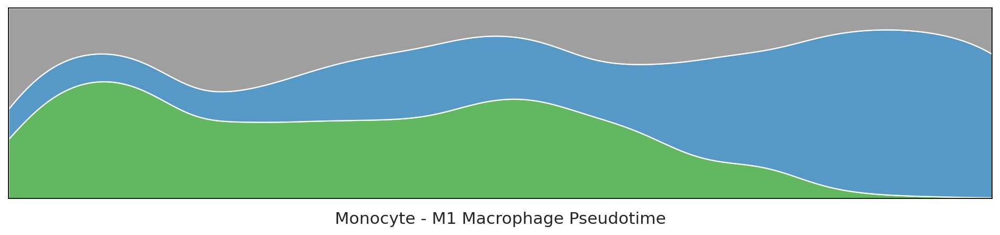

In [31]:
fig = plot_distributions_trajectories(myeloid_decipher, hue='ICI Timing', trajectory = 'Monocyte-M1', title='Monocyte - M1 Macrophage Pseudotime', palette = clinical_variable_palette, cutoff=False)
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_time_m1.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:10,311 | INFO : maxp pruned
2025-04-03 19:09:10,319 | INFO : cmap pruned
2025-04-03 19:09:10,320 | INFO : kern dropped
2025-04-03 19:09:10,320 | INFO : post pruned
2025-04-03 19:09:10,321 | INFO : FFTM dropped
2025-04-03 19:09:10,323 | INFO : GPOS pruned
2025-04-03 19:09:10,327 | INFO : GSUB pruned
2025-04-03 19:09:10,332 | INFO : glyf pruned
2025-04-03 19:09:10,333 | INFO : Added gid0 to subset
2025-04-03 19:09:10,333 | INFO : Added first four glyphs to subset
2025-04-03 19:09:10,334 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-04-03 19:09:10,334 | INFO : Glyph names: ['.notdef', '.null', 'M', 'P', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'two', 'u', 'y']
2025-04-03 19:09:10,335 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 21, 48, 51, 68, 70, 71, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-04-03 19:09:10,338 | INFO : Closed glyph list over 'GSUB': 24 glyphs after
2025-04-03 19

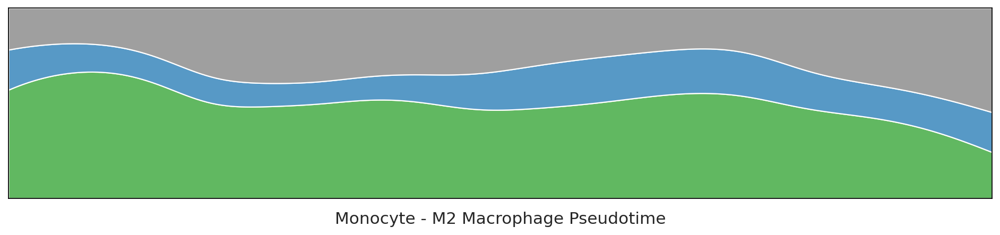

In [32]:
fig = plot_distributions_trajectories(myeloid_decipher, hue='ICI Timing', trajectory = 'Monocyte-M2', title='Monocyte - M2 Macrophage Pseudotime', palette = clinical_variable_palette, cutoff=True)
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_time_m2.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:11,519 | INFO : maxp pruned
2025-04-03 19:09:11,526 | INFO : cmap pruned
2025-04-03 19:09:11,527 | INFO : kern dropped
2025-04-03 19:09:11,527 | INFO : post pruned
2025-04-03 19:09:11,527 | INFO : FFTM dropped
2025-04-03 19:09:11,529 | INFO : GPOS pruned
2025-04-03 19:09:11,532 | INFO : GSUB pruned
2025-04-03 19:09:11,537 | INFO : glyf pruned
2025-04-03 19:09:11,538 | INFO : Added gid0 to subset
2025-04-03 19:09:11,538 | INFO : Added first four glyphs to subset
2025-04-03 19:09:11,538 | INFO : Closing glyph list over 'GSUB': 20 glyphs before
2025-04-03 19:09:11,538 | INFO : Glyph names: ['.notdef', '.null', 'D', 'N', 'R', 'c', 'd', 'e', 'h', 'hyphen', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 'two']
2025-04-03 19:09:11,539 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 21, 39, 49, 53, 70, 71, 72, 75, 76, 81, 82, 83, 85, 86]
2025-04-03 19:09:11,542 | INFO : Closed glyph list over 'GSUB': 20 glyphs after
2025-04-03 19:09:11,542 | INFO : Glyph names: [

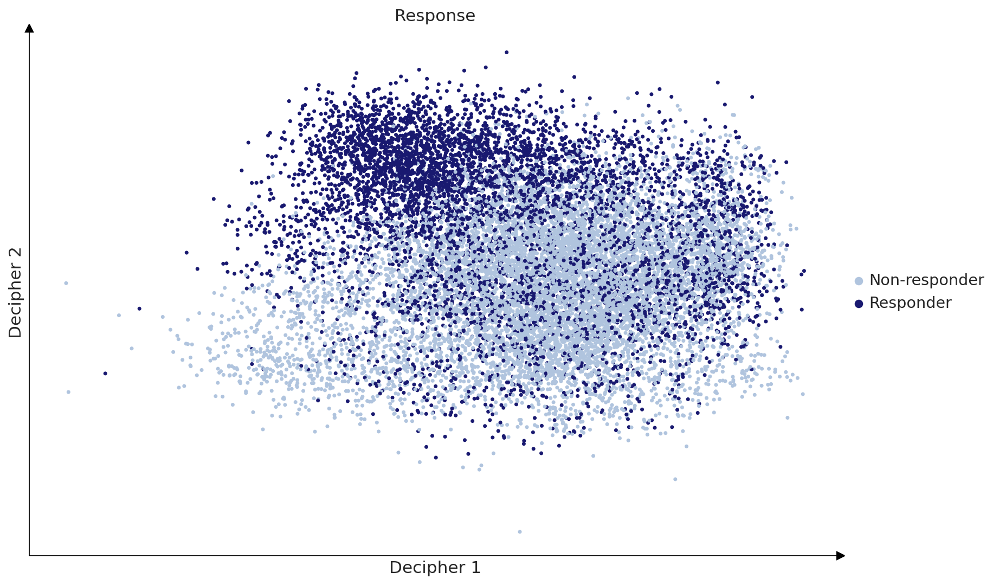

In [33]:
fig = dc.pl.decipher(myeloid_decipher, color='responder', palette = clinical_variable_palette, figsize=(12,8), s=40, title = 'Response')
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_response.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:12,126 | INFO : maxp pruned
2025-04-03 19:09:12,134 | INFO : cmap pruned
2025-04-03 19:09:12,135 | INFO : kern dropped
2025-04-03 19:09:12,136 | INFO : post pruned
2025-04-03 19:09:12,136 | INFO : FFTM dropped
2025-04-03 19:09:12,138 | INFO : GPOS pruned
2025-04-03 19:09:12,142 | INFO : GSUB pruned
2025-04-03 19:09:12,148 | INFO : glyf pruned
2025-04-03 19:09:12,149 | INFO : Added gid0 to subset
2025-04-03 19:09:12,149 | INFO : Added first four glyphs to subset
2025-04-03 19:09:12,150 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-04-03 19:09:12,150 | INFO : Glyph names: ['.notdef', '.null', 'M', 'P', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'u', 'y']
2025-04-03 19:09:12,151 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 20, 48, 51, 68, 70, 71, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-04-03 19:09:12,154 | INFO : Closed glyph list over 'GSUB': 24 glyphs after
2025-04-03 19

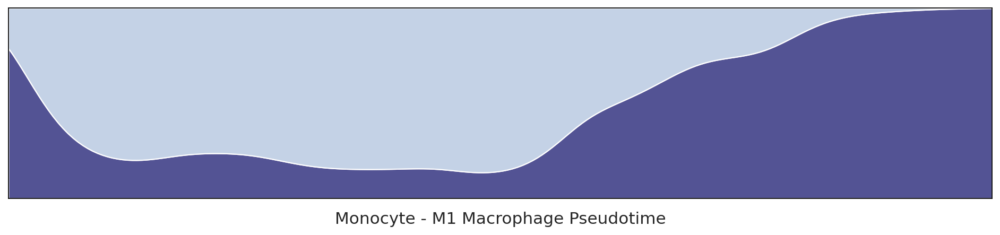

In [34]:
fig = plot_distributions_trajectories(myeloid_decipher, hue='responder', trajectory = 'Monocyte-M1', title='Monocyte - M1 Macrophage Pseudotime', palette = clinical_variable_palette, cutoff=False)
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_response_m1.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:12,599 | INFO : maxp pruned
2025-04-03 19:09:12,607 | INFO : cmap pruned
2025-04-03 19:09:12,608 | INFO : kern dropped
2025-04-03 19:09:12,608 | INFO : post pruned
2025-04-03 19:09:12,609 | INFO : FFTM dropped
2025-04-03 19:09:12,611 | INFO : GPOS pruned
2025-04-03 19:09:12,614 | INFO : GSUB pruned
2025-04-03 19:09:12,620 | INFO : glyf pruned
2025-04-03 19:09:12,621 | INFO : Added gid0 to subset
2025-04-03 19:09:12,622 | INFO : Added first four glyphs to subset
2025-04-03 19:09:12,622 | INFO : Closing glyph list over 'GSUB': 24 glyphs before
2025-04-03 19:09:12,623 | INFO : Glyph names: ['.notdef', '.null', 'M', 'P', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'two', 'u', 'y']
2025-04-03 19:09:12,624 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 21, 48, 51, 68, 70, 71, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-04-03 19:09:12,627 | INFO : Closed glyph list over 'GSUB': 24 glyphs after
2025-04-03 19

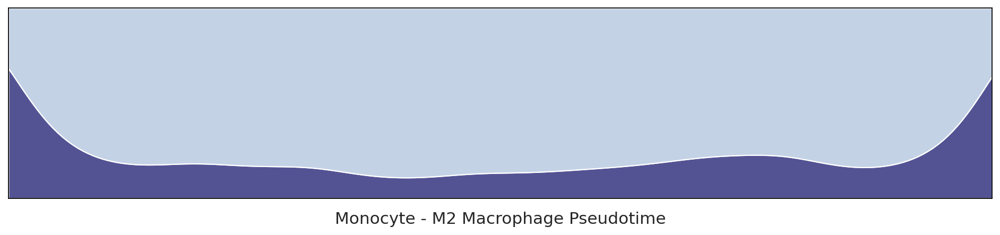

In [35]:
fig = plot_distributions_trajectories(myeloid_decipher, hue='responder', trajectory = 'Monocyte-M2', title='Monocyte - M2 Macrophage Pseudotime', palette = clinical_variable_palette, cutoff=True)
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_response_m2.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

### statistical tests

In [36]:
df = myeloid_decipher.obs.copy()
df_m1 = df[df['decipher_clusters'].isin(set(myeloid_decipher.uns['decipher']['trajectories']['Monocyte-M1']['cluster_ids']))]
# df_m1 = df_m1[df_m1['decipher_time']<=np.max(myeloid_decipher.uns['decipher']['trajectories']['Monocyte-M1']['times'])]
df_m2 = df[df['decipher_clusters'].isin(set(myeloid_decipher.uns['decipher']['trajectories']['Monocyte-M2']['cluster_ids']))]
df_m2 = df_m2[df_m2['decipher_time']<=np.max(myeloid_decipher.uns['decipher']['trajectories']['Monocyte-M2']['times'])]

In [37]:
# wasserstein test for p-val for R/NR and TCR plots
from scipy.stats import wasserstein_distance

def permutation_test_wasserstein(data1, data2, n_permutations=1000, random_seed=0):
    """
    Perform a permutation test using the Wasserstein distance.

    Parameters:
        data1 (array-like): First dataset.
        data2 (array-like): Second dataset.
        n_permutations (int): Number of permutations.
        random_seed (int or None): Random seed for reproducibility.

    Returns:
        dict: Wasserstein distance, p-value, and distribution of permuted distances.
    """
    if random_seed is not None:
        np.random.seed(random_seed)
    
    original_distance = wasserstein_distance(data1, data2)
    
    combined = np.concatenate([data1, data2])
    n1 = len(data1)
    
    permuted_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        permuted_data1 = combined[:n1]
        permuted_data2 = combined[n1:]
        distance = wasserstein_distance(permuted_data1, permuted_data2)
        permuted_distances.append(distance)
    
    p_value = np.mean(np.array(permuted_distances) >= original_distance)
    
    return {
        'original_distance': original_distance,
        'p_value': p_value,
        'permuted_distances': permuted_distances
    }

In [38]:
result = permutation_test_wasserstein(
    df_m1.loc[df_m1['responder']=='Responder','decipher_time'], 
    df_m1.loc[df_m1['responder']=='Non-responder','decipher_time'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for R vs. NR for M1:', result['p_value'])

result = permutation_test_wasserstein(
    df_m2.loc[df_m2['responder']=='Responder','decipher_time'], 
    df_m2.loc[df_m2['responder']=='Non-responder','decipher_time'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for R vs. NR for M2:', result['p_value'])

wasserstein permutation test results for R vs. NR for M1: 0.0
wasserstein permutation test results for R vs. NR for M2: 0.0


In [39]:
# ANOVA for p-val for time and days to/from ICB start
from scipy.stats import f_oneway

In [40]:
result = f_oneway(
    df_m1.loc[df_m1['time']=='pre','decipher_time'], 
    df_m1.loc[df_m1['time']=='on','decipher_time'], 
    df_m1.loc[df_m1['time']=='post','decipher_time']
)
print('ANOVA test results for Pre vs. On vs. Post for M1:', result.pvalue)

result = f_oneway(
    df_m2.loc[df_m2['time']=='pre','decipher_time'], 
    df_m2.loc[df_m2['time']=='on','decipher_time'], 
    df_m2.loc[df_m2['time']=='post','decipher_time']
)
print('ANOVA test results for Pre vs. On vs. Post for M2:', result.pvalue)

ANOVA test results for Pre vs. On vs. Post for M1: 5.063112032373748e-242
ANOVA test results for Pre vs. On vs. Post for M2: 1.941126889295198e-06


## Figure 6E- gene expression patterns over decipher_time

2025-04-03 19:09:25,637 | INFO : maxp pruned
2025-04-03 19:09:25,646 | INFO : cmap pruned
2025-04-03 19:09:25,646 | INFO : kern dropped
2025-04-03 19:09:25,647 | INFO : post pruned
2025-04-03 19:09:25,647 | INFO : FFTM dropped
2025-04-03 19:09:25,650 | INFO : GPOS pruned
2025-04-03 19:09:25,654 | INFO : GSUB pruned
2025-04-03 19:09:25,658 | INFO : glyf pruned
2025-04-03 19:09:25,659 | INFO : Added gid0 to subset
2025-04-03 19:09:25,660 | INFO : Added first four glyphs to subset
2025-04-03 19:09:25,660 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-04-03 19:09:25,661 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'M', 'N', 'V', 'c', 'e', 'five', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:25,662 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 36, 38, 39, 42, 48, 49, 57, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:25,666 | INFO : Closed 

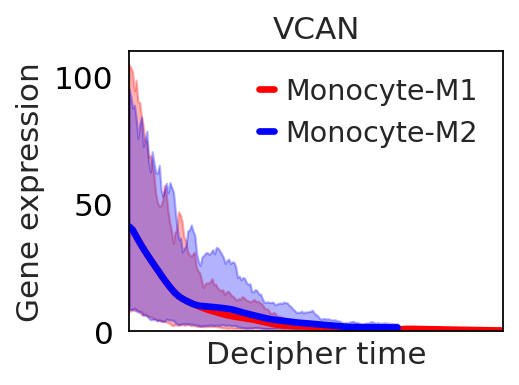

In [41]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['VCAN'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('VCAN');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_vcan.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['MDM2'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('MDM2');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_mdm2.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['FOS'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('FOS');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_fos.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['SOX5'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('SOX5');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_sox5.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['RHOB'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('RHOB');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_rhob.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['INSR'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('INSR');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_insr.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:25,911 | INFO : maxp pruned
2025-04-03 19:09:25,919 | INFO : cmap pruned
2025-04-03 19:09:25,919 | INFO : kern dropped
2025-04-03 19:09:25,920 | INFO : post pruned
2025-04-03 19:09:25,920 | INFO : FFTM dropped
2025-04-03 19:09:25,922 | INFO : GPOS pruned
2025-04-03 19:09:25,926 | INFO : GSUB pruned
2025-04-03 19:09:25,931 | INFO : glyf pruned
2025-04-03 19:09:25,932 | INFO : Added gid0 to subset
2025-04-03 19:09:25,933 | INFO : Added first four glyphs to subset
2025-04-03 19:09:25,933 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2025-04-03 19:09:25,934 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'M', 'O', 'c', 'e', 'five', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:25,935 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 39, 42, 44, 48, 50, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:25,937 | INFO : Closed glyph list over 'G

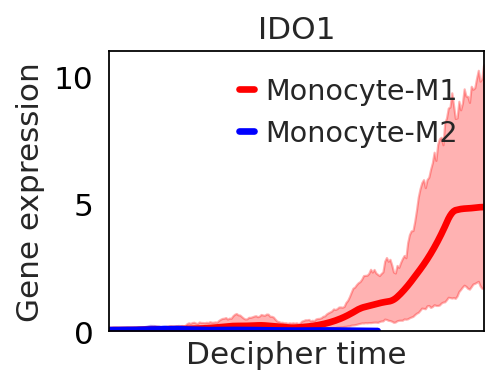

In [42]:
fig = dc.pl.gene_patterns(myeloid_decipher, ['IDO1'], pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
plt.grid(None);
plt.title('IDO1');
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_ido1.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:26,173 | INFO : maxp pruned
2025-04-03 19:09:26,185 | INFO : cmap pruned
2025-04-03 19:09:26,185 | INFO : kern dropped
2025-04-03 19:09:26,186 | INFO : post pruned
2025-04-03 19:09:26,186 | INFO : FFTM dropped
2025-04-03 19:09:26,188 | INFO : GPOS pruned
2025-04-03 19:09:26,192 | INFO : GSUB pruned
2025-04-03 19:09:26,197 | INFO : glyf pruned
2025-04-03 19:09:26,198 | INFO : Added gid0 to subset
2025-04-03 19:09:26,199 | INFO : Added first four glyphs to subset
2025-04-03 19:09:26,199 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-04-03 19:09:26,200 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'M', 'S', 'a', 'c', 'e', 'five', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'u', 'x', 'y', 'zero']
2025-04-03 19:09:26,201 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 39, 42, 48, 54, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
2025-04-03 19:09:26,204 | INFO : Closed 

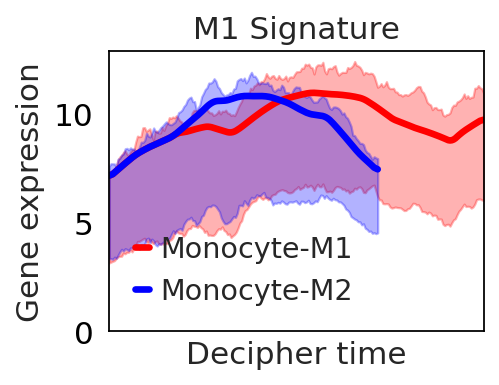

In [43]:
genes = list( set(myeloid_signatures['M1_ada']) & set(myeloid_decipher.var_names))
fig = dc.pl.gene_patterns(myeloid_decipher, genes, pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('M1 Signature')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_m1sig.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:26,443 | INFO : maxp pruned
2025-04-03 19:09:26,455 | INFO : cmap pruned
2025-04-03 19:09:26,456 | INFO : kern dropped
2025-04-03 19:09:26,456 | INFO : post pruned
2025-04-03 19:09:26,457 | INFO : FFTM dropped
2025-04-03 19:09:26,459 | INFO : GPOS pruned
2025-04-03 19:09:26,463 | INFO : GSUB pruned
2025-04-03 19:09:26,469 | INFO : glyf pruned
2025-04-03 19:09:26,470 | INFO : Added gid0 to subset
2025-04-03 19:09:26,471 | INFO : Added first four glyphs to subset
2025-04-03 19:09:26,471 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-04-03 19:09:26,472 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'M', 'S', 'a', 'c', 'e', 'five', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'u', 'x', 'y', 'zero']
2025-04-03 19:09:26,473 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 39, 42, 48, 54, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
2025-04-03 19:09:26,476 | INFO : Closed 

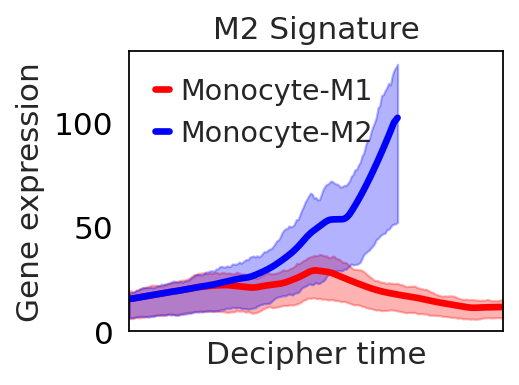

In [44]:
genes = list( set(myeloid_signatures['M2_ada']) & set(myeloid_decipher.var_names))
fig = dc.pl.gene_patterns(myeloid_decipher, genes, pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('M2 Signature')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_m2sig.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:27,218 | INFO : maxp pruned
2025-04-03 19:09:27,227 | INFO : cmap pruned
2025-04-03 19:09:27,228 | INFO : kern dropped
2025-04-03 19:09:27,228 | INFO : post pruned
2025-04-03 19:09:27,229 | INFO : FFTM dropped
2025-04-03 19:09:27,231 | INFO : GPOS pruned
2025-04-03 19:09:27,235 | INFO : GSUB pruned
2025-04-03 19:09:27,241 | INFO : glyf pruned
2025-04-03 19:09:27,242 | INFO : Added gid0 to subset
2025-04-03 19:09:27,243 | INFO : Added first four glyphs to subset
2025-04-03 19:09:27,243 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-04-03 19:09:27,244 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'H', 'M', 'S', 'a', 'c', 'e', 'five', 'g', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'u', 'x', 'y', 'zero']
2025-04-03 19:09:27,246 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 39, 42, 43, 48, 54, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
2025-04-03 19:09:27,249 | INFO 

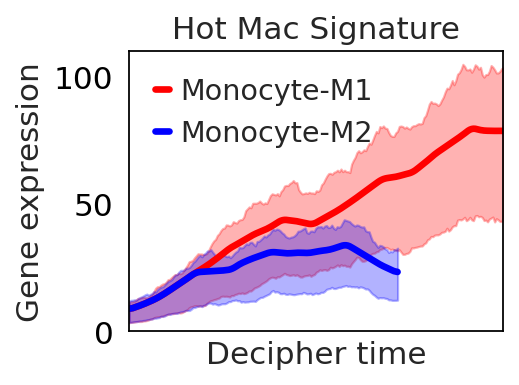

In [ ]:
genes = [
    "AKR1A1", "ALDH1A1", "APOC1", "APOE", "APOL3", "AXL", "B2M", "C1orf54", 
    "C1QA", "C1QB", "C1QC", "C2", "CD38", "CD4", "CD74", "CIITA", "CLIC2", 
    "CMKLR1", "CTSC", "CXCL9", "EBI3", "ENPP2", "EPB41L2", "FAM26F", "FGD2", 
    "GBP4", "GIMAP5", "GM2A", "HAPLN3", "HLA-DMA", "HLA-DMB", "HLA-DOA", 
    "HLA-DPA1", "HLA-DPB1", "HLA-DPB2", "HLA-DQA1", "HLA-DQB1", "HLA-DQB2", 
    "HLA-DRA", "HLA-DRB1", "HLA-DRB5", "LGALS3BP", "LILRB4", "MS4A6A", 
    "NAGK", "NR1H3", "P2RY12", "P2RY6", "PDCD1LG2", "PLA2G2D", "PLEKHO1", 
    "PPA1", "PRDX1", "PSME2", "RARRES3", "SDC3", "SERPING1", "SLAMF7", 
    "SLAMF8", "TIFAB", "TMSB4X", "TRAFD1", "UBD", "VOPP1"
]

genes = list( set(genes) & set(myeloid_decipher.var_names))
fig = dc.pl.gene_patterns(myeloid_decipher, genes, pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('Hot Mac Signature')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_hotmacsig.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
m2_sig = list(pd.read_csv('M2_like_disruption_sig_032125.csv', index_col=0)['0'].values)
m1_sig = list(pd.read_csv('M1_like_disruption_sig_032125.csv', index_col=0)['0'].values)

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, m2_sig, pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('M2-like Disruption Signature')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_m2disrupt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
print(m2_sig)

In [ ]:
fig = dc.pl.gene_patterns(myeloid_decipher, m1_sig, pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('M1-like Disruption Signature')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_m1disrupt.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
print(m1_sig)

2025-04-03 19:13:46,608 | INFO : maxp pruned
2025-04-03 19:13:46,618 | INFO : cmap pruned
2025-04-03 19:13:46,619 | INFO : kern dropped
2025-04-03 19:13:46,620 | INFO : post pruned
2025-04-03 19:13:46,620 | INFO : FFTM dropped
2025-04-03 19:13:46,624 | INFO : GPOS pruned
2025-04-03 19:13:46,627 | INFO : GSUB pruned
2025-04-03 19:13:46,634 | INFO : glyf pruned
2025-04-03 19:13:46,636 | INFO : Added gid0 to subset
2025-04-03 19:13:46,636 | INFO : Added first four glyphs to subset
2025-04-03 19:13:46,637 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 19:13:46,638 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'M', 'c', 'e', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'x', 'y', 'zero']
2025-04-03 19:13:46,640 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 25, 38, 39, 42, 47, 48, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:13:46,643 | INFO : Closed glyph 

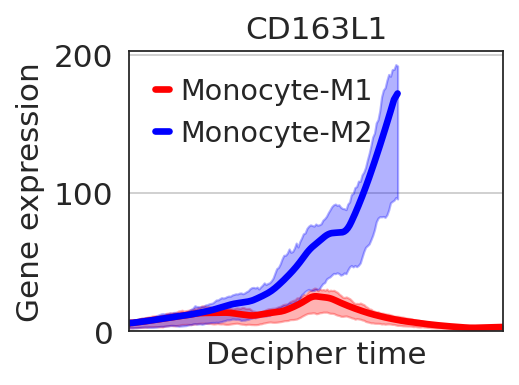

In [61]:
fig = dc.pl.gene_patterns(myeloid_decipher, 'CD163L1', pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('CD163L1')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_cd163l1.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:27,493 | INFO : maxp pruned
2025-04-03 19:09:27,502 | INFO : cmap pruned
2025-04-03 19:09:27,503 | INFO : kern dropped
2025-04-03 19:09:27,503 | INFO : post pruned
2025-04-03 19:09:27,504 | INFO : FFTM dropped
2025-04-03 19:09:27,507 | INFO : GPOS pruned
2025-04-03 19:09:27,511 | INFO : GSUB pruned
2025-04-03 19:09:27,516 | INFO : glyf pruned
2025-04-03 19:09:27,517 | INFO : Added gid0 to subset
2025-04-03 19:09:27,518 | INFO : Added first four glyphs to subset
2025-04-03 19:09:27,518 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 19:09:27,519 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'M', 'N', 'T', 'c', 'e', 'four', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:27,520 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 23, 39, 41, 42, 48, 49, 55, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:27,523 | INFO : Closed glyph lis

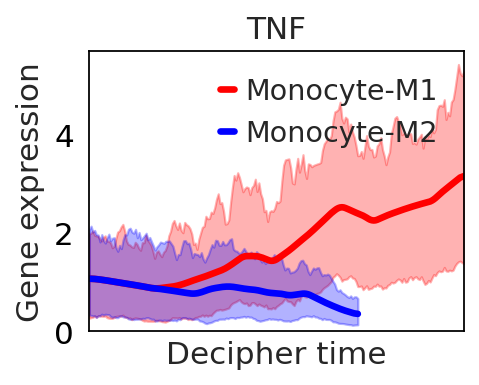

In [46]:
fig = dc.pl.gene_patterns(myeloid_decipher, 'TNF', pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('TNF')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_tnf.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:27,788 | INFO : maxp pruned
2025-04-03 19:09:27,797 | INFO : cmap pruned
2025-04-03 19:09:27,798 | INFO : kern dropped
2025-04-03 19:09:27,799 | INFO : post pruned
2025-04-03 19:09:27,800 | INFO : FFTM dropped
2025-04-03 19:09:27,802 | INFO : GPOS pruned
2025-04-03 19:09:27,805 | INFO : GSUB pruned
2025-04-03 19:09:27,812 | INFO : glyf pruned
2025-04-03 19:09:27,813 | INFO : Added gid0 to subset
2025-04-03 19:09:27,814 | INFO : Added first four glyphs to subset
2025-04-03 19:09:27,815 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2025-04-03 19:09:27,815 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'M', 'c', 'e', 'eight', 'five', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:27,816 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 24, 27, 38, 39, 42, 48, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:27,820 | INFO : Closed glyph list ove

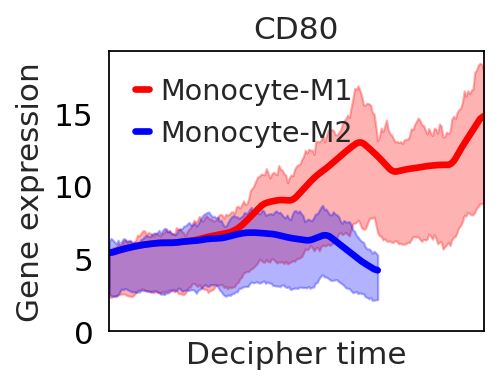

In [47]:
fig = dc.pl.gene_patterns(myeloid_decipher, 'CD80', pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('CD80')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_cd80.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:28,074 | INFO : maxp pruned
2025-04-03 19:09:28,083 | INFO : cmap pruned
2025-04-03 19:09:28,084 | INFO : kern dropped
2025-04-03 19:09:28,085 | INFO : post pruned
2025-04-03 19:09:28,085 | INFO : FFTM dropped
2025-04-03 19:09:28,088 | INFO : GPOS pruned
2025-04-03 19:09:28,091 | INFO : GSUB pruned
2025-04-03 19:09:28,098 | INFO : glyf pruned
2025-04-03 19:09:28,099 | INFO : Added gid0 to subset
2025-04-03 19:09:28,100 | INFO : Added first four glyphs to subset
2025-04-03 19:09:28,100 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 19:09:28,101 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'I', 'M', 'N', 'c', 'e', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:28,102 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 39, 41, 42, 44, 48, 49, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:28,106 | INFO : Closed glyph l

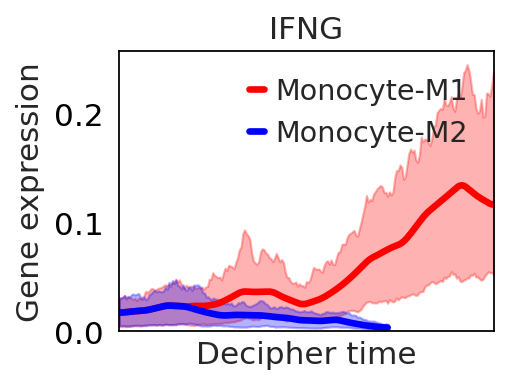

In [48]:
fig = dc.pl.gene_patterns(myeloid_decipher, 'IFNG', pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('IFNG')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_ifng.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

2025-04-03 19:09:28,373 | INFO : maxp pruned
2025-04-03 19:09:28,383 | INFO : cmap pruned
2025-04-03 19:09:28,383 | INFO : kern dropped
2025-04-03 19:09:28,384 | INFO : post pruned
2025-04-03 19:09:28,385 | INFO : FFTM dropped
2025-04-03 19:09:28,387 | INFO : GPOS pruned
2025-04-03 19:09:28,390 | INFO : GSUB pruned
2025-04-03 19:09:28,398 | INFO : glyf pruned
2025-04-03 19:09:28,399 | INFO : Added gid0 to subset
2025-04-03 19:09:28,400 | INFO : Added first four glyphs to subset
2025-04-03 19:09:28,400 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-04-03 19:09:28,401 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'I', 'M', 'c', 'e', 'four', 'h', 'hyphen', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'x', 'y', 'zero']
2025-04-03 19:09:28,402 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 23, 25, 39, 41, 42, 44, 48, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 91, 92]
2025-04-03 19:09:28,406 | INFO : Closed glyph l

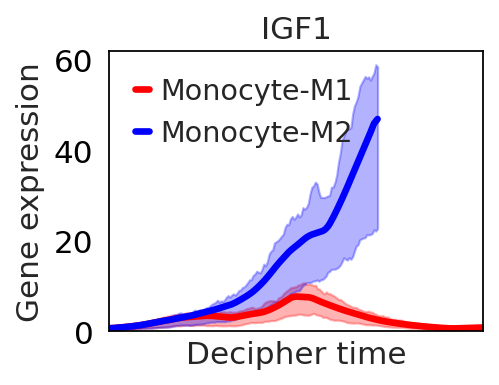

In [49]:
fig = dc.pl.gene_patterns(myeloid_decipher, 'IGF1', pattern_names=['Monocyte-M1','Monocyte-M2'], palette = myeloid_cell_type_palette);
fig.axes[0].set_title('IGF1')
plt.grid(None);
fig.savefig('fig/5- Immune Myeloid B Cells/decipher_myeloid_igf1.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S7F- disruption score heatmap

In [36]:
disruption_score_df = myeloid_decipher.var[[c for c in myeloid_decipher.var if "decipher_disruption" in c]]

In [37]:
# calculate signed disruption (M2 vs. M1, at end of M1 trajectory)
genes = myeloid_decipher.var_names
end_time_i = np.argmax(myeloid_decipher.uns['decipher']['gene_patterns']['Monocyte-M2']['times'])
m2 = myeloid_decipher.uns['decipher']['gene_patterns']['Monocyte-M2']['mean'][end_time_i]
m1 = myeloid_decipher.uns['decipher']['gene_patterns']['Monocyte-M1']['mean'][end_time_i]
gene_differences = pd.DataFrame(index = genes)
gene_differences['M2'] = m2
gene_differences['M1'] = m1
gene_differences['difference'] = gene_differences['M2'] - gene_differences['M1']
gene_differences['difference_sign'] = np.sign(gene_differences['difference'])
gene_differences = gene_differences.loc[disruption_score_df.index,:]

In [38]:
disruption_score_df['sign (M2-M1)'] = gene_differences['difference_sign']
disruption_score_df['M2_v_M1'] = disruption_score_df['sign (M2-M1)'].replace({
    -1.0:'M1 > M2',
    1.0 :'M2 > M1'
})
disruption_score_df.head()

,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined,sign (M2-M1),M2_v_M1
VWA1,0.243131,0.248983,5.663504,1.0,M2 > M1
PRDM16,0.016466,0.013403,0.970491,-1.0,M1 > M2
AJAP1,0.835580,1.371189,8.067063,1.0,M2 > M1
ERRFI1,0.127284,0.173607,4.013866,1.0,M2 > M1
GPR157,0.199596,0.263963,4.951558,-1.0,M1 > M2


In [39]:
# choose only M2 upregulated genes, and visualize top 100
M2_upregulated = disruption_score_df.loc[disruption_score_df['M2_v_M1'] == 'M2 > M1',:]
M2_upregulated.sort_values('decipher_disruption_shape', ascending=False, inplace=True) # sort by shape
# M2_upregulated.sort_values('decipher_disruption_combined', ascending=False, inplace=True) # sort by combined (shape and scale)

In [40]:
# choose only M1 upregulated genes, and visualize top 100
M1_upregulated = disruption_score_df.loc[disruption_score_df['M2_v_M1'] == 'M1 > M2',:]
M1_upregulated.sort_values('decipher_disruption_shape', ascending=False, inplace=True) # sort by shape
# M1_upregulated.sort_values('decipher_disruption_combined', ascending=False, inplace=True) # sort by combined  (shape and scale)

In [ ]:
use = list( set(myeloid_signatures['M2_ada']) & set(myeloid_decipher.var_names) & set(M2_upregulated.index))
M2_upregulated.loc[use,:]

,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined,sign (M2-M1),M2_v_M1
CD163,0.369692,0.703732,2.094390,1.0,M2 > M1
SLC40A1,0.507318,1.137029,2.825608,1.0,M2 > M1
MRC1,0.530433,0.953080,2.537169,1.0,M2 > M1
CCL13,0.455856,0.644856,2.985266,1.0,M2 > M1
IL10,0.074859,0.073125,0.334067,1.0,M2 > M1
RNASE1,0.388799,0.316424,3.060652,1.0,M2 > M1
F13A1,0.789022,2.232407,4.695077,1.0,M2 > M1
IQGAP2,0.160932,0.214320,0.832702,1.0,M2 > M1
SELENOP,0.614569,1.334080,2.870249,1.0,M2 > M1
CD163L1,0.861365,1.870242,4.315191,1.0,M2 > M1


In [42]:
# CD80, CD86, cytokines such as TNFa, MHC class II (e.g. HLA-DP, HLA-DM, HLA-DOA, HLA-DOB, HLA-DQ, and HLA-DR)
use = ['CD80', 'TNF', 'HLA-DOB', 'IFNG']
# use = list( set(myeloid_signatures['M1_ada']) & set(myeloid_decipher.var_names) & set(M1_upregulated.index))
M1_upregulated.loc[use,:]

,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined,sign (M2-M1),M2_v_M1
CD80,0.310333,0.370504,1.474475,-1.0,M1 > M2
TNF,0.475880,0.714403,2.662010,-1.0,M1 > M2
HLA-DOB,0.165485,0.145072,0.858592,-1.0,M1 > M2
IFNG,0.664863,1.212746,10.188328,-1.0,M1 > M2


In [43]:
print(M1_upregulated.shape)
print(M2_upregulated.shape)

(922, 5)
(1105, 5)


In [44]:
# limit to top 100
M2_upregulated = M2_upregulated.iloc[:100,:]
M1_upregulated = M1_upregulated.iloc[:100,:]

In [ ]:
# heatmap of disruption score
heatmap = pd.concat([M1_upregulated,M2_upregulated], axis=0)
heatmap['disruption_shape'] = heatmap['decipher_disruption_shape'] * -1 * heatmap['sign (M2-M1)']
heatmap['disruption_combined'] = heatmap['decipher_disruption_combined'] * -1 * heatmap['sign (M2-M1)']
heatmap['gene'] = heatmap.index
heatmap['color'] = 'grey'
heatmap.loc[heatmap['gene'].isin([
    "AKR1A1", "ALDH1A1", "APOC1", "APOE", "APOL3", "AXL", "B2M", "C1orf54", 
    "C1QA", "C1QB", "C1QC", "C2", "CD38", "CD4", "CD74", "CIITA", "CLIC2", 
    "CMKLR1", "CTSC", "CXCL9", "EBI3", "ENPP2", "EPB41L2", "FAM26F", "FGD2", 
    "GBP4", "GIMAP5", "GM2A", "HAPLN3", "HLA-DMA", "HLA-DMB", "HLA-DOA", 
    "HLA-DPA1", "HLA-DPB1", "HLA-DPB2", "HLA-DQA1", "HLA-DQB1", "HLA-DQB2", 
    "HLA-DRA", "HLA-DRB1", "HLA-DRB5", "LGALS3BP", "LILRB4", "MS4A6A", 
    "NAGK", "NR1H3", "P2RY12", "P2RY6", "PDCD1LG2", "PLA2G2D", "PLEKHO1", 
    "PPA1", "PRDX1", "PSME2", "RARRES3", "SDC3", "SERPING1", "SLAMF7", 
    "SLAMF8", "TIFAB", "TMSB4X", "TRAFD1", "UBD", "VOPP1"
]),'color'] = 'green' # hot macrophage signature
heatmap.loc[heatmap['gene'].isin(myeloid_signatures['M1_ada']),'color'] = 'red'
heatmap.loc[heatmap['gene'].isin(myeloid_signatures['M2_ada']),'color'] = 'blue'
heatmap = heatmap.sort_values('disruption_shape', ascending=False)

2025-06-05 21:03:03,518 | INFO : maxp pruned
2025-06-05 21:03:03,527 | INFO : cmap pruned
2025-06-05 21:03:03,528 | INFO : kern dropped
2025-06-05 21:03:03,528 | INFO : post pruned
2025-06-05 21:03:03,528 | INFO : FFTM dropped
2025-06-05 21:03:03,531 | INFO : GPOS pruned
2025-06-05 21:03:03,534 | INFO : GSUB pruned
2025-06-05 21:03:03,538 | INFO : glyf pruned
2025-06-05 21:03:03,539 | INFO : Added gid0 to subset
2025-06-05 21:03:03,539 | INFO : Added first four glyphs to subset
2025-06-05 21:03:03,539 | INFO : Closing glyph list over 'GSUB': 54 glyphs before
2025-06-05 21:03:03,540 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'c', 'e', 'eight', 'five', 'four', 'greater', 'h', 'hyphen', 'i', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
2025-06-05 21:03:03,541 | INFO : Glyph IDs:

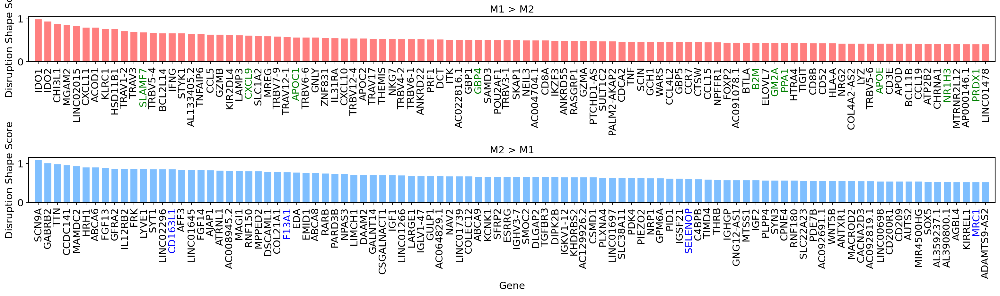

In [76]:
# Split data into M1>M2 and M2>M1
m1_data = heatmap[heatmap['M2_v_M1'] == 'M1 > M2']
m2_data = heatmap[heatmap['M2_v_M1'] == 'M2 > M1']

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,6))

# Remove inner lines but keep axis lines and ticks
ax1.yaxis.grid(False)
ax1.xaxis.grid(False)
ax2.yaxis.grid(False) 
ax2.xaxis.grid(False)

# Create color maps for x-axis labels
label_colors_m1 = m1_data['color'].map({'grey': 'black', 'red': 'red', 'blue': 'blue', 'green': 'green'})
label_colors_m2 = m2_data['color'].map({'grey': 'black', 'red': 'red', 'blue': 'blue', 'green': 'green'})

# Plot M1>M2 data
ax1.bar(range(len(m1_data)), m1_data['decipher_disruption_shape'], color='#ff7f7f')
ax1.set_xticks(range(len(m1_data)))
ax1.set_xticklabels(m1_data['gene'], rotation=90, ha='center', va='top')
for i, tick in enumerate(ax1.get_xticklabels()):
    tick.set_color(label_colors_m1.iloc[i])
ax1.set_title('M1 > M2')
ax1.set_ylabel('Disruption Shape Score')
ax1.set_xlim(-1.0, len(m1_data))

# Plot M2>M1 data  
ax2.bar(range(len(m2_data)), m2_data['decipher_disruption_shape'], color='#7fbfff')
ax2.set_xticks(range(len(m2_data)))
ax2.set_xticklabels(m2_data['gene'], rotation=90, ha='center', va='top')
for i, tick in enumerate(ax2.get_xticklabels()):
    tick.set_color(label_colors_m2.iloc[i])
ax2.set_title('M2 > M1')
ax2.set_xlabel('Gene')
ax2.set_ylabel('Disruption Shape Score')
ax2.set_xlim(-1.0, len(m2_data))

# Adjust layout
plt.tight_layout()

plt.savefig('fig/S5- Immune T Cells Myeloid B Cells/myeloid_disruption_score_barplot.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')


# Sample-level T cell fraction vs. immunogenic macrophage signature correlation

## calculate TCFs

In [41]:
# just need metadata
obs = sc.read_h5ad('unprocessed/data_melanoma_integrated_RPCA_v4.h5ad').obs
# obs = sc.read_h5ad('data_melanoma_merged_v2.h5ad').obs

In [44]:
tcf = {}
cd8cf = {}
cd4cf = {}
for sample in obs['sample'].unique():
    pt = obs.loc[obs['sample']==sample]
    t_frac = np.sum(pt['cell_type_fine'].isin(
        ['Cycling cells','CD4+ T cells','Tregs','Naive CD8+ T cells',
         'CD8+ T cells','Naive CD4+ T cells','Naive Tregs']
    )) / pt.shape[0]
    cd8_frac = np.sum(pt['cell_type_fine'].isin(
        ['Naive CD8+ T cells','CD8+ T cells']
    )) / pt.shape[0]
    cd4_frac = np.sum(pt['cell_type_fine'].isin(
        ['CD4+ T cells','Tregs','Naive CD4+ T cells','Naive Tregs']
    )) / pt.shape[0]
    
    tcf[sample] = t_frac
    cd8cf[sample] = cd8_frac
    cd4cf[sample] = cd4_frac

In [45]:
obs['t_cell_fraction'] = obs['sample'].replace(tcf).astype('float64')
obs['cd8t_cell_fraction'] = obs['sample'].replace(cd8cf).astype('float64')
obs['cd4t_cell_fraction'] = obs['sample'].replace(cd4cf).astype('float64')

In [ ]:
obs.to_csv('unprocessed/data_melanoma_integrated_RPCA_v4.csv')

## Figure 7A- CD8+ T cell fraction vs. immunogenic macrophage signature (Jerby-Arnon et al)

In [48]:
obs = pd.read_csv('unprocessed/data_melanoma_integrated_RPCA_v4.csv')
obs = obs.groupby('sample')[['t_cell_fraction', 'cd8t_cell_fraction', 'cd4t_cell_fraction']].mean().reset_index()
obs.index = obs['sample']
obs.head()

,sample,t_cell_fraction,cd8t_cell_fraction,cd4t_cell_fraction
sample,,,,
F01_on,F01_on,0.019396,0.005758,0.012021
F01_pre,F01_pre,0.217941,0.106914,0.107067
F02_on,F02_on,0.006086,0.000982,0.004711
F02_pre,F02_pre,0.003514,0.001474,0.001927
F03_post1_on2,F03_post1_on2,0.024044,0.008015,0.010018


In [49]:
# myeloid_obs = sc.read_h5ad('data_melanoma_myeloid_pt2_reint.h5ad').obs
myeloid_obs = myeloid.obs.copy()

In [50]:
myeloid_obs['t_cell_fraction'] = myeloid_obs['sample'].replace(obs['t_cell_fraction']).astype('float64')
myeloid_obs['cd8t_cell_fraction'] = myeloid_obs['sample'].replace(obs['cd8t_cell_fraction']).astype('float64')
myeloid_obs['cd4t_cell_fraction'] = myeloid_obs['sample'].replace(obs['cd4t_cell_fraction']).astype('float64')

In [ ]:
myeloid_obs = myeloid_obs[myeloid_obs['cell_type_fine'].isin(
    ['Antigen-presenting Macrophages','Phagocytic Macrophage',
     'M1-like Macrophage','M2-like Macrophage',]
)]

In [52]:
nr = list(myeloid_obs[myeloid_obs['responder'] == 'Non-responder']['sample'].unique())
r = list(myeloid_obs[myeloid_obs['responder'] == 'Responder']['sample'].unique())
notx = list(myeloid_obs[myeloid_obs['treated'] == 'Untreated']['sample'].unique())
tx = list(myeloid_obs[myeloid_obs['treated'] == 'Treated']['sample'].unique())

In [53]:
df = myeloid_obs.groupby('sample')[['jerby_mac_in_cold_tumors_down1', 't_cell_fraction', 'cd8t_cell_fraction','cd4t_cell_fraction']].mean().reset_index()
df['responder'] = 'Responder'
df.loc[df['sample'].isin(nr),'responder'] = 'Non-responder'
df['treated'] = 'Treated'
df.loc[df['sample'].isin(notx),'treated'] = 'Untreated'

In [54]:
from scipy.stats import linregress

R-squared for responder group 'Responder': 0.7722
R-squared for responder group 'Non-responder': 0.0106


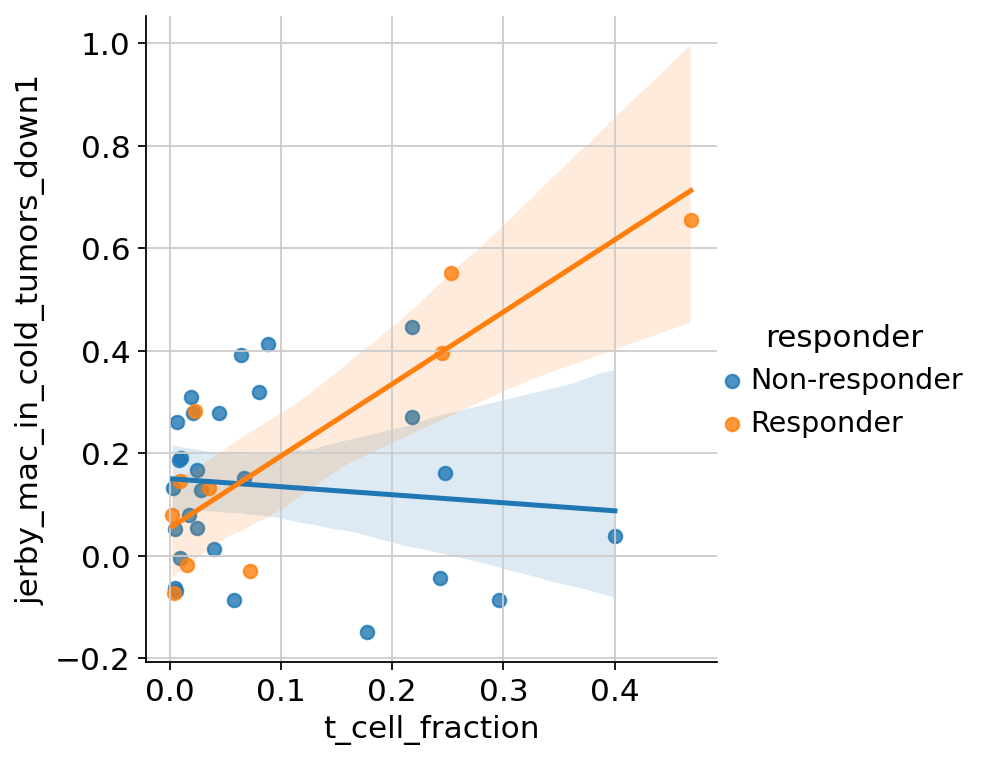

In [55]:
r_squared_values = {}
for group in ['Responder','Non-responder']:
    group_data = df[df['responder'] == group]
    slope, intercept, r_value, p_value, std_err = linregress(
        group_data['jerby_mac_in_cold_tumors_down1'], group_data['t_cell_fraction']
    )
    r_squared_values[group] = r_value**2
    print(f"R-squared for responder group '{group}': {r_value**2:.4f}")

sns.lmplot(df, x='t_cell_fraction', y='jerby_mac_in_cold_tumors_down1', hue='responder')

R-squared for responder group 'Responder': 0.3949
R-squared for responder group 'Non-responder': 0.0567


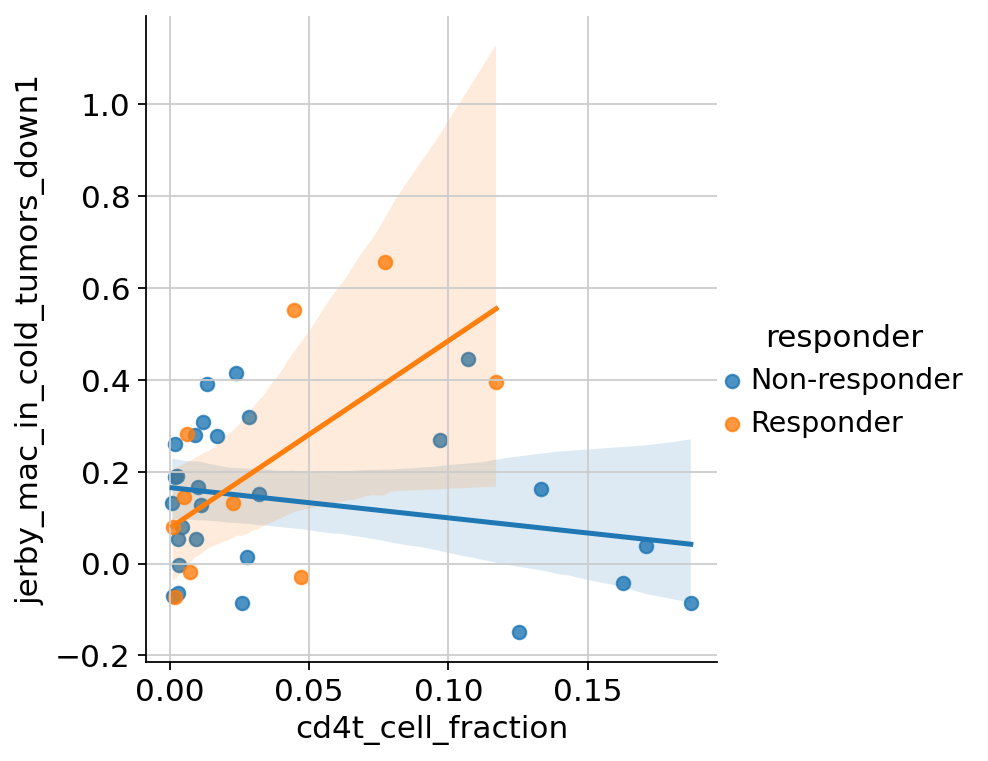

In [56]:
for group in ['Responder','Non-responder']:
    group_data = df[df['responder'] == group]
    slope, intercept, r_value, p_value, std_err = linregress(
        group_data['jerby_mac_in_cold_tumors_down1'], group_data['cd4t_cell_fraction']
    )
    r_squared_values[group] = r_value**2
    print(f"R-squared for responder group '{group}': {r_value**2:.4f}")

sns.lmplot(df, x='cd4t_cell_fraction', y='jerby_mac_in_cold_tumors_down1', hue='responder')

R-squared for responder group 'Responder': 0.7636
P-val for responder group 'Responder': 0.0000
R-squared for responder group 'Non-responder': 0.0041
P-val for responder group 'Non-responder': 0.5588


2025-03-24 19:23:10,357 | INFO : maxp pruned
2025-03-24 19:23:10,364 | INFO : cmap pruned
2025-03-24 19:23:10,365 | INFO : kern dropped
2025-03-24 19:23:10,365 | INFO : post pruned
2025-03-24 19:23:10,365 | INFO : FFTM dropped
2025-03-24 19:23:10,367 | INFO : GPOS pruned
2025-03-24 19:23:10,372 | INFO : GSUB pruned
2025-03-24 19:23:10,375 | INFO : glyf pruned
2025-03-24 19:23:10,376 | INFO : Added gid0 to subset
2025-03-24 19:23:10,377 | INFO : Added first four glyphs to subset
2025-03-24 19:23:10,377 | INFO : Closing glyph list over 'GSUB': 36 glyphs before
2025-03-24 19:23:10,377 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'hyphen', 'i', 'j', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'w', 'y', 'zero']
2025-03-24 19:23:10,378 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 25, 27, 49, 53, 66, 68, 69, 70, 71, 72, 73, 76, 7

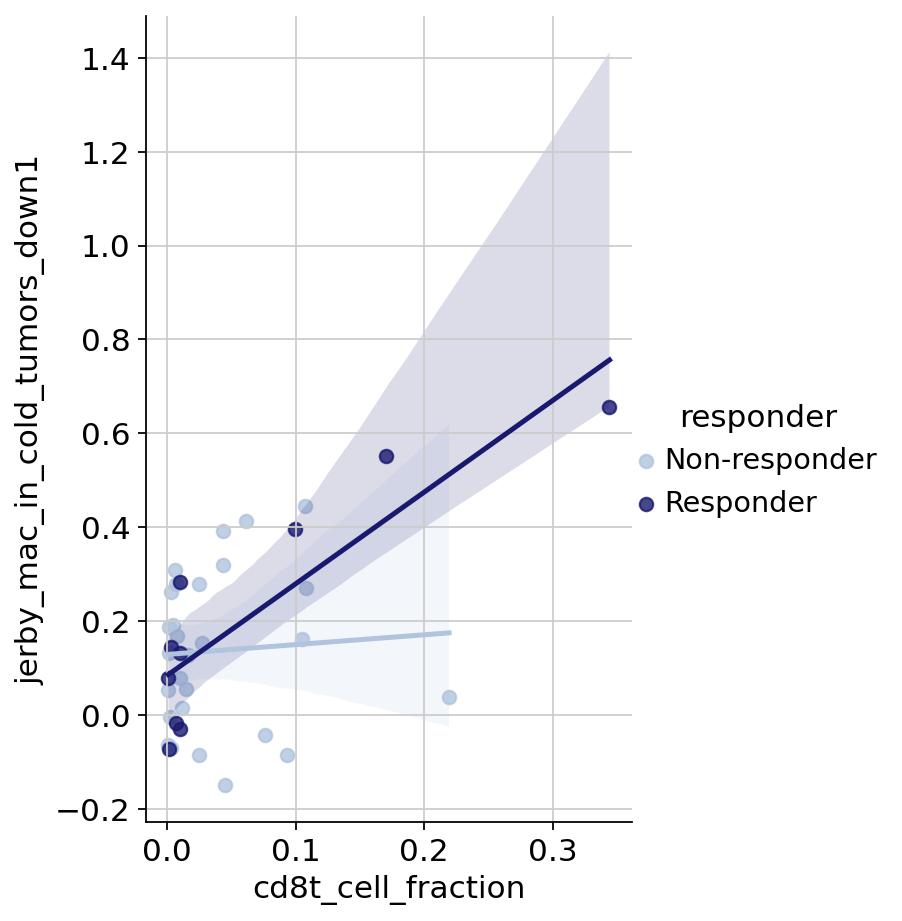

In [57]:
for group in ['Responder','Non-responder']:
    group_data = df[df['responder'] == group]
    slope, intercept, r_value, p_value, std_err = linregress(
        group_data['jerby_mac_in_cold_tumors_down1'], group_data['cd8t_cell_fraction']
    )
    r_squared_values[group] = r_value**2
    print(f"R-squared for responder group '{group}': {r_value**2:.4f}")
    print(f"P-val for responder group '{group}': {p_value**2:.4f}")

lmplot = sns.lmplot(df, x='cd8t_cell_fraction', y='jerby_mac_in_cold_tumors_down1', hue='responder',
                    palette=clinical_variable_palette, height=6, aspect=.75)
lmplot.savefig('fig/6- Cell Interactions/cd8_tcf_v_hot_mac_sig.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

# External cohort validation of T cell phenotypic shifts

### modify and reorder labels

In [25]:
sc.settings.figdir = 'fig/4- Immune T Cells'
sc.set_figure_params(figsize = (6.5,6), dpi_save = 300, format = 'pdf', transparent = True, vector_friendly=False)

In [ ]:
# label with days to/from ICI start
KUL_CUIMC_cd8_diffmap.obs.loc[KUL_CUIMC_cd8_diffmap.obs['sample'].isin(['B14_on', 'B15_on', 'B16_on1', 'B16_on2', 'B16_on3', 'B17_on', 'B18_on', 'B19_on', 'B20_on', 'B21_on', 'B22_on', 'B23_on', 'B26_on', 'B28_on', 'B32_on', 'B33_on', 'B34_on', 'B36_on', 'B37_on', 'B38_on', 'B41_on']),'days_to/from_ICI_start'] = 21 # clinical design is 2-3 weeks but clinical information doesn't distinguish
KUL_CUIMC_cd8_diffmap.obs.loc[KUL_CUIMC_cd8_diffmap.obs['sample'].isin(['B14_pre', 'B15_pre', 'B16_pre1', 'B16_pre2', 'B17_pre', 'B18_pre', 'B19_pre', 'B20_pre', 'B21_pre', 'B22_pre', 'B23_pre', 'B25_pre', 'B26_pre', 'B28_pre', 'B29_pre', 'B30_pre', 'B32_pre', 'B33_pre', 'B34_pre', 'B36_pre', 'B37_pre', 'B38_pre', 'B41_pre']),'days_to/from_ICI_start'] = 0

In [28]:
components = '2,3' # '2,3' '3,4'
dimensions = (3,1,2) # (1,2,3) # (2,3,4)
# ['GZMA','GZMB','GZMH','PRF1']

In [29]:
KUL_CUIMC_cd8_diffmap.obs['sum_exhaustion_genes'] =\
np.sum(KUL_CUIMC_cd8_diffmap[:,tcell_marker_genes['exhaustion_markers']].layers['normalized_counts'],axis=1)
print(tcell_marker_genes['exhaustion_markers'])

['PDCD1', 'KLRG1', 'TIGIT', 'HAVCR2', 'LAG3', 'CTLA4']


## Figure 5G- Integrated DC map colored by cohort and TCF7, TOX, exhaustion gene expression

In [57]:
sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
              color='TCF7', layer='normalized_counts', vmin=0,vmax='p95',s=20, save = '_KUL_CUIMC_tcf7.pdf', show=False)
sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
              color='TOX', layer='normalized_counts', vmin=0,vmax='p95',s=20, save = '_KUL_CUIMC_tox.pdf', show=False)
sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
              color='sum_exhaustion_genes', vmin=0,vmax='p95',s=20, save = '_KUL_CUIMC_exhaust.pdf', show=False)
sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
              color='dpt_pseudotime',s=20, save = '_KUL_CUIMC_dpt.pdf', show=False)

<Axes: title={'center': 'dpt_pseudotime'}, xlabel='DC2', ylabel='DC3'>

In [52]:
sc.set_figure_params(figsize = (6,6), dpi_save = 300, format = 'pdf', transparent = True, vector_friendly=False)
sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components, color='batch', s=20, save = '_KUL_CUIMC.pdf', show=False,
             palette = {'KUL': '#da121aff', 'CUIMC': '#003373'})

2025-01-30 00:24:52,537 | INFO : maxp pruned
2025-01-30 00:24:52,545 | INFO : cmap pruned
2025-01-30 00:24:52,546 | INFO : kern dropped
2025-01-30 00:24:52,546 | INFO : post pruned
2025-01-30 00:24:52,546 | INFO : FFTM dropped
2025-01-30 00:24:52,549 | INFO : GPOS pruned
2025-01-30 00:24:52,552 | INFO : GSUB pruned
2025-01-30 00:24:52,557 | INFO : glyf pruned
2025-01-30 00:24:52,558 | INFO : Added gid0 to subset
2025-01-30 00:24:52,558 | INFO : Added first four glyphs to subset
2025-01-30 00:24:52,558 | INFO : Closing glyph list over 'GSUB': 18 glyphs before
2025-01-30 00:24:52,559 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'L', 'M', 'U', 'a', 'b', 'c', 'h', 'nonmarkingreturn', 'space', 't', 'three', 'two']
2025-01-30 00:24:52,560 | INFO : Glyph IDs:   [0, 1, 2, 3, 21, 22, 38, 39, 44, 46, 47, 48, 56, 68, 69, 70, 75, 87]
2025-01-30 00:24:52,561 | INFO : Closed glyph list over 'GSUB': 18 glyphs after
2025-01-30 00:24:52,561 | INFO : Glyph names: ['.notdef', '.null', '

<Axes: title={'center': 'batch'}, xlabel='DC2', ylabel='DC3'>

In [62]:
# KUL_CUIMC_cd8_diffmap.obs['sum_effector_genes'] =\
# np.sum(KUL_CUIMC_cd8_diffmap[:,['GZMA','GZMB','GZMH','PRF1']].layers['normalized_counts'],axis=1)
# sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
#               color='sum_effector_genes', vmin=0,vmax='p95',s=20, save = '_KUL_CUIMC_old_effector.pdf', show=False)
# sc.pl.diffmap(KUL_CUIMC_cd8_diffmap, components=components,
#               color='sum_exhaustion_genes', vmin=0,vmax='p95',s=20, save = '_KUL_CUIMC_old_exhaust.pdf', show=False)

<Axes: title={'center': 'sum_exhaustion_genes'}, xlabel='DC2', ylabel='DC3'>

## Figure 5H- CD8+ T cells projected on DC2 axis colored by shared clinical covariates

2025-02-27 20:17:01,613 | INFO : maxp pruned
2025-02-27 20:17:01,623 | INFO : cmap pruned
2025-02-27 20:17:01,624 | INFO : kern dropped
2025-02-27 20:17:01,625 | INFO : post pruned
2025-02-27 20:17:01,625 | INFO : FFTM dropped
2025-02-27 20:17:01,627 | INFO : GPOS pruned
2025-02-27 20:17:01,631 | INFO : GSUB pruned
2025-02-27 20:17:01,968 | INFO : glyf pruned
2025-02-27 20:17:01,969 | INFO : Added gid0 to subset
2025-02-27 20:17:01,969 | INFO : Added first four glyphs to subset
2025-02-27 20:17:01,970 | INFO : Closing glyph list over 'GSUB': 7 glyphs before
2025-02-27 20:17:01,970 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'nonmarkingreturn', 'space', 'two']
2025-02-27 20:17:01,971 | INFO : Glyph IDs:   [0, 1, 2, 3, 21, 38, 39]
2025-02-27 20:17:01,973 | INFO : Closed glyph list over 'GSUB': 7 glyphs after
2025-02-27 20:17:01,973 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'nonmarkingreturn', 'space', 'two']
2025-02-27 20:17:01,974 | INFO : Glyph IDs:   [0, 1, 2, 3, 2

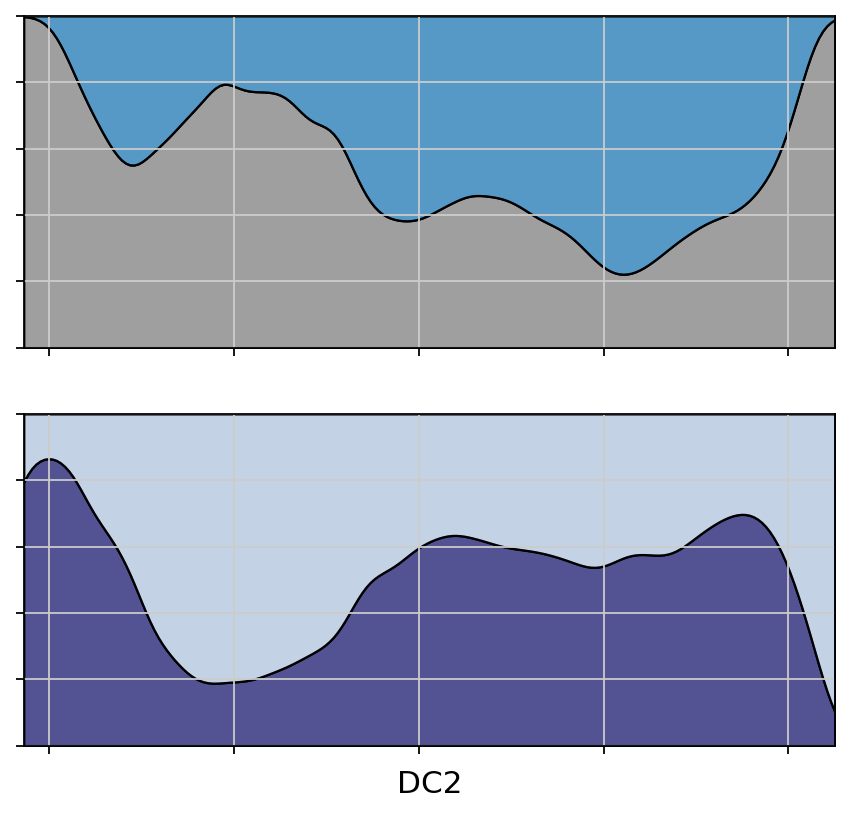

In [30]:
x = 'DC2'
hue = 'treated' # 'treated' or 'responder'
fig, (ax1,ax2) = plt.subplots(2,1,sharex='col')
sns.kdeplot(KUL_CUIMC_cd8_diffmap.obs, x = x, hue = 'treated', multiple='fill', ax=ax1, legend=False, palette = clinical_variable_palette)
sns.kdeplot(KUL_CUIMC_cd8_diffmap.obs, x = x, hue = 'responder', multiple='fill', ax=ax2, legend=False, palette = clinical_variable_palette)
ax1.set(ylabel=None); ax2.set(ylabel=None)
ax1.set(xticklabels=[], yticklabels=[], xlabel=None, ylabel=None);
ax2.set(xticklabels=[], yticklabels=[], ylabel=None);

fig.savefig('fig/4- Immune T Cells/diffmap_KUL_CUIMC_tx_R.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

### statistical tests

In [33]:
df = KUL_CUIMC_cd8_diffmap.obs.copy()

In [31]:
# wasserstein test for p-val for R/NR and Treated/Untreated plots
from scipy.stats import wasserstein_distance

def permutation_test_wasserstein(data1, data2, n_permutations=1000, random_seed=0):
    """
    Perform a permutation test using the Wasserstein distance.

    Parameters:
        data1 (array-like): First dataset.
        data2 (array-like): Second dataset.
        n_permutations (int): Number of permutations.
        random_seed (int or None): Random seed for reproducibility.

    Returns:
        dict: Wasserstein distance, p-value, and distribution of permuted distances.
    """
    if random_seed is not None:
        np.random.seed(random_seed)
    
    original_distance = wasserstein_distance(data1, data2)
    
    combined = np.concatenate([data1, data2])
    n1 = len(data1)
    
    permuted_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        permuted_data1 = combined[:n1]
        permuted_data2 = combined[n1:]
        distance = wasserstein_distance(permuted_data1, permuted_data2)
        permuted_distances.append(distance)
    
    p_value = np.mean(np.array(permuted_distances) >= original_distance)
    
    return {
        'original_distance': original_distance,
        'p_value': p_value,
        'permuted_distances': permuted_distances
    }

In [34]:
result = permutation_test_wasserstein(
    df.loc[df['responder']=='Responder','DC2'], 
    df.loc[df['responder']=='Non-responder','DC2'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for R vs. NR:', result['p_value'])

result = permutation_test_wasserstein(
    df.loc[df['treated']=='Treated','DC2'], 
    df.loc[df['treated']=='Untreated','DC2'], 
    n_permutations=10000, random_seed=0)
print('wasserstein permutation test results for Tx vs. Untx:', result['p_value'])

wasserstein permutation test results for R vs. NR: 0.0
wasserstein permutation test results for Tx vs. Untx: 0.0


## Figure S6I- Removal of unintegrated KUL-specific cluster

See KUL_cohort_validation for additional details

In [88]:
sc.pl.umap(KUL_CUIMC_cd8_diffmap, color='batch', s=20, save = '_KUL_CUIMC_batches.pdf', show=False)

<Axes: title={'center': 'batch'}, xlabel='UMAP1', ylabel='UMAP2'>

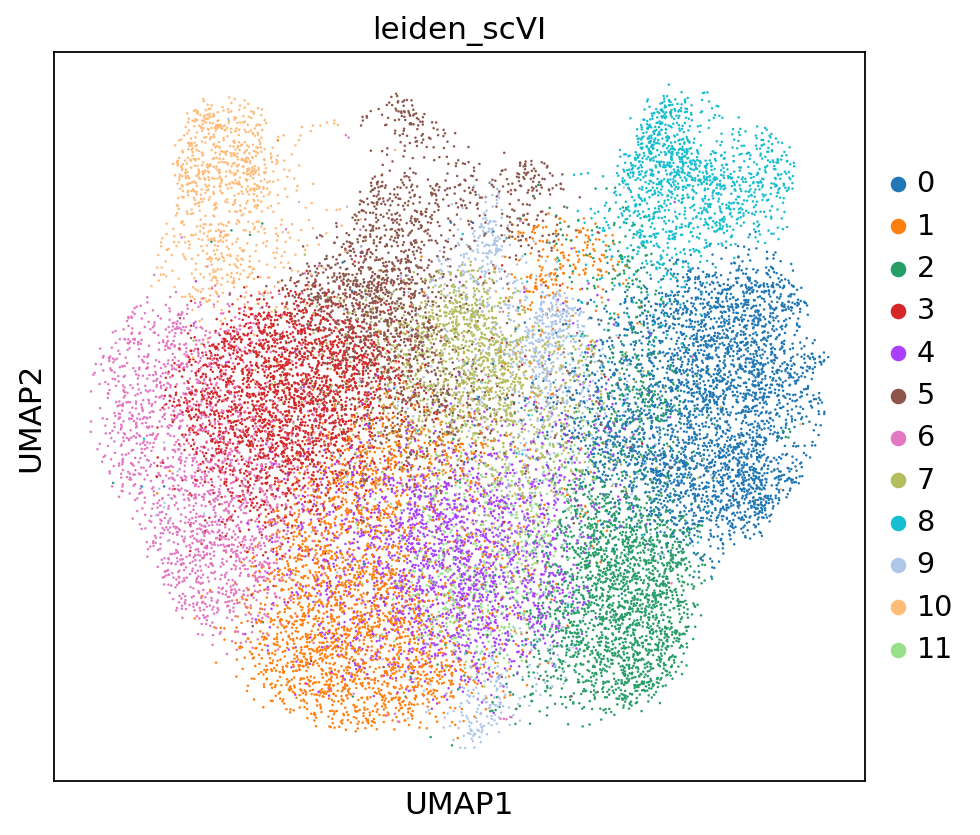

In [ ]:
np.random.seed(0)
sc.tl.leiden(KUL_CUIMC_cd8_diffmap, key_added="leiden_scVI", resolution=1.0)
sc.pl.umap(KUL_CUIMC_cd8_diffmap, color='leiden_scVI')

In [93]:
sc.pl.umap(KUL_CUIMC_cd8_diffmap, color='leiden_scVI', s=20, save = '_KUL_CUIMC_leiden.pdf', show=False)

<Axes: title={'center': 'leiden_scVI'}, xlabel='UMAP1', ylabel='UMAP2'>

2025-01-21 03:29:11,360 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-01-21 03:29:11,367 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


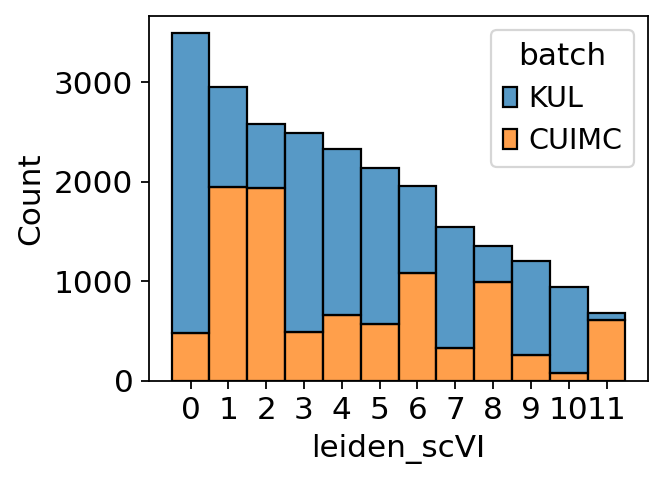

In [99]:
plt.figure(figsize=(4,3))
ax = sns.histplot(KUL_CUIMC_cd8_diffmap.obs, x='leiden_scVI', hue='batch', multiple='stack')
ax.grid(False)
plt.savefig('fig/4- Immune T Cells/KUL_CUIMC_leiden_histplot.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

# Phenotypic Volume plots

## Figure 5B- T cell comparisons: {CD8, CD4, Treg} x {pre, on, post}

In [24]:
comparison = 'tcell_ct_time' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(96, 9)

In [25]:
pv = pv[[
    'CD8+ T_pre', 'CD8+ T_on', 'CD8+ T_post',
    'CD4+ T_pre', 'CD4+ T_on', 'CD4+ T_post', 
    'Treg_pre', 'Treg_on', 'Treg_post',
]] 

2025-03-11 18:10:22,082 | INFO : maxp pruned
2025-03-11 18:10:22,091 | INFO : cmap pruned
2025-03-11 18:10:22,094 | INFO : kern dropped
2025-03-11 18:10:22,094 | INFO : post pruned
2025-03-11 18:10:22,095 | INFO : FFTM dropped
2025-03-11 18:10:22,098 | INFO : GPOS pruned
2025-03-11 18:10:22,101 | INFO : GSUB pruned
2025-03-11 18:10:22,426 | INFO : glyf pruned
2025-03-11 18:10:22,428 | INFO : Added gid0 to subset
2025-03-11 18:10:22,428 | INFO : Added first four glyphs to subset
2025-03-11 18:10:22,428 | INFO : Closing glyph list over 'GSUB': 25 glyphs before
2025-03-11 18:10:22,429 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'T', 'e', 'eight', 'five', 'four', 'g', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'space', 't', 'underscore', 'zero']
2025-03-11 18:10:22,431 | INFO : Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 23, 24, 27, 28, 38, 39, 55, 66, 72, 74, 81, 82, 83, 85, 86, 87, 3228]
2025-03-11 18:10:22,432 | INFO : Closed glyph list

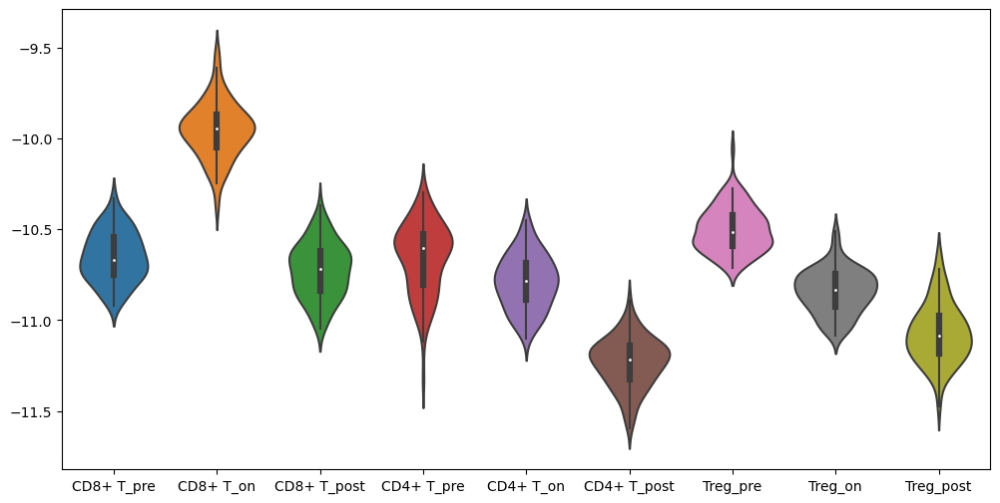

In [26]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S6B- T cell comparisons: {CD8, CD4, Treg} x {R, NR} and {R, NR} x {pre, on, post}

In [27]:
comparison = 'tcell_ct_responder' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(72, 6)

In [28]:
pv = pv[[
    'CD8+ T_Responder','CD8+ T_Non-responder','CD4+ T_Responder','CD4+ T_Non-responder','Treg_Responder','Treg_Non-responder',
]]

In [ ]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [30]:
comparison = 'tcell_responder_time' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(260, 6)

In [31]:
pv = pv[[
    'Responder_pre', 'Responder_on', 'Responder_post',
    'Non-responder_pre', 'Non-responder_on', 'Non-responder_post',
]] 

In [ ]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S7C- Myeloid comparisons: {Mac, Mono, DC} x {R, NR}; {Mac, Mono, DC} x {Pre, On, Post}

In [119]:
comparison = 'myeloid_ct_responder' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(201, 6)

In [120]:
pv = pv[[
    'Macrophage_Responder','Macrophage_Non-responder',
    'Monocyte_Responder','Monocyte_Non-responder',
    'DC_Responder','DC_Non-responder',
]]      

2025-03-24 22:32:06,042 | INFO : maxp pruned
2025-03-24 22:32:06,050 | INFO : cmap pruned
2025-03-24 22:32:06,050 | INFO : kern dropped
2025-03-24 22:32:06,051 | INFO : post pruned
2025-03-24 22:32:06,051 | INFO : FFTM dropped
2025-03-24 22:32:06,053 | INFO : GPOS pruned
2025-03-24 22:32:06,056 | INFO : GSUB pruned
2025-03-24 22:32:06,061 | INFO : glyf pruned
2025-03-24 22:32:06,063 | INFO : Added gid0 to subset
2025-03-24 22:32:06,063 | INFO : Added first four glyphs to subset
2025-03-24 22:32:06,064 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-03-24 22:32:06,064 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'M', 'N', 'R', 'a', 'c', 'd', 'e', 'four', 'g', 'h', 'hyphen', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:32:06,065 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 38, 39, 48, 49, 53, 66, 68, 70, 71, 72, 74, 75, 81, 82, 83, 85, 86, 87, 92, 3228]
2025-03-24 2

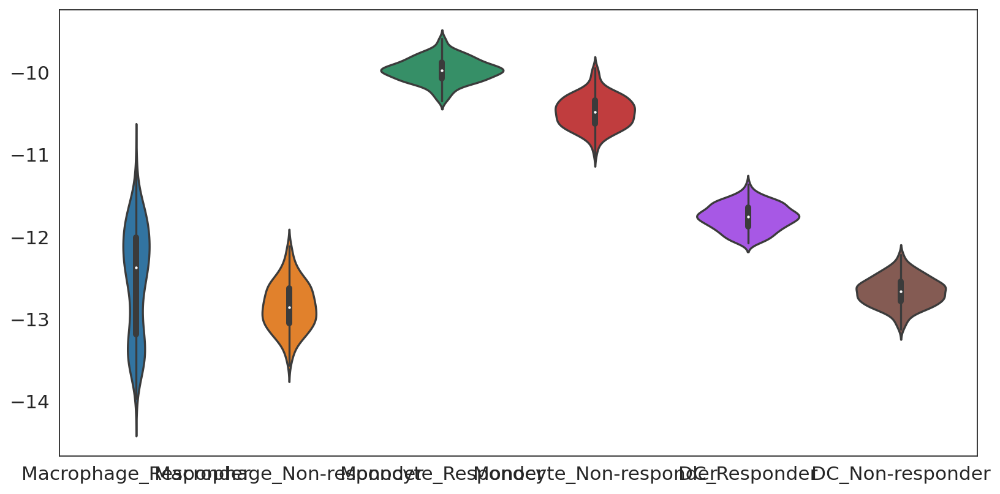

In [121]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [122]:
comparison = 'myeloid_ct_time' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(203, 9)

In [123]:
pv = pv[[
    'Macrophage_pre','Macrophage_on','Macrophage_post',
    'Monocyte_pre','Monocyte_on','Monocyte_post',
    'DC_pre','DC_on','DC_post',
]]      

2025-03-24 22:32:09,639 | INFO : maxp pruned
2025-03-24 22:32:09,646 | INFO : cmap pruned
2025-03-24 22:32:09,647 | INFO : kern dropped
2025-03-24 22:32:09,647 | INFO : post pruned
2025-03-24 22:32:09,647 | INFO : FFTM dropped
2025-03-24 22:32:09,649 | INFO : GPOS pruned
2025-03-24 22:32:09,652 | INFO : GSUB pruned
2025-03-24 22:32:09,656 | INFO : glyf pruned
2025-03-24 22:32:09,657 | INFO : Added gid0 to subset
2025-03-24 22:32:09,657 | INFO : Added first four glyphs to subset
2025-03-24 22:32:09,657 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-03-24 22:32:09,658 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'M', 'a', 'c', 'e', 'five', 'four', 'g', 'h', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:32:09,659 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 28, 38, 39, 48, 66, 68, 70, 72, 74, 75, 81, 82, 83, 85, 86, 87, 92, 3228]
2025-03-24 22:32:09,660 | INF

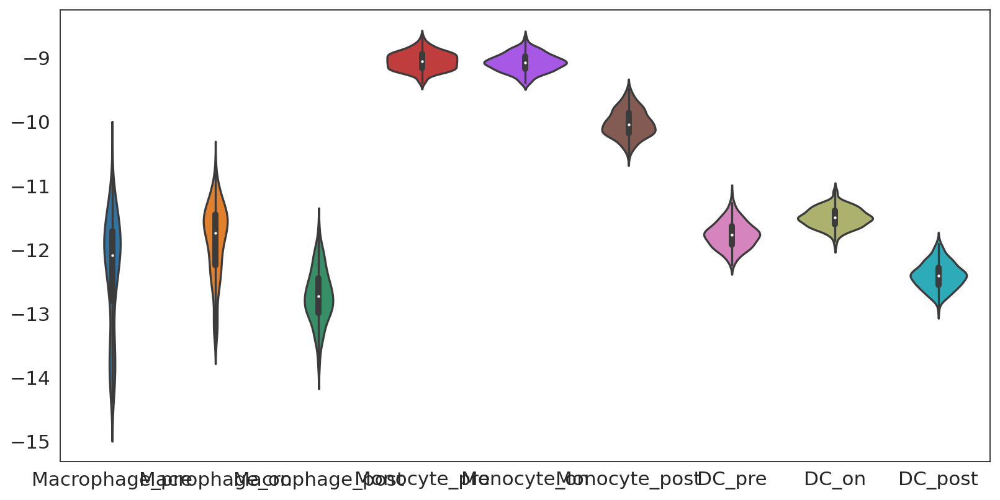

In [124]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [125]:
comparison = 'myeloid_ct_treated' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(360, 6)

In [126]:
pv = pv[[
    'Macrophage_Untreated','Macrophage_Treated',
    'Monocyte_Untreated','Monocyte_Treated',
    'DC_Untreated','DC_Treated',
]]      

2025-03-24 22:32:14,490 | INFO : maxp pruned
2025-03-24 22:32:14,498 | INFO : cmap pruned
2025-03-24 22:32:14,498 | INFO : kern dropped
2025-03-24 22:32:14,499 | INFO : post pruned
2025-03-24 22:32:14,499 | INFO : FFTM dropped
2025-03-24 22:32:14,501 | INFO : GPOS pruned
2025-03-24 22:32:14,504 | INFO : GSUB pruned
2025-03-24 22:32:14,509 | INFO : glyf pruned
2025-03-24 22:32:14,510 | INFO : Added gid0 to subset
2025-03-24 22:32:14,510 | INFO : Added first four glyphs to subset
2025-03-24 22:32:14,510 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-03-24 22:32:14,511 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'M', 'T', 'U', 'a', 'c', 'd', 'e', 'five', 'four', 'g', 'h', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:32:14,512 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 28, 38, 39, 48, 55, 56, 66, 68, 70, 71, 72, 74, 75, 81, 82, 83, 85, 87, 92, 3228]
2025-03-24 

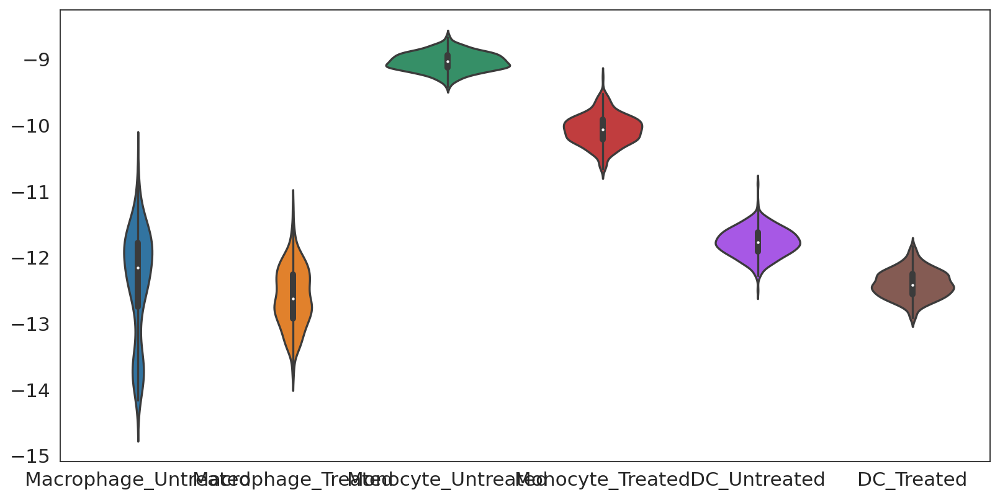

In [127]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [128]:
comparison = 'myeloid_responder_time' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(87, 6)

In [129]:
pv = pv[[
    'Responder_pre','Responder_on','Responder_post',
    'Non-responder_pre','Non-responder_on','Non-responder_post',
]]      

2025-03-24 22:32:16,802 | INFO : maxp pruned
2025-03-24 22:32:16,809 | INFO : cmap pruned
2025-03-24 22:32:16,810 | INFO : kern dropped
2025-03-24 22:32:16,810 | INFO : post pruned
2025-03-24 22:32:16,810 | INFO : FFTM dropped
2025-03-24 22:32:16,812 | INFO : GPOS pruned
2025-03-24 22:32:16,816 | INFO : GSUB pruned
2025-03-24 22:32:16,820 | INFO : glyf pruned
2025-03-24 22:32:16,822 | INFO : Added gid0 to subset
2025-03-24 22:32:16,822 | INFO : Added first four glyphs to subset
2025-03-24 22:32:16,822 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2025-03-24 22:32:16,822 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'd', 'e', 'five', 'hyphen', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'zero']
2025-03-24 22:32:16,823 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 24, 49, 53, 66, 71, 72, 81, 82, 83, 85, 86, 87, 3228]
2025-03-24 22:32:16,825 | INFO : Closed glyph list over 'GSUB': 23 gly

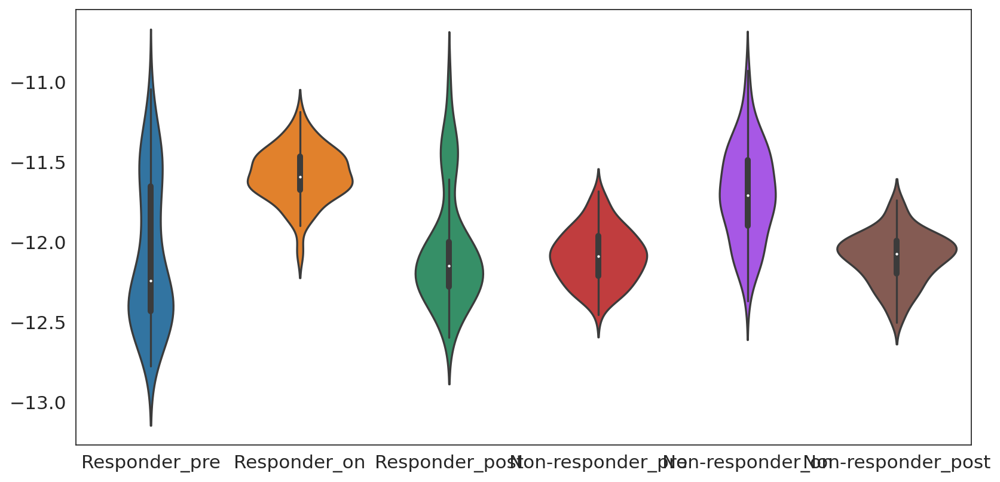

In [130]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [131]:
comparison = 'myeloid_treated_responder' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(88, 4)

In [132]:
pv = pv[[
    'Untreated_Responder','Treated_Responder','Untreated_Non-responder','Treated_Non-responder'
]]      

2025-03-24 22:32:23,512 | INFO : maxp pruned
2025-03-24 22:32:23,521 | INFO : cmap pruned
2025-03-24 22:32:23,521 | INFO : kern dropped
2025-03-24 22:32:23,521 | INFO : post pruned
2025-03-24 22:32:23,521 | INFO : FFTM dropped
2025-03-24 22:32:23,523 | INFO : GPOS pruned
2025-03-24 22:32:23,526 | INFO : GSUB pruned
2025-03-24 22:32:23,532 | INFO : glyf pruned
2025-03-24 22:32:23,533 | INFO : Added gid0 to subset
2025-03-24 22:32:23,533 | INFO : Added first four glyphs to subset
2025-03-24 22:32:23,533 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-03-24 22:32:23,533 | INFO : Glyph names: ['.notdef', '.null', 'N', 'R', 'T', 'U', 'a', 'd', 'e', 'five', 'hyphen', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'zero']
2025-03-24 22:32:23,534 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 24, 26, 49, 53, 55, 56, 66, 68, 71, 72, 81, 82, 83, 85, 86, 87, 3228]
2025-03-24 22:32:23,536 | INFO : Closed gly

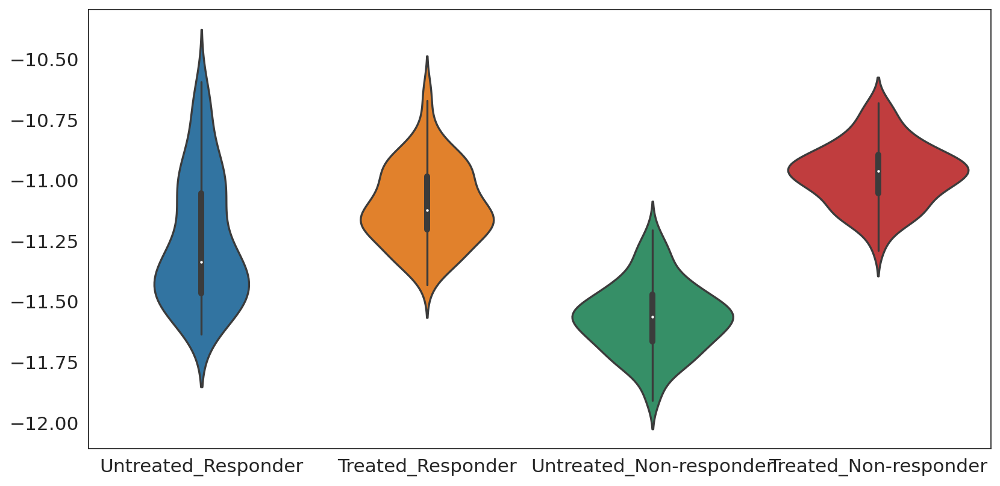

In [133]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

## Figure S7C- Monocyte/Macrophage subtype comparisons: {subtype} x {R, NR}; {subtype} x {Pre, On, Post}

In [135]:
comparison = 'macrophages_ct_responder' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(114, 10)

In [136]:
pv.columns

Index(['Antigen-presenting Macrophage_Non-responder',
       'Phagocytic Macrophage_Non-responder',
       'M2-like Macrophage_Non-responder', 'Monocyte_Non-responder',
       'Antigen-presenting Macrophage_Responder',
       'Phagocytic Macrophage_Responder', 'M2-like Macrophage_Responder',
       'Monocyte_Responder', 'M1-like Macrophage_Responder',
       'M1-like Macrophage_Non-responder'],
      dtype='object')

In [137]:
pv = pv[[
    'Monocyte_Responder', 'Monocyte_Non-responder', 
    'Antigen-presenting Macrophage_Responder', 'Antigen-presenting Macrophage_Non-responder', 
    'Phagocytic Macrophage_Responder', 'Phagocytic Macrophage_Non-responder', 
    'M1-like Macrophage_Responder', 'M1-like Macrophage_Non-responder', 
    'M2-like Macrophage_Responder', 'M2-like Macrophage_Non-responder', 
]] 

2025-03-24 22:33:58,265 | INFO : maxp pruned
2025-03-24 22:33:58,274 | INFO : cmap pruned
2025-03-24 22:33:58,274 | INFO : kern dropped
2025-03-24 22:33:58,274 | INFO : post pruned
2025-03-24 22:33:58,275 | INFO : FFTM dropped
2025-03-24 22:33:58,278 | INFO : GPOS pruned
2025-03-24 22:33:58,281 | INFO : GSUB pruned
2025-03-24 22:33:58,286 | INFO : glyf pruned
2025-03-24 22:33:58,287 | INFO : Added gid0 to subset
2025-03-24 22:33:58,287 | INFO : Added first four glyphs to subset
2025-03-24 22:33:58,288 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-03-24 22:33:58,288 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'N', 'P', 'R', 'a', 'c', 'd', 'e', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:33:58,289 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 36, 48, 49, 51, 53, 66, 68, 70, 71, 72, 74, 75, 76, 78, 79, 81, 82, 83, 85, 86,

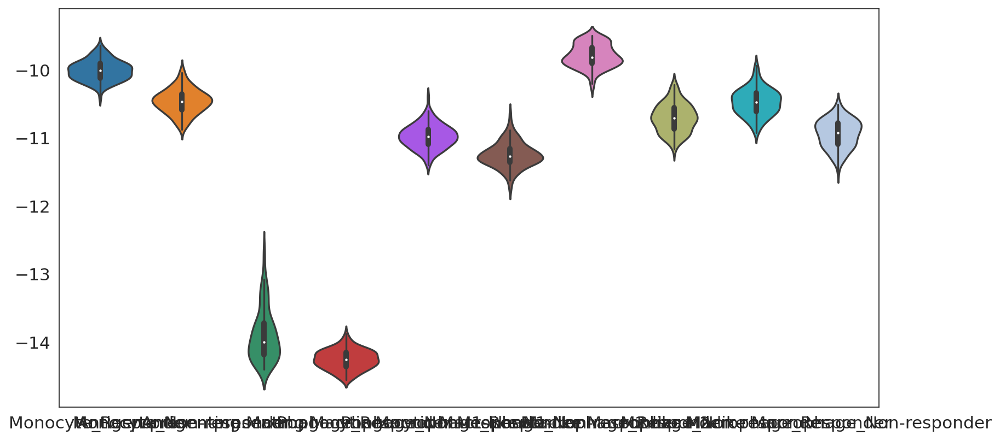

In [138]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [139]:
comparison = 'macrophages_ct_time' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(109, 15)

In [141]:
pv = pv[[
    'Monocyte_pre', 'Monocyte_on', 'Monocyte_post', 
    'Antigen-presenting Macrophage_pre', 'Antigen-presenting Macrophage_on', 'Antigen-presenting Macrophage_post', 
    'Phagocytic Macrophage_pre', 'Phagocytic Macrophage_on', 'Phagocytic Macrophage_post', 
    'M1-like Macrophage_pre', 'M1-like Macrophage_on', 'M1-like Macrophage_post', 
    'M2-like Macrophage_pre', 'M2-like Macrophage_on', 'M2-like Macrophage_post', 
]] 

2025-03-24 22:35:14,226 | INFO : maxp pruned
2025-03-24 22:35:14,234 | INFO : cmap pruned
2025-03-24 22:35:14,234 | INFO : kern dropped
2025-03-24 22:35:14,235 | INFO : post pruned
2025-03-24 22:35:14,235 | INFO : FFTM dropped
2025-03-24 22:35:14,237 | INFO : GPOS pruned
2025-03-24 22:35:14,240 | INFO : GSUB pruned
2025-03-24 22:35:14,246 | INFO : glyf pruned
2025-03-24 22:35:14,247 | INFO : Added gid0 to subset
2025-03-24 22:35:14,247 | INFO : Added first four glyphs to subset
2025-03-24 22:35:14,247 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-03-24 22:35:14,248 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'a', 'c', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:35:14,249 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 24, 28, 36, 48, 51, 66, 68, 70, 72, 74, 75, 76, 78, 79, 81, 82, 83, 85, 86, 87

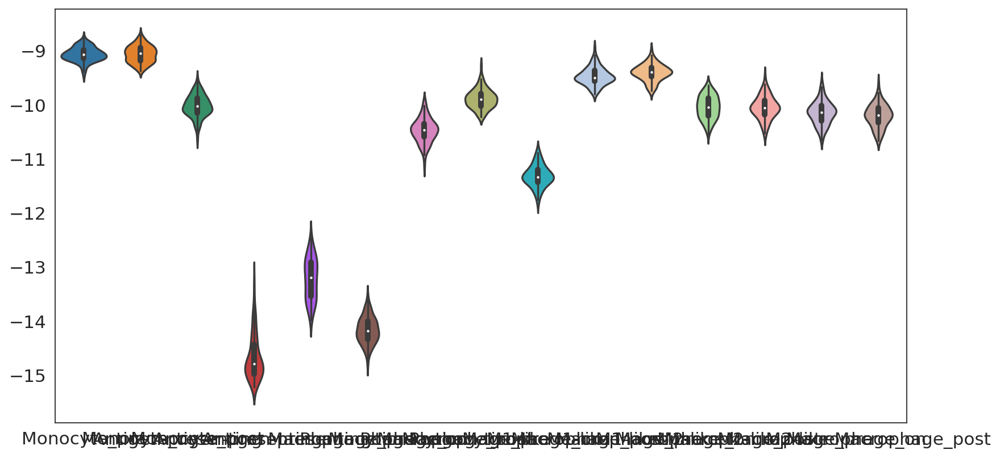

In [142]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')

In [143]:
comparison = 'macrophages_ct_treated' # filename
pv = pd.read_csv('PV_022725/' + comparison + '.csv', index_col=0)
pv.shape

(177, 10)

In [144]:
pv = pv[[
    'Monocyte_Untreated', 'Monocyte_Treated', 
    'Antigen-presenting Macrophage_Untreated', 'Antigen-presenting Macrophage_Treated', 
    'Phagocytic Macrophage_Untreated', 'Phagocytic Macrophage_Treated', 
    'M1-like Macrophage_Untreated', 'M1-like Macrophage_Treated', 
    'M2-like Macrophage_Untreated', 'M2-like Macrophage_Treated', 
]] 

2025-03-24 22:36:07,352 | INFO : maxp pruned
2025-03-24 22:36:07,360 | INFO : cmap pruned
2025-03-24 22:36:07,361 | INFO : kern dropped
2025-03-24 22:36:07,361 | INFO : post pruned
2025-03-24 22:36:07,362 | INFO : FFTM dropped
2025-03-24 22:36:07,364 | INFO : GPOS pruned
2025-03-24 22:36:07,367 | INFO : GSUB pruned
2025-03-24 22:36:07,372 | INFO : glyf pruned
2025-03-24 22:36:07,373 | INFO : Added gid0 to subset
2025-03-24 22:36:07,373 | INFO : Added first four glyphs to subset
2025-03-24 22:36:07,374 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-03-24 22:36:07,374 | INFO : Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'T', 'U', 'a', 'c', 'd', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'y', 'zero']
2025-03-24 22:36:07,375 | INFO : Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 24, 28, 36, 48, 51, 55, 56, 66, 68, 70, 71, 72, 74, 75, 76, 78,

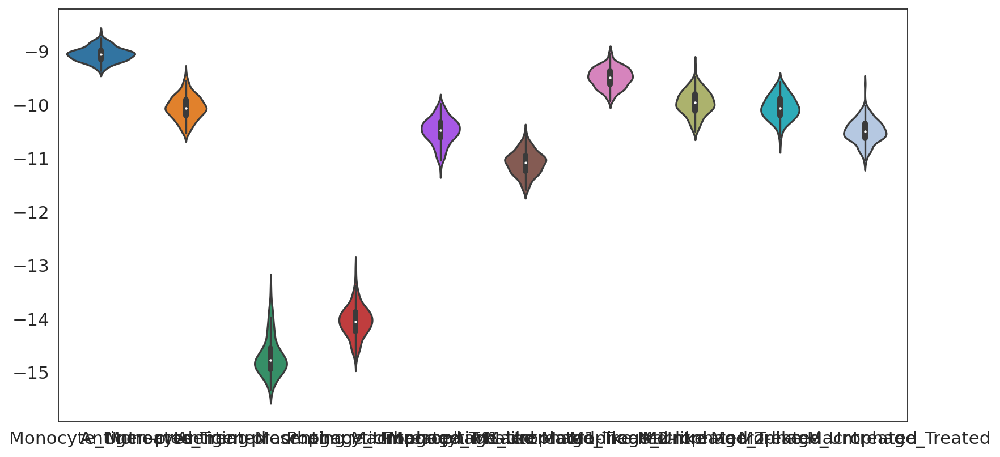

In [145]:
plt.figure(figsize=(12,6))
fig = sns.violinplot(pv)
plt.savefig('PV_022725/' + comparison + '.pdf', format='pdf', dpi=300, transparent=True, bbox_inches='tight')